## Импорт библиотек

In [ ]:
# !pip install zeep
# !pip install yfinance
# !pip install pymannkendall

In [27]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
# import scipy.stats as scs
# import statsmodels.tsa.stattools as stat
import statsmodels.graphics.tsaplots as spl
# import statsmodels.graphics.gofplots
# import statsmodels.tsa.seasonal as season
from statsmodels.tsa.seasonal import seasonal_decompose

# import statsmodels.formula.api as smf
# import statsmodels.tsa.api as smt
# import statsmodels.api as sm
# import pymannkendall as mk
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.gofplots import ProbPlot

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from datetime import datetime
from zeep import Client
# from zeep.wsse.username import UsernameToken
import requests
from io import StringIO
# import io
import yfinance as yf

# import matplotlib as mpl
# %matplotlib inline
# sns.set(style="whitegrid")

pd.set_option('display.max_columns', None)
from IPython.core.display import display, HTML
# display(HTML("<style>.container { width:98% ! important; }<style>"))

/tmp/ipykernel_9776/2433064727.py:36: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython.display
  from IPython.core.display import display, HTML


# 1. Сбор данных

In [70]:
import importlib 
import data_download_functions
importlib.reload(data_download_functions)

<module 'data_download_functions' from '/mnt/c/Users/User/Desktop/ML_DL_knowledge/RiskManagement/project2/data_download_functions.py'>

In [71]:
from data_download_functions import (download_int_rates,
                                     get_moex_data_bond,
                                     get_moex_data_sha,
                                     get_moex_data_idx)

Кривая тут https://www.cbr.ru/hd_base/zcyc_params/zcyc/. Все ожидают снижения процентных ставок в будущем, поэтому кривая инвертированная

Заходим на сайт ЦБ, который предоставляет данные по API: https://www.cbr.ru/secinfo/secinfo.asmx, далее в https://www.cbr.ru/secinfo/secinfo.asmx?WSDL и уже используя метод `ZCYC` получаем код для данных

## 1.a Скачиваем процентные ставки

In [56]:
interest_rates = download_int_rates(from_date = '2021-01-01T00:00:00', to_date = '2025-01-01T23:59:59')

Forcing soap:address location to HTTPS
Forcing soap:address location to HTTPS


In [57]:
interest_rates

,date,y_0_25,y_0_5,y_0_75,y_1,y_2,y_3,y_5,y_7,y_10,y_15,y_20,y_30
0,2024-12-30 00:00:00+03:00,18.80,18.75,18.68,18.58,18.06,17.48,16.53,15.87,15.22,14.57,14.22,13.90
1,2024-12-28 00:00:00+03:00,18.55,18.58,18.57,18.53,18.15,17.67,16.83,16.21,15.57,14.92,14.55,14.20
2,2024-12-27 00:00:00+03:00,17.49,17.59,17.64,17.67,17.56,17.29,16.65,16.08,15.43,14.75,14.36,13.99
3,2024-12-26 00:00:00+03:00,17.97,17.99,17.98,17.96,17.70,17.33,16.57,15.95,15.28,14.62,14.26,13.94
4,2024-12-25 00:00:00+03:00,18.33,18.33,18.30,18.24,17.88,17.44,16.58,15.91,15.21,14.52,14.15,13.80
...,...,...,...,...,...,...,...,...,...,...,...,...,...
997,2021-01-11 00:00:00+03:00,4.17,4.19,4.22,4.26,4.56,4.92,5.52,5.93,6.34,6.70,6.89,7.07
998,2021-01-08 00:00:00+03:00,3.78,3.88,3.99,4.08,4.46,4.84,5.45,5.85,6.24,6.59,6.76,6.92
999,2021-01-06 00:00:00+03:00,3.85,3.95,4.04,4.11,4.42,4.79,5.40,5.83,6.24,6.62,6.82,7.03
1000,2021-01-05 00:00:00+03:00,3.98,4.04,4.11,4.18,4.48,4.82,5.38,5.80,6.22,6.62,6.84,7.06


## 1.b Скачиваем описание облигаций ОФЗ ПД (постоянный доход)

Список облигаций:
1. https://www.moex.com/ru/issue.aspx?board=TQOB&code=SU26212RMFS9 ОФЗ-ПД 26212 19/01/28 SU26212RMFS9
2. https://www.moex.com/ru/issue.aspx?board=TQOB&code=SU26228RMFS5 ОФЗ-ПД 26228 10/04/30 SU26228RMFS5
3. https://www.moex.com/ru/issue.aspx?board=TQOB&code=SU26225RMFS1 ОФЗ-ПД 26225 10/05/34 SU26225RMFS1
4. https://www.moex.com/ru/issue.aspx?board=TQOB&code=SU26207RMFS9 ОФЗ-ПД 26207 03/02/27 SU26207RMFS9
5. https://www.moex.com/ru/issue.aspx?board=TQOB&code=SU26224RMFS4 ОФЗ-ПД 26224 23/05/29 SU26224RMFS4

In [35]:
bonds_list = ['SU26228RMFS5', 'SU26212RMFS9', 'SU26207RMFS9', 'SU26224RMFS4', 'SU26225RMFS1']

skiprows = [*range(32)]

bonds = pd.DataFrame()

for i in bonds_list:
    url = f'https://iss.moex.com/iss/securities/{i}.csv'
    urlData = requests.get(url).content
    df = pd.read_csv(url, encoding="windows-1251", sep=';', skiprows = lambda x: x not in skiprows, header=1)
    df['bond'] = i
    df = df[['title', 'value', 'bond']]
    df = df.pivot(index="bond", columns="title", values="value").reset_index()
    bonds = pd.concat([bonds, df])

In [40]:
bonds

title,bond,ISIN код,Английское наименование,Бумаги для квалифицированных инвесторов,Валюта номинала,Возможен досрочный выкуп,Дата выплаты купона,Дата начала торгов,Дата начала торгов на Московской Бирже,Дата погашения,Дата принятия решения организатором торговли о включении ценной бумаги в Список,Дней до погашения,Допуск к утренней дополнительной торговой сессии,Допущен дефолт,Допущен технический дефолт,Код ценной бумаги,Краткое наименование,Наименование ценной бумаги,Наличие проспекта,Номер государственной регистрации,Номинальная стоимость,Облигации размещены с целью финансирования соглашений о партнерстве,Объем выпуска,Первоначальная номинальная стоимость,Периодичность выплаты купона в год,Полное наименование,"Ставка купона, %","Сумма купона, в валюте номинала",Уровень листинга,Эмитент не соответствует требованию на текущий Список,Допуск к вечерней дополнительной торговой сессии
0,SU26228RMFS5,RU000A100A82,OFZ-PD 26228,0,SUR,0,2025-10-15,2019-04-24,2019-04-24,2030-04-10,2019-04-23,1749,1,0,0,SU26228RMFS5,ОФЗ 26228,облигации федерального займа с постоянным купо...,0,26228RMFS,1000,0,492018800,1000,2,ОФЗ-ПД 26228 10/04/30,7.65,38.15,1,0,NaN
0,SU26212RMFS9,RU000A0JTK38,OFZ-PD 26212,0,SUR,NaN,2025-07-23,2013-01-23,2013-01-23,2028-01-19,2013-01-22,937,1,0,0,SU26212RMFS9,ОФЗ 26212,облигации федерального займа с постоянным купо...,0,26212RMFS,1000,0,356981514,1000,2,ОФЗ-ПД 26212 19/01/28,7.05,35.15,1,0,1
0,SU26207RMFS9,RU000A0JS3W6,OFZ-PD 26207,0,SUR,NaN,2025-08-06,2012-02-22,2012-02-22,2027-02-03,2012-02-16,587,1,0,0,SU26207RMFS9,ОФЗ 26207,Облигации федерального займа с постоянным купо...,0,26207RMFS,1000,0,370299980,1000,2,ОФЗ-ПД 26207 03/02/27,8.15,40.64,1,0,1
0,SU26224RMFS4,RU000A0ZYUA9,OFZ-PD 26224,0,SUR,0,2025-11-26,2018-02-21,2018-03-07,2029-05-23,2018-02-20,1427,1,0,0,SU26224RMFS4,ОФЗ 26224,облигации федерального займа с постоянным купо...,0,26224RMFS,1000,0,396912955,1000,2,ОФЗ-ПД 26224 23/05/29,6.9,34.41,1,0,NaN
0,SU26225RMFS1,RU000A0ZYUB7,OFZ-PD 26225,0,SUR,0,2025-11-19,2018-02-21,2018-02-28,2034-05-10,2018-02-20,3240,1,0,0,SU26225RMFS1,ОФЗ 26225,облигации федерального займа с постоянным купо...,0,26225RMFS,1000,0,397974096,1000,2,ОФЗ-ПД 26225 10/05/34,7.25,36.15,1,0,NaN


## 1.c Рыночные котировки этих облигаций

In [63]:
bond_quotes = pd.DataFrame()
for i in bonds_list:
    df = get_moex_data_bond(i, "2021-01-01", "2025-01-01")
    bond_quotes = pd.concat([bond_quotes, df])

bond_quotes = bond_quotes[['TRADEDATE', 'SHORTNAME', 'SECID', 'NUMTRADES', 'VALUE', 'LOW', 'HIGH', 'CLOSE',
                          'ACCINT', #нкд - накопленный купонный доход
                         'WAPRICE', # Средневзвешенная цена
                          'YIELDCLOSE', # Доходность к погашению по цене последней сделки (Close)
                          'OPEN', 'VOLUME',
                          'MARKETPRICE2', # Рыночная цена, рассчитанная в соответствии с Постановлением ФКЦБ
                          'MARKETPRICE3', # Рыночная цена 3
                          'ADMITTEDQUOTE', # Признаваемая котировка
                          'DURATION',
                          'COUPONPERCENT', 'COUPONVALUE', 'LASTTRADEDATE', 'FACEVALUE', 'CURRENCYID', 'FACEUNIT', 'TRADINGSESSION']]

In [64]:
bond_quotes

,TRADEDATE,SHORTNAME,SECID,NUMTRADES,VALUE,LOW,HIGH,CLOSE,ACCINT,WAPRICE,YIELDCLOSE,OPEN,VOLUME,MARKETPRICE2,MARKETPRICE3,ADMITTEDQUOTE,DURATION,COUPONPERCENT,COUPONVALUE,LASTTRADEDATE,FACEVALUE,CURRENCYID,FACEUNIT,TRADINGSESSION
0,2021-01-04,ОФЗ 26228,SU26228RMFS5,90,1.082319e+06,112.600,113.589,113.050,15.72,113.095,5.89,113.589,957,113.095,113.095,113.050,2510,7.65,38.15,2021-01-04,1000,SUR,RUB,3
1,2021-01-05,ОФЗ 26228,SU26228RMFS5,110,1.867626e+06,112.941,113.321,112.941,15.93,113.258,5.91,113.001,1649,113.258,113.258,112.966,2510,7.65,38.15,2021-01-05,1000,SUR,RUB,3
2,2021-01-06,ОФЗ 26228,SU26228RMFS5,52,3.590218e+05,113.027,113.595,113.053,16.14,113.256,5.89,113.595,317,NaN,113.252,113.054,2509,7.65,38.15,2021-01-06,1000,SUR,RUB,3
3,2021-01-08,ОФЗ 26228,SU26228RMFS5,57,5.760908e+05,112.943,113.318,113.251,16.56,113.181,5.86,113.318,509,113.181,113.181,113.251,2507,7.65,38.15,2021-01-08,1000,SUR,RUB,3
4,2021-01-11,ОФЗ 26228,SU26228RMFS5,158,2.130890e+08,112.200,113.268,112.500,17.19,112.426,5.96,113.268,189458,112.473,112.473,112.498,2500,7.65,38.15,2021-01-11,1000,SUR,RUB,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1012,2024-12-25,ОФЗ 26225,SU26225RMFS1,1758,6.631439e+07,59.914,60.700,60.205,6.95,60.105,16.00,60.681,110331,60.081,60.081,NaN,2220,7.25,36.15,2024-12-25,1000,SUR,RUB,3
1013,2024-12-26,ОФЗ 26225,SU26225RMFS1,1682,1.674005e+08,60.130,60.921,60.396,7.15,60.384,15.94,60.205,277226,60.379,60.379,NaN,2222,7.25,36.15,2024-12-26,1000,SUR,RUB,3
1014,2024-12-27,ОФЗ 26225,SU26225RMFS1,1590,4.220086e+08,59.752,60.800,60.348,7.35,60.375,15.96,60.635,698982,60.376,60.376,NaN,2221,7.25,36.15,2024-12-27,1000,SUR,RUB,3
1015,2024-12-28,ОФЗ 26225,SU26225RMFS1,1466,2.973391e+07,59.900,60.774,60.318,7.55,60.316,15.97,60.348,49297,60.318,60.318,NaN,2218,7.25,36.15,2024-12-28,1000,SUR,RUB,3


## 1.d Котировки 10 российских акций

In [67]:
shares_quotes = pd.DataFrame()
for i in ['SBER', 'GAZP', 'ROSN', 'LKOH', 'GMKN', 'NVTK', 'TRNFP', 'MGNT', 'MTSS', 'YNDX']:
    df = get_moex_data_sha(i, "2021-01-01", "2025-01-01")
    shares_quotes = pd.concat([shares_quotes, df])

shares_quotes = shares_quotes[['TRADEDATE', 'SHORTNAME', 'SECID', 'NUMTRADES', 'VALUE',
       'OPEN', 'LOW', 'HIGH', 'LEGALCLOSEPRICE', 'WAPRICE', 'CLOSE', 'VOLUME',
       'MARKETPRICE2', 'MARKETPRICE3', 'ADMITTEDQUOTE', 'MP2VALTRD',
       'MARKETPRICE3TRADESVALUE', 'ADMITTEDVALUE', 'WAVAL', 'TRADINGSESSION',
       'CURRENCYID', 'TRENDCLSPR']]

In [68]:
shares_quotes

,TRADEDATE,SHORTNAME,SECID,NUMTRADES,VALUE,OPEN,LOW,HIGH,LEGALCLOSEPRICE,WAPRICE,CLOSE,VOLUME,MARKETPRICE2,MARKETPRICE3,ADMITTEDQUOTE,MP2VALTRD,MARKETPRICE3TRADESVALUE,ADMITTEDVALUE,WAVAL,TRADINGSESSION,CURRENCYID,TRENDCLSPR
0,2021-01-04,Сбербанк,SBER,74192,1.343454e+10,274.67,270.61,276.60,276.00,274.61,272.00,48922920,275.06,275.06,276.00,1.099544e+10,1.099544e+10,1.099544e+10,0,3,SUR,0.13
1,2021-01-05,Сбербанк,SBER,74787,1.244994e+10,272.69,270.28,275.70,273.82,273.12,275.20,45583910,272.97,272.97,273.82,1.133575e+10,1.133575e+10,1.133575e+10,0,3,SUR,1.18
2,2021-01-06,Сбербанк,SBER,64392,1.119879e+10,275.94,271.62,275.94,274.68,273.49,272.93,40948520,273.45,273.45,274.68,9.933000e+09,9.933000e+09,9.933000e+09,0,3,SUR,-0.82
3,2021-01-08,Сбербанк,SBER,126247,2.496560e+10,275.11,275.11,283.99,282.08,280.74,283.64,88928790,280.62,280.62,282.08,2.341421e+10,2.341421e+10,2.341421e+10,0,3,SUR,3.92
4,2021-01-11,Сбербанк,SBER,167977,3.238759e+10,282.86,279.48,292.95,288.85,288.30,289.49,112349520,288.23,288.23,288.85,3.106934e+10,3.106934e+10,3.106934e+10,0,3,SUR,2.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
887,2024-07-03,Yandex clA,YNDX,0,0.000000e+00,NaN,NaN,NaN,4073.20,NaN,NaN,0,NaN,4090.00,NaN,0.000000e+00,6.135000e+05,NaN,0,3,SUR,NaN
888,2024-07-04,Yandex clA,YNDX,0,0.000000e+00,NaN,NaN,NaN,4073.20,NaN,NaN,0,NaN,4090.00,NaN,0.000000e+00,6.135000e+05,NaN,0,3,SUR,NaN
889,2024-07-05,Yandex clA,YNDX,0,0.000000e+00,NaN,NaN,NaN,4073.20,NaN,NaN,0,NaN,4090.00,NaN,0.000000e+00,6.135000e+05,NaN,0,3,SUR,NaN
890,2024-07-08,Yandex clA,YNDX,0,0.000000e+00,NaN,NaN,NaN,4073.20,NaN,NaN,0,NaN,4090.00,NaN,0.000000e+00,6.135000e+05,NaN,0,3,SUR,NaN


## 1.e Значения индекса МосБиржи, индекса РТС, цены на нефть Brent и курса доллара и евро за тот же период

In [72]:
index_values = pd.DataFrame()
for i in ['MOEXBC', 'RTSI', 'IMOEX', 'IMOEX10']:
    df = get_moex_data_idx(i, "2021-01-01", "2025-01-01")
    index_values = pd.concat([index_values, df])

/tmp/ipykernel_9776/970326971.py:4: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  index_values = pd.concat([index_values, df])


In [73]:
index_values

,BOARDID,SECID,TRADEDATE,SHORTNAME,NAME,CLOSE,OPEN,HIGH,LOW,VALUE,DURATION,YIELD,DECIMALS,CAPITALIZATION,CURRENCYID,DIVISOR,TRADINGSESSION,VOLUME,TRADE_SESSION_DATE
0,RTSI,MOEXBC,2021-01-04,Индекс голубых фишек,Индекс МосБиржи голубых фишек,22057.67,21771.67,22057.67,21747.67,5.032124e+10,0,0,2,1.358970e+13,RUB,6.160985e+08,3,None,2021-01-04
1,RTSI,MOEXBC,2021-01-05,Индекс голубых фишек,Индекс МосБиржи голубых фишек,22109.01,21890.17,22160.66,21698.70,5.301180e+10,0,0,2,1.362133e+13,RUB,6.160985e+08,3,None,2021-01-05
2,RTSI,MOEXBC,2021-01-06,Индекс голубых фишек,Индекс МосБиржи голубых фишек,22211.91,22220.05,22269.25,22008.59,5.576058e+10,0,0,2,1.368472e+13,RUB,6.160985e+08,3,None,2021-01-06
3,RTSI,MOEXBC,2021-01-08,Индекс голубых фишек,Индекс МосБиржи голубых фишек,22752.43,22362.95,22927.20,22362.95,1.046062e+11,0,0,2,1.401774e+13,RUB,6.160985e+08,3,None,2021-01-08
4,RTSI,MOEXBC,2021-01-11,Индекс голубых фишек,Индекс МосБиржи голубых фишек,22967.97,22771.97,23208.75,22614.69,1.087189e+11,0,0,2,1.415053e+13,RUB,6.160985e+08,3,None,2021-01-11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,SNDX,IMOEX,2024-12-25,Индекс МосБиржи,Индекс МосБиржи,2732.83,2680.25,2751.11,2666.38,1.471084e+11,0,0,2,5.910295e+12,RUB,2.162703e+09,3,None,2024-12-25
996,SNDX,IMOEX,2024-12-26,Индекс МосБиржи,Индекс МосБиржи,2766.57,2749.49,2776.33,2738.31,1.093092e+11,0,0,2,5.983264e+12,RUB,2.162703e+09,3,None,2024-12-26
997,SNDX,IMOEX,2024-12-27,Индекс МосБиржи,Индекс МосБиржи,2757.45,2754.56,2766.03,2743.18,7.307235e+10,0,0,2,5.963554e+12,RUB,2.162703e+09,3,None,2024-12-27
998,SNDX,IMOEX,2024-12-28,Индекс МосБиржи,Индекс МосБиржи,2786.67,2763.48,2798.49,2763.48,7.881748e+10,0,0,2,6.026748e+12,RUB,2.162703e+09,3,None,2024-12-28


In [ ]:
RTSI = index_values[index_values['SECID'] == 'RTSI']
RTSI.reset_index(drop=True, inplace=True)

IMOEX = index_values[index_values['SECID'] == 'IMOEX']
IMOEX.reset_index(drop=True, inplace=True)

MOEXBC = index_values[index_values['SECID'] == 'MOEXBC']
MOEXBC.reset_index(drop=True, inplace=True)

In [79]:
RTSI.head()

,BOARDID,SECID,TRADEDATE,SHORTNAME,NAME,CLOSE,OPEN,HIGH,LOW,VALUE,DURATION,YIELD,DECIMALS,CAPITALIZATION,CURRENCYID,DIVISOR,TRADINGSESSION,VOLUME,TRADE_SESSION_DATE
0,RTSI,RTSI,2021-01-04,Индекс РТС,Индекс РТС,1424.84,1399.64,1439.61,1398.82,9.027736e+08,0,0,2,2.297333e+11,USD,1.612343e+08,3,None,2021-01-04
1,RTSI,RTSI,2021-01-05,Индекс РТС,Индекс РТС,1426.11,1410.89,1428.70,1386.56,9.658679e+08,0,0,2,2.299372e+11,USD,1.612343e+08,3,None,2021-01-05
2,RTSI,RTSI,2021-01-06,Индекс РТС,Индекс РТС,1436.71,1435.51,1446.21,1424.87,9.667538e+08,0,0,2,2.316462e+11,USD,1.612343e+08,3,None,2021-01-06
3,RTSI,RTSI,2021-01-08,Индекс РТС,Индекс РТС,1466.50,1444.76,1481.84,1444.76,1.780068e+09,0,0,2,2.364493e+11,USD,1.612343e+08,3,None,2021-01-08
4,RTSI,RTSI,2021-01-11,Индекс РТС,Индекс РТС,1466.56,1467.85,1488.56,1450.55,1.915552e+09,0,0,2,2.364596e+11,USD,1.612343e+08,3,None,2021-01-11


In [87]:
# Скачиваем Brent
brent_price = yf.download('BZ=F', start='2021-01-01', end='2025-01-01')

/tmp/ipykernel_9776/1719979541.py:2: FutureWarning: YF.download() has changed argument auto_adjust default to True
  brent_price = yf.download('BZ=F', start='2021-01-01', end='2025-01-01')


[*********************100%***********************]  1 of 1 completed


In [88]:
brent_price

Price,Close,High,Low,Open,Volume
Ticker,BZ=F,BZ=F,BZ=F,BZ=F,BZ=F
Date,,,,,
2021-01-04,51.090000,53.320000,50.580002,51.660000,50232
2021-01-05,53.599998,53.880001,50.619999,50.740002,62791
2021-01-06,54.299999,54.720001,53.150002,53.590000,49186
2021-01-07,54.380001,54.900002,53.939999,54.139999,30800
2021-01-08,55.990002,56.299999,54.360001,54.459999,37597
...,...,...,...,...,...
2024-12-24,73.580002,73.809998,72.779999,72.839996,8922
2024-12-26,73.260002,74.180000,72.980003,73.779999,5773


In [ ]:
# Скачиваем доллар и евро
url_usd = 'https://www.cbr.ru/scripts/XML_dynamic.asp?date_req1=01/01/2021&date_req2=01/01/2025&VAL_NM_RQ=R01235'
url_eur = 'https://www.cbr.ru/scripts/XML_dynamic.asp?date_req1=01/01/2021&date_req2=01/01/2025&VAL_NM_RQ=R01239'

usd = pd.read_xml(url_usd)
eur = pd.read_xml(url_eur)

In [95]:
usd

,Date,Id,Nominal,Value,VunitRate
0,01.01.2021,R01235,1,"73,8757","73,8757"
1,12.01.2021,R01235,1,"74,5157","74,5157"
2,13.01.2021,R01235,1,"74,2663","74,2663"
3,14.01.2021,R01235,1,"73,5264","73,5264"
4,15.01.2021,R01235,1,"73,7961","73,7961"
...,...,...,...,...,...
985,25.12.2024,R01235,1,"99,8729","99,8729"
986,26.12.2024,R01235,1,"99,6125","99,6125"
987,27.12.2024,R01235,1,"99,2295","99,2295"
988,28.12.2024,R01235,1,"100,5281","100,5281"


In [96]:
eur

,Date,Id,Nominal,Value,VunitRate
0,01.01.2021,R01239,1,"90,7932","90,7932"
1,12.01.2021,R01239,1,"90,8123","90,8123"
2,13.01.2021,R01239,1,"90,3227","90,3227"
3,14.01.2021,R01239,1,"89,7831","89,7831"
4,15.01.2021,R01239,1,"89,6475","89,6475"
...,...,...,...,...,...
985,25.12.2024,R01239,1,"104,2310","104,231"
986,26.12.2024,R01239,1,"103,9416","103,9416"
987,27.12.2024,R01239,1,"103,2997","103,2997"
988,28.12.2024,R01239,1,"105,9522","105,9522"


## 1.f Котировки фьючерса и опционов на фьючерс на один выбранный актив

Возьмем фьючерс на нефть Brent https://smart-lab.ru/q/futures/BRQ4/ с экспирацией в августе 2024

In [104]:
# URL опциона с фьючерса
futures_contract = pd.read_csv("https://iss.moex.com/iss/history/engines/futures/markets/forts/securities/BRQ4.csv",
                                encoding="windows-1251", sep=';', skiprows = lambda x: x not in skiprows, header=1)

In [105]:
futures_contract

,BOARDID,TRADEDATE,SECID,OPEN,LOW,HIGH,CLOSE,OPENPOSITIONVALUE,VALUE,VOLUME,OPENPOSITION,SETTLEPRICE,SWAPRATE,WAPRICE,SETTLEPRICEDAY,CHANGE,QTY,NUMTRADES
0,RFUD,2023-07-26,BRQ4,NaN,NaN,NaN,NaN,0.00,NaN,NaN,0,86.63,0.0,NaN,85.99,NaN,NaN,0
1,RFUD,2023-07-27,BRQ4,NaN,NaN,NaN,NaN,0.00,NaN,NaN,0,86.09,0.0,NaN,85.89,NaN,NaN,0
2,RFUD,2023-07-28,BRQ4,NaN,NaN,NaN,NaN,0.00,NaN,NaN,0,86.81,0.0,NaN,86.62,NaN,NaN,0
3,RFUD,2023-07-31,BRQ4,89.39,89.39,89.40,89.40,327450.04,163715.86,2.0,4,89.40,0.0,89.40,87.07,NaN,1.0,2
4,RFUD,2023-08-01,BRQ4,NaN,NaN,NaN,NaN,322086.60,NaN,NaN,4,87.24,0.0,NaN,87.24,NaN,NaN,0
5,RFUD,2023-08-02,BRQ4,NaN,NaN,NaN,NaN,325855.00,NaN,NaN,4,86.60,0.0,NaN,87.31,NaN,NaN,0
6,RFUD,2023-08-03,BRQ4,87.35,87.35,87.35,87.35,496577.94,82762.99,1.0,6,87.35,0.0,87.35,87.41,NaN,1.0,1
7,RFUD,2023-08-04,BRQ4,87.74,87.74,87.74,87.74,675164.16,84146.17,1.0,8,88.00,0.0,87.74,87.74,0.45,1.0,1
8,RFUD,2023-08-07,BRQ4,88.66,88.66,88.70,88.66,1185555.56,254085.82,3.0,14,88.66,0.0,88.67,88.66,1.05,1.0,3
9,RFUD,2023-08-08,BRQ4,NaN,NaN,NaN,NaN,1197330.96,NaN,NaN,14,87.97,0.0,NaN,87.32,NaN,NaN,0


Опцион https://mfd.ru/marketdata/ticker/?id=67805#id=67805&timeframe=1440&i0=EMA&i1=EMA&i1_Period=50&i2=MACD&count=NaN

In [106]:

option_contract = pd.read_csv("https://iss.moex.com/iss/history/engines/futures/markets/options/securities/BR100BH4.csv",
                               encoding="windows-1251", sep=';', skiprows = lambda x: x not in skiprows, header=1)

In [107]:
option_contract

,BOARDID,TRADEDATE,SECID,OPEN,LOW,HIGH,CLOSE,OPENPOSITIONVALUE,VALUE,VOLUME,OPENPOSITION,SETTLEPRICE,WAPRICE,SETTLEPRICEDAY,CHANGE,QTY,NUMTRADES
0,ROPD,2023-11-21,BR100BH4,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,5.86,NaN,NaN,NaN,NaN,0
1,ROPD,2023-11-22,BR100BH4,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,5.71,NaN,NaN,NaN,NaN,0
2,ROPD,2023-11-23,BR100BH4,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,8.85,NaN,NaN,NaN,NaN,0
3,ROPD,2023-11-24,BR100BH4,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,5.68,NaN,NaN,NaN,NaN,0
4,ROPD,2023-11-27,BR100BH4,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,3.99,NaN,NaN,NaN,NaN,0
5,ROPD,2023-11-28,BR100BH4,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,8.17,NaN,NaN,NaN,NaN,0
6,ROPD,2023-11-29,BR100BH4,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,3.89,NaN,NaN,NaN,NaN,0
7,ROPD,2023-11-30,BR100BH4,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,8.39,NaN,NaN,NaN,NaN,0
8,ROPD,2023-12-01,BR100BH4,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,5.43,NaN,NaN,NaN,NaN,0
9,ROPD,2023-12-04,BR100BH4,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,5.07,NaN,NaN,NaN,NaN,0


# 2. Риск-факторы

В данном анализе мы выбрали следующие ключевые финансовые и экономические переменные:

1. Индекс Московской Биржи (IMOEX)
2. Индекс МосБиржи государственных облигаций (MOEXBC)
3. Индекс РТС (RTSI)
4. Цена на нефть марки Brent (BRENT)
5. Процентные ставки (interest_rates)

#### Индекс Московской Биржи (IMOEX)
IMOEX является основным фондовым индексом России, отражающим динамику акций крупнейших компаний, торгуемых на Московской Бирже. 

Почему важно:
- IMOEX представляет собой важный индикатор общего состояния российского фондового рынка.
- Позволяет оценить рыночные риски, связанные с изменением цен на акции.
- Влияет на инвестиционные решения крупных институциональных и частных инвесторов.

#### Индекс МосБиржи государственных облигаций (MOEXBC)
MOEXBC отслеживает производительность российского рынка облигаций, включая государственные и муниципальные облигации.

Почему важно:
- Уровень риска и доходность на рынке облигаций указывают на общую финансовую стабильность и привлекательность государственных долговых инструментов.
- Важен для оценки долговых обязательств и ликвидности.

#### Индекс РТС (RTSI)
RTSI индекс отражает динамику акций крупнейших российских компаний, но номинирован в долларах США.

Почему важно:
- Учитывает валютные риски, так как индекс номинирован в долларах.
- Позволяет сравнивать производительность российских активов с международными аналогами.
- Важен для оценки внешних финансовых рисков.

#### Цена на нефть марки Brent (BRENT)
Brent является международным эталоном для цен на нефть, которая сильно влияет на экономику России.

Почему важно:
- Цена на нефть играет ключевую роль в экономике России, будучи основным источником экспортных доходов.
- Изменение цен на нефть напрямую влияет на курс рубля, государственные доходы и общий экономический рост.

#### Процентные ставки (interest_rates)
Процентные ставки - это процент, который банки и другие финансовые учреждения взимают за предоставление ссуд.

Почему важно:
- Процентные ставки являются ключевым инструментом денежно-кредитной политики.
- Влияют на затраты заимствования и сбережения, а также на экономическую активность и инфляцию.
- Важны для оценки привлекательности инвестиций в различные инструменты, включая акции и облигации.

#### Итог
Эти риск-факторы выбраны из-за их значительного воздействия на экономику и финансовые рынки России. Каждый из них предоставляет уникальную информацию, необходимую для комплексного анализа риска. Они помогут понять и предсказать, как глобальные и внутренние экономические тенденции могут повлиять на финансовые инструменты, что важно для стратегического планирования и управления портфелем.


## 2.с Визуализировать историю значений риск-факторов, построить описательную статистику

In [120]:
usd['Date'] = pd.to_datetime(usd['Date'], dayfirst=True)
usd['Date'] = pd.to_datetime(usd['Date']).dt.date

eur['Date'] = pd.to_datetime(eur['Date'], dayfirst=True)
eur['Date'] = pd.to_datetime(eur['Date']).dt.date

brent_price.reset_index(inplace=True)
brent_price['Date'] = pd.to_datetime(brent_price['Date']).dt.date

df_risk = IMOEX[['TRADEDATE','CLOSE']].copy()
df_risk = df_risk.rename(columns={'CLOSE': 'MOEX','TRADEDATE':'date'})
df_risk['date'] = pd.to_datetime(df_risk['date']).dt.date

df_MOEXBC = MOEXBC[['TRADEDATE','CLOSE']].copy()
df_MOEXBC = df_MOEXBC.rename(columns={'CLOSE': 'MOEXBC','TRADEDATE':'date'})
df_MOEXBC['date'] = pd.to_datetime(df_MOEXBC['date']).dt.date

df_RTSI = RTSI[['TRADEDATE','CLOSE']].copy()
df_RTSI = df_RTSI.rename(columns={'CLOSE': 'RTSI','TRADEDATE':'date'})
df_RTSI['date'] = pd.to_datetime(df_RTSI['date']).dt.date

df_usd = usd[['Date','Value']].copy()
df_usd = df_usd.rename(columns={'Value': 'USD','Date':'date'})

df_eur = eur[['Date','Value']].copy()
df_eur = df_eur.rename(columns={'Value': 'EUR','Date':'date'})

df_BRENT = brent_price[['Date','Close']].copy()
df_BRENT = df_BRENT.rename(columns={'Close': 'BRENT','Date':'date'})

df_interest_rates = interest_rates.sort_values(by=['date']).reset_index(drop=True)
df_interest_rates['date'] = pd.to_datetime(df_interest_rates['date'], utc=True).dt.date

ValueError: cannot insert ('level_0', ''), already exists

In [112]:
df_risk

,date,MOEX
0,2021-01-04,3350.51
1,2021-01-05,3359.15
2,2021-01-06,3371.03
3,2021-01-08,3454.82
4,2021-01-11,3482.48
...,...,...
995,2024-12-25,2732.83
996,2024-12-26,2766.57
997,2024-12-27,2757.45
998,2024-12-28,2786.67


In [118]:
df_interest_rates

,date,y_0_25,y_0_5,y_0_75,y_1,y_2,y_3,y_5,y_7,y_10,y_15,y_20,y_30
0,2021-01-03,4.03,4.09,4.14,4.20,4.50,4.87,5.44,5.84,6.25,6.65,6.87,7.08
1,2021-01-04,3.98,4.04,4.11,4.18,4.48,4.82,5.38,5.80,6.22,6.62,6.84,7.06
2,2021-01-05,3.85,3.95,4.04,4.11,4.42,4.79,5.40,5.83,6.24,6.62,6.82,7.03
3,2021-01-07,3.78,3.88,3.99,4.08,4.46,4.84,5.45,5.85,6.24,6.59,6.76,6.92
4,2021-01-10,4.17,4.19,4.22,4.26,4.56,4.92,5.52,5.93,6.34,6.70,6.89,7.07
...,...,...,...,...,...,...,...,...,...,...,...,...,...
997,2024-12-24,18.33,18.33,18.30,18.24,17.88,17.44,16.58,15.91,15.21,14.52,14.15,13.80
998,2024-12-25,17.97,17.99,17.98,17.96,17.70,17.33,16.57,15.95,15.28,14.62,14.26,13.94
999,2024-12-26,17.49,17.59,17.64,17.67,17.56,17.29,16.65,16.08,15.43,14.75,14.36,13.99
1000,2024-12-27,18.55,18.58,18.57,18.53,18.15,17.67,16.83,16.21,15.57,14.92,14.55,14.20


In [ ]:
df_risk = pd.merge(df_risk, df_MOEXBC, on='date', how='inner')
df_risk = pd.merge(df_risk, df_RTSI, on='date', how='inner')
df_risk = pd.merge(df_risk, df_usd, on='date', how='inner')
df_risk = pd.merge(df_risk, df_eur, on='date', how='inner')
df_risk = pd.merge(df_risk, df_BRENT, on='date', how='inner')
df_risk = pd.merge(df_risk, df_interest_rates, on='date', how='inner')
df_risk = df_risk.dropna()
df_risk = df_risk.reset_index(drop=True)

for column in df_risk:
    if df_risk[column].dtype == 'O' and column != 'date':
        if(column == 'USD' or column == 'EUR'):
            df_risk[column] = df_risk[column].str.replace(',', '.').astype(float)
        else:
            df_risk[column] = df_risk[column].astype(float)

df_risk

In [110]:
df_interest_rates

,date,y_0_25,y_0_5,y_0_75,y_1,y_2,y_3,y_5,y_7,y_10,y_15,y_20,y_30
0,2021-01-03,4.03,4.09,4.14,4.20,4.50,4.87,5.44,5.84,6.25,6.65,6.87,7.08
1,2021-01-04,3.98,4.04,4.11,4.18,4.48,4.82,5.38,5.80,6.22,6.62,6.84,7.06
2,2021-01-05,3.85,3.95,4.04,4.11,4.42,4.79,5.40,5.83,6.24,6.62,6.82,7.03
3,2021-01-07,3.78,3.88,3.99,4.08,4.46,4.84,5.45,5.85,6.24,6.59,6.76,6.92
4,2021-01-10,4.17,4.19,4.22,4.26,4.56,4.92,5.52,5.93,6.34,6.70,6.89,7.07
...,...,...,...,...,...,...,...,...,...,...,...,...,...
997,2024-12-24,18.33,18.33,18.30,18.24,17.88,17.44,16.58,15.91,15.21,14.52,14.15,13.80
998,2024-12-25,17.97,17.99,17.98,17.96,17.70,17.33,16.57,15.95,15.28,14.62,14.26,13.94
999,2024-12-26,17.49,17.59,17.64,17.67,17.56,17.29,16.65,16.08,15.43,14.75,14.36,13.99
1000,2024-12-27,18.55,18.58,18.57,18.53,18.15,17.67,16.83,16.21,15.57,14.92,14.55,14.20


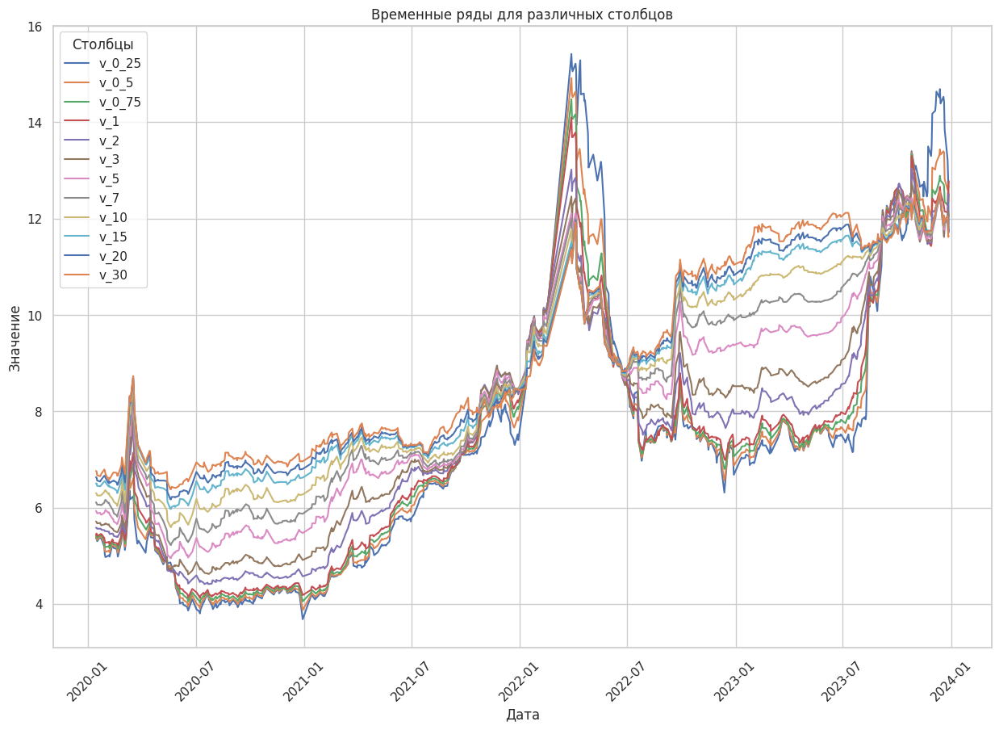

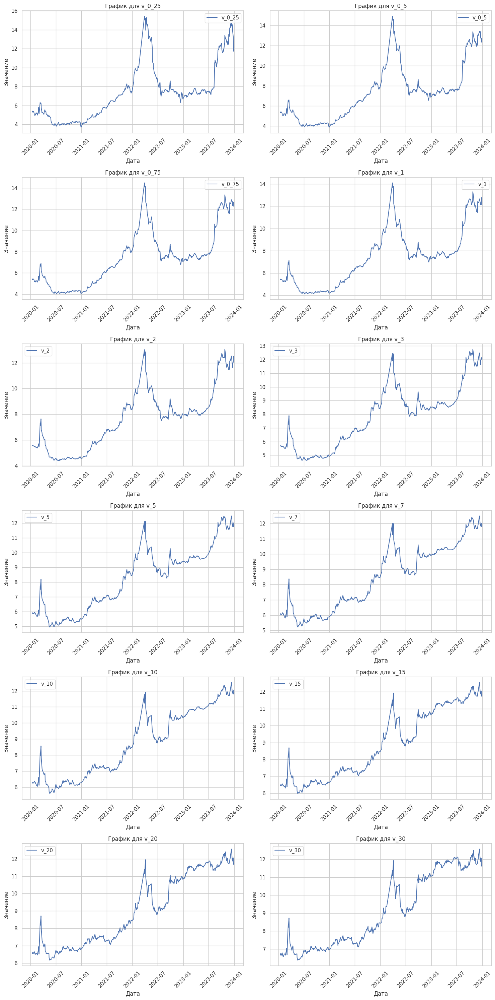

In [23]:
def plot_columns(df, columns_to_plot, single_plot=True):
    """
    Функция для построения графиков временных рядов для указанных столбцов DataFrame.

    :param df: DataFrame, содержащий данные для визуализации
    :param columns_to_plot: Список столбцов для построения графиков
    :param single_plot: Если True, все графики будут расположены на одном полотне. Если False, графики будут разбиты на сетку.
    """
    sns.set(style="whitegrid")

    if single_plot:
        # Построим графики всех столбцов на одной фигуре
        plt.figure(figsize=(15, 10))

        for column in columns_to_plot:
            sns.lineplot(x=df['date'], y=df[column], label=column)

        # Настройки графика
        plt.title('Временные ряды для различных столбцов')
        plt.xlabel('Дата')
        plt.ylabel('Значение')
        plt.legend(title='Столбцы')
        plt.xticks(rotation=45)
    else:
        # Определим количество строк и столбцов для сетки графиков
        num_plots = len(columns_to_plot)
        nrows = int(num_plots / 2) + num_plots % 2
        ncols = 2

        plt.figure(figsize=(15, nrows * 5))

        for i, column in enumerate(columns_to_plot):
            plt.subplot(nrows, ncols, i + 1)
            sns.lineplot(x=df['date'], y=df[column], label=column)
            plt.title(f'График для {column}')
            plt.xlabel('Дата')
            plt.ylabel('Значение')
            plt.xticks(rotation=45)

        plt.tight_layout()

    plt.show()

# Пример использования функции
columns_to_plot = ['v_0_25', 'v_0_5', 'v_0_75', 'v_1', 'v_2',
                   'v_3', 'v_5', 'v_7', 'v_10', 'v_15', 'v_20', 'v_30']

plot_columns(df_risk, columns_to_plot, single_plot=True)  # Для одного полотна
plot_columns(df_risk, columns_to_plot, single_plot=False) 

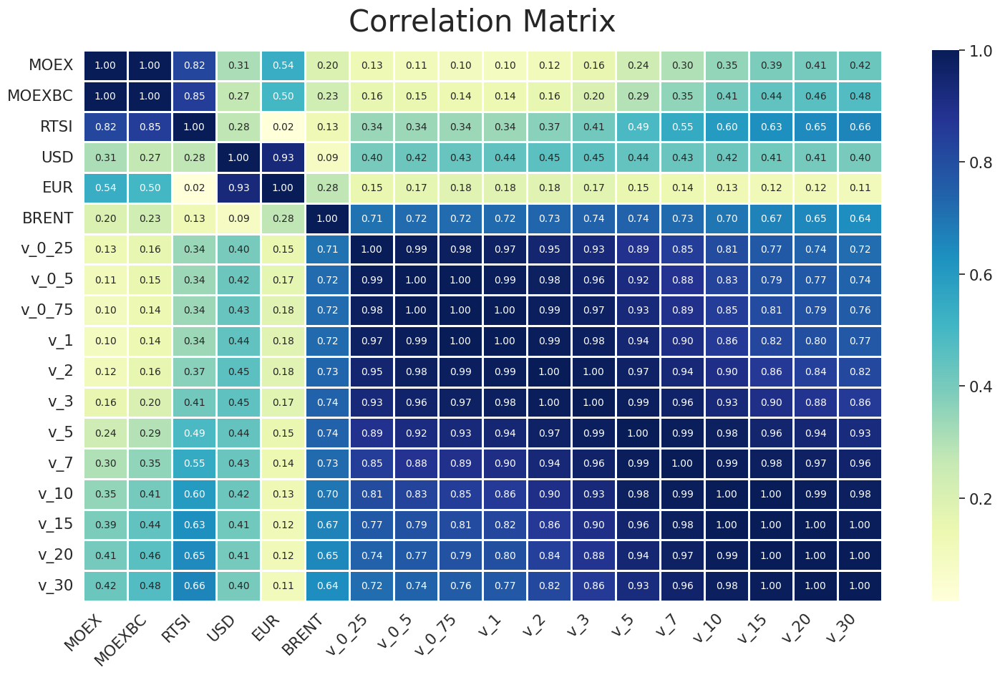

In [24]:
num_cols = df_risk.select_dtypes(include=['float64']).columns

plt.figure(figsize=(18, 10))
with plt.style.context({'xtick.labelsize':15,
                        'ytick.labelsize':15}):
    sns.set(font_scale=1.4)
    dataplot = sns.heatmap(df_risk[num_cols].corr().abs(), 
                           cmap="YlGnBu", 
                           annot=True, 
                           fmt=".2f", 
                           annot_kws={"size": 10}, 
                           linecolor='white', 
                           linewidths=1)

plt.title('Correlation Matrix', fontsize=30, pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.show()

In [25]:
def describe(data, p_level="10%"):
    """Проверка на тренд"""
    print(data.name)

    s_h0 = "{}: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value {:0.3f})"
    s_ha = "{}: H0 отвергается, ряд стационарен (p-value {:0.3f})"
    print("Расширенный тест Дики — Фуллера (ADF):")

    test_name = "Тест с константой"
    adf_c = adfuller(data, regression="c")
    if adf_c[0] > adf_c[4][p_level]:
        print(s_h0.format(test_name, adf_c[1]))
    else:
        print(s_ha.format(test_name, adf_c[1]))

    test_name = "Тест с константой и линейным трендом"
    adf_ct = adfuller(data, regression="ct")
    if adf_ct[0] > adf_ct[4][p_level]:
        print(s_h0.format(test_name, adf_ct[1]))
    else:
        print(s_ha.format(test_name, adf_ct[1]))

    test_name = "Тест с константой, линейным и квадратичным трендом"
    adf_ctt = adfuller(data, regression="ctt")
    if adf_ctt[0] > adf_ctt[4][p_level]:
        print(s_h0.format(test_name, adf_ctt[1]))
    else:
        print(s_ha.format(test_name, adf_ctt[1]))

    test_name = "Тест без константы и тренда"
    adf_nc = adfuller(data, regression="n")
    if adf_nc[0] > adf_nc[4][p_level]:
        print(s_h0.format(test_name, adf_nc[1]))
    else:
        print(s_ha.format(test_name, adf_nc[1]))

    test_name = "Тест с константой для процентных изменений"
    adf_pct_nc = adfuller(data.pct_change()[1:], regression="c")
    if adf_pct_nc[0] > adf_pct_nc[4][p_level]:
        print(s_h0.format(test_name, adf_pct_nc[1]))
    else:
        print(s_ha.format(test_name, adf_pct_nc[1]))

In [26]:
def draw_graphs(data, title=""):
    inc = data.set_index('date').pct_change()[1:].reset_index()

    # Установим стиль для графиков
    plt.style.use('seaborn-darkgrid')

    # Исторические данные и процентные изменения
    fig, axs = plt.subplots(2, 1, figsize=(14, 8))
    plt.subplots_adjust(hspace=0.4)
    axs[0].plot(data['date'], data.iloc[:, 1], color='blue', lw=2)
    axs[0].set_title(f"Historical Data for {title}", fontsize=14)
    axs[0].set_xlabel('Дата', fontsize=12)
    axs[0].set_ylabel('Value', fontsize=12)
    axs[0].grid(True, linestyle='--', linewidth=0.5)
    axs[0].tick_params(axis='x', rotation=45)
    
    axs[1].plot(inc['date'], inc.iloc[:, 1], color='green', lw=2)
    axs[1].set_title(f"Percentage Changes for {title}", fontsize=14)
    axs[1].set_xlabel('Дата', fontsize=12)
    axs[1].set_ylabel('Percentage Change', fontsize=12)
    axs[1].grid(True, linestyle='--', linewidth=0.5)
    axs[1].tick_params(axis='x', rotation=45)

    # ACF, PACF, Histogram, Q-Q plot и P-P plot
    fig, axs = plt.subplots(3, 2, figsize=(14, 12))
    plt.subplots_adjust(hspace=0.4, wspace=0.3)
    
    # ACF и PACF
    spl.plot_acf(data.set_index('date').iloc[:, 0], lags=30, ax=axs[0, 0], color='blue')
    spl.plot_pacf(data.set_index('date').iloc[:, 0], lags=30, ax=axs[0, 1], color='blue')
    axs[0, 0].set_title('ACF', fontsize=14)
    axs[0, 1].set_title('PACF', fontsize=14)
    
    # Histogram
    axs[1, 0].hist(data.iloc[:, 1], bins=60, color='orange', alpha=0.7)
    axs[1, 0].set_title("Histogram (history)", fontsize=14)
    axs[1, 0].set_xlabel('Value', fontsize=12)
    axs[1, 0].set_ylabel('Frequency', fontsize=12)

    axs[1, 1].hist(inc.dropna().iloc[:, 1], bins=60, color='orange', alpha=0.7)
    axs[1, 1].set_title("Histogram (changes)", fontsize=14)
    axs[1, 1].set_xlabel('Percentage Change', fontsize=12)
    axs[1, 1].set_ylabel('Frequency', fontsize=12)

    # Q-Q plot and P-P plot
    distribution = ProbPlot(inc.dropna().iloc[:, 1], fit=True)
    distribution.qqplot(line="r", ax=axs[2, 0])
    axs[2, 0].set_title("Q-Q Plot", fontsize=14)
    
    distribution.ppplot(line="45", ax=axs[2, 1])
    axs[2, 1].set_title("P-P Plot", fontsize=14)

    for ax in axs.flat:
        ax.grid(True, linestyle='--', linewidth=0.5)
        ax.set_facecolor("#f2f2f2")

    plt.show()

In [27]:
def plot_decomposition(data, name, period=1):
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14, 10), sharex=True)
    fig.subplots_adjust(hspace=0.35)
    fig.suptitle(f"Разложение {name} на тренд/сезонность/ошибку (период {period})", fontsize=16)

    # Выполняем декомпозицию временного ряда
    data = data.set_index('date')
    result = seasonal_decompose(data[name], model="additive", period=period)
    
    # Строим графики и настраиваем их внешний вид
    ax1.plot(result.trend.index, result.trend, color='blue', linestyle='--', lw=2)
    ax2.plot(result.seasonal.index, result.seasonal, color='green', linestyle='-', lw=2)
    ax3.plot(result.resid.index, result.resid, color='red', linestyle='-', lw=2)
    
    # Устанавливаем метки осей и заголовки
    ax1.set_ylabel("Тренд", fontsize=14)
    ax1.set_xlabel("", fontsize=14)
    ax1.set_title("Trend", fontsize=12)

    ax2.set_ylabel("Сезонность", fontsize=14)
    ax2.set_xlabel("", fontsize=14)
    ax2.set_title("Seasonality", fontsize=12)

    ax3.set_ylabel("Ошибка", fontsize=14)
    ax3.set_xlabel("Дата", fontsize=14)
    ax3.set_title("Residuals", fontsize=12)

    # Включаем сетку и улучшенные стили
    for ax in [ax1, ax2, ax3]:
        ax.grid(True, linestyle='--', linewidth=0.5)
        ax.set_facecolor("#f2f2f2")
        ax.tick_params(axis='x', rotation=45)

    plt.show()

In [28]:
def get_description(df, ticker):
    data = df[['date', ticker]].dropna()
    draw_graphs(data, title=ticker)
    describe(df[ticker])
    plot_decomposition(data, ticker, 365 // 4)
    plot_decomposition(data, ticker, 365 // 2)

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


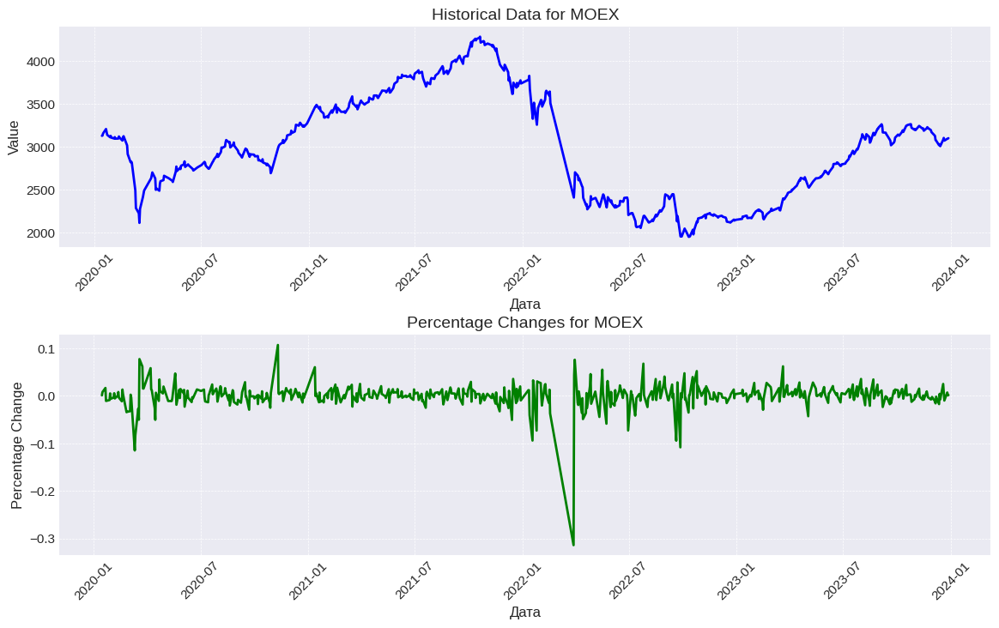

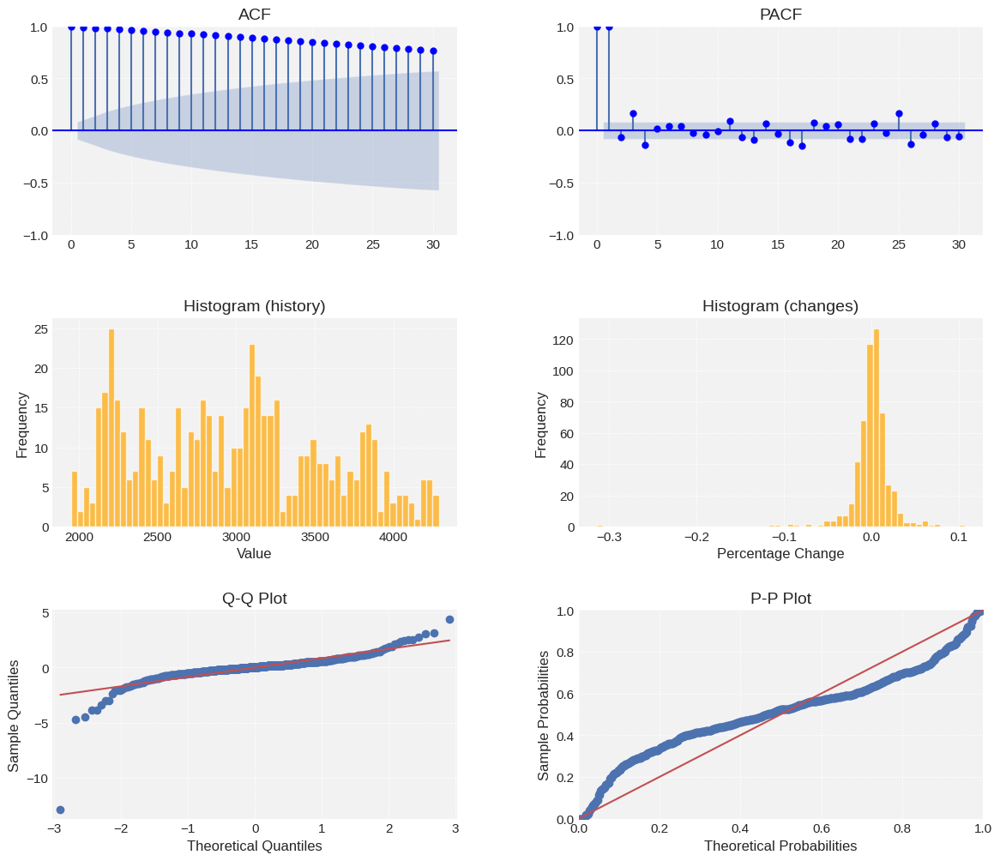

MOEX
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.551)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.853)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.963)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.557)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


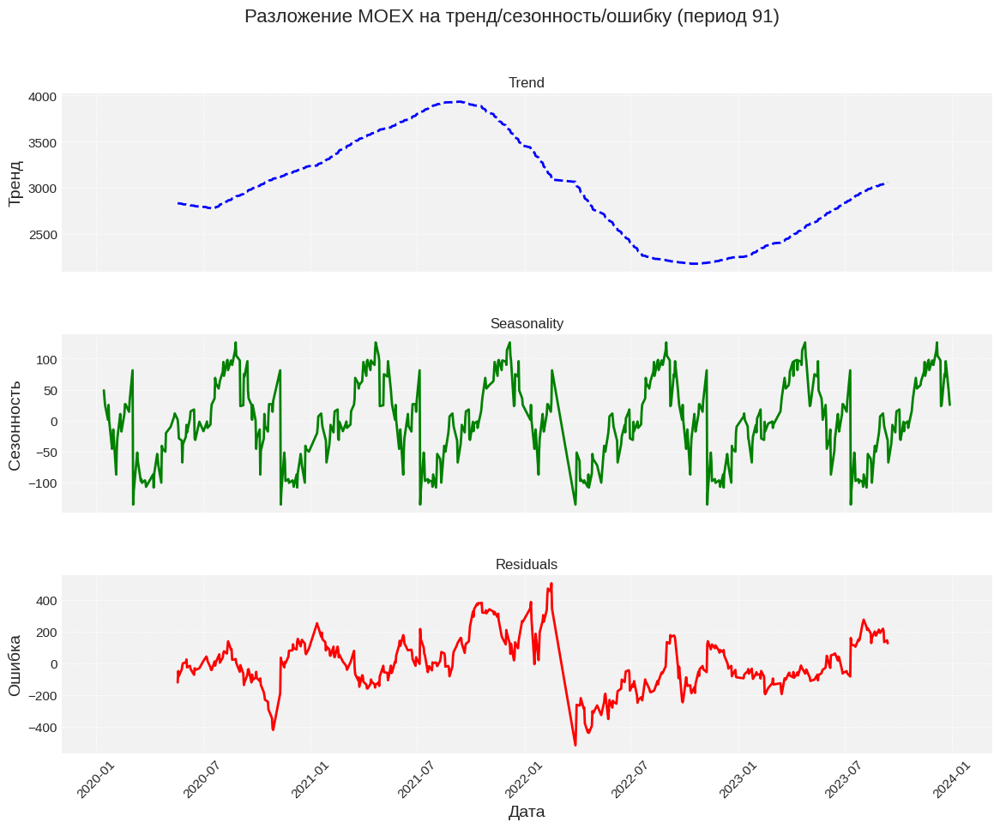

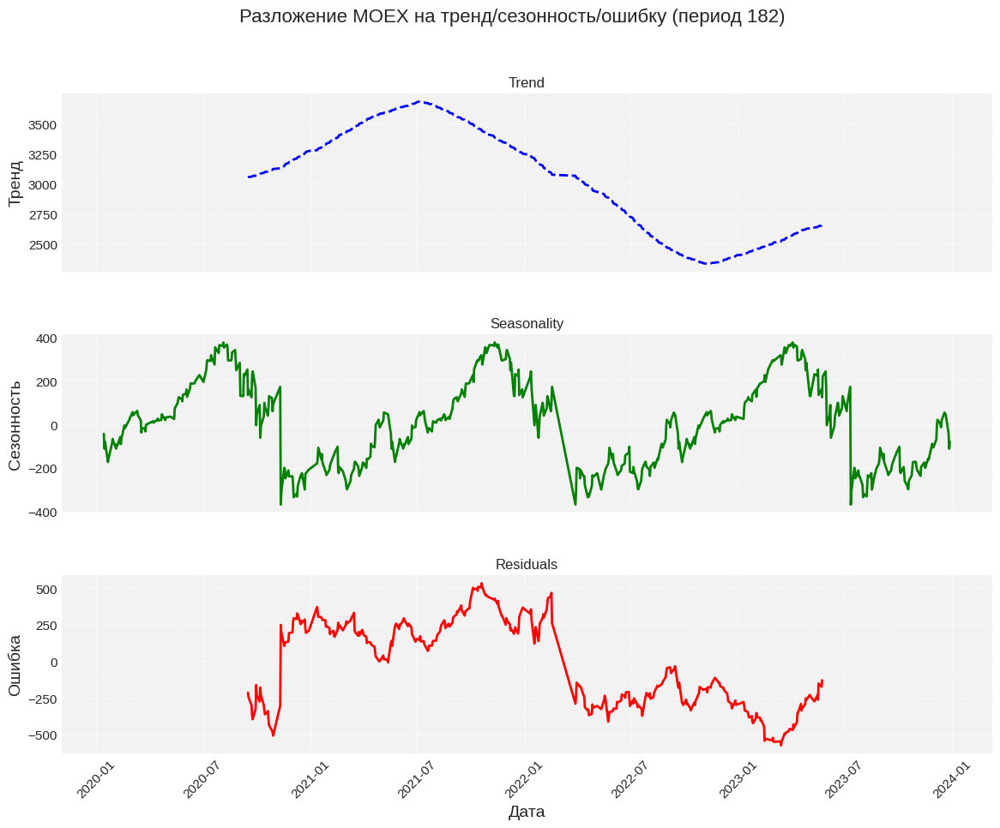

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


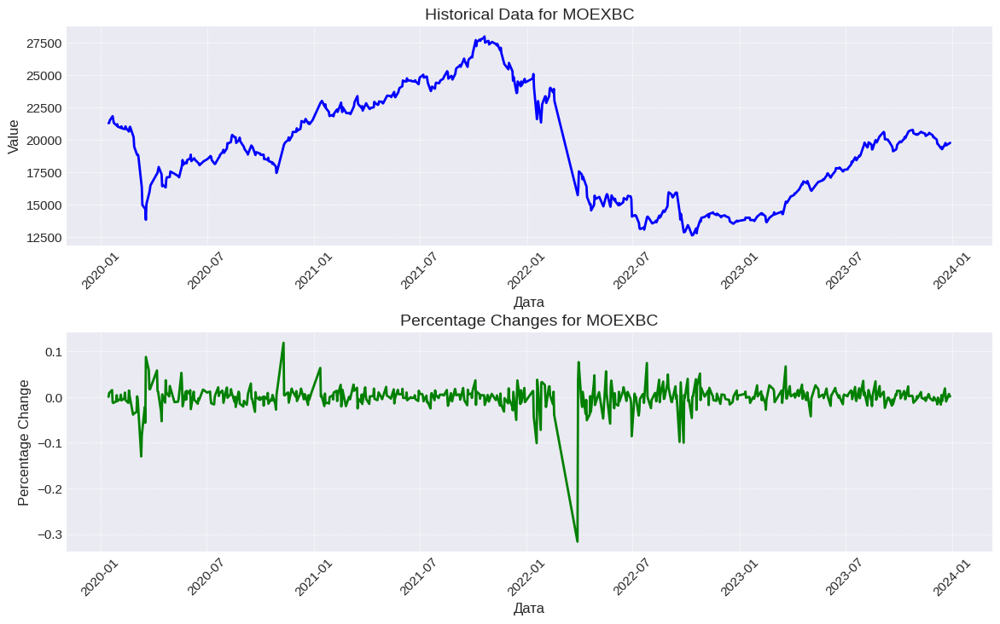

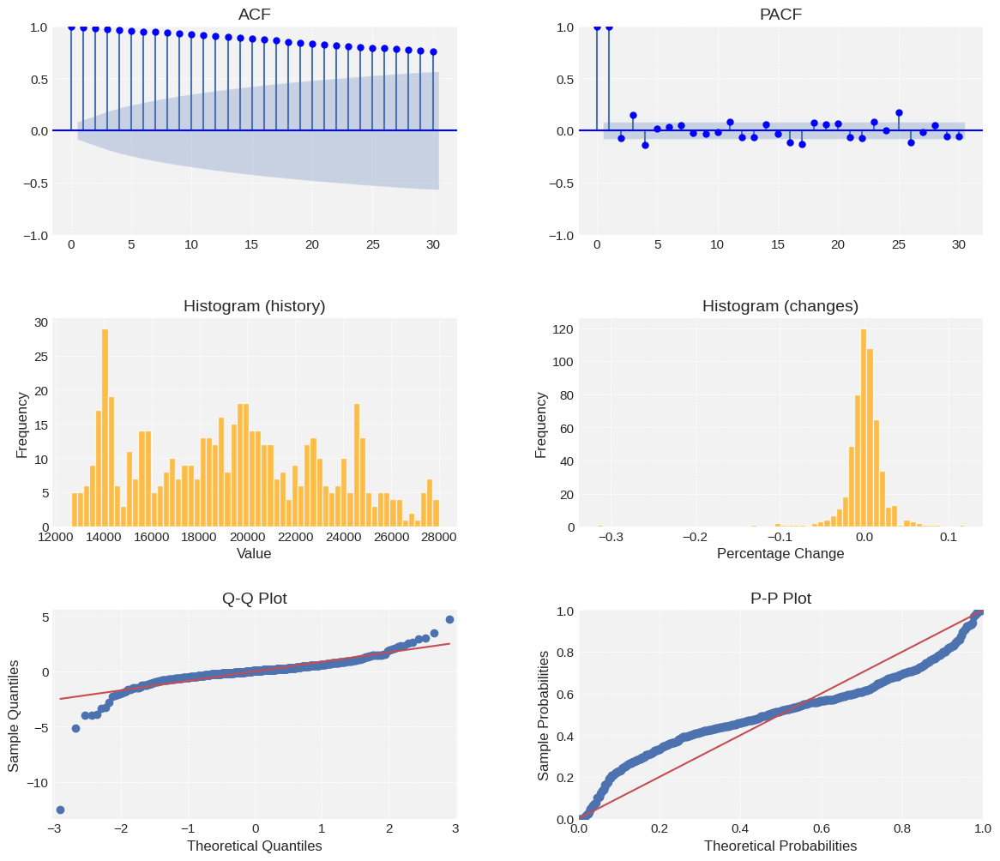

MOEXBC
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.495)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.822)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.949)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.504)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


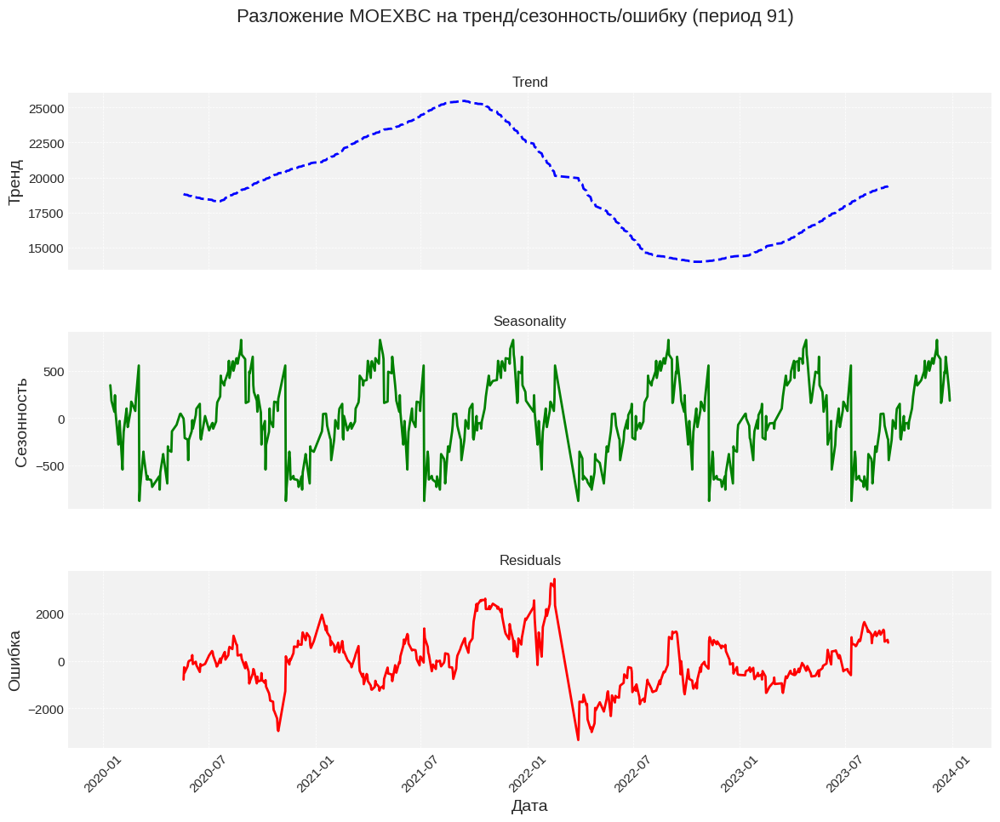

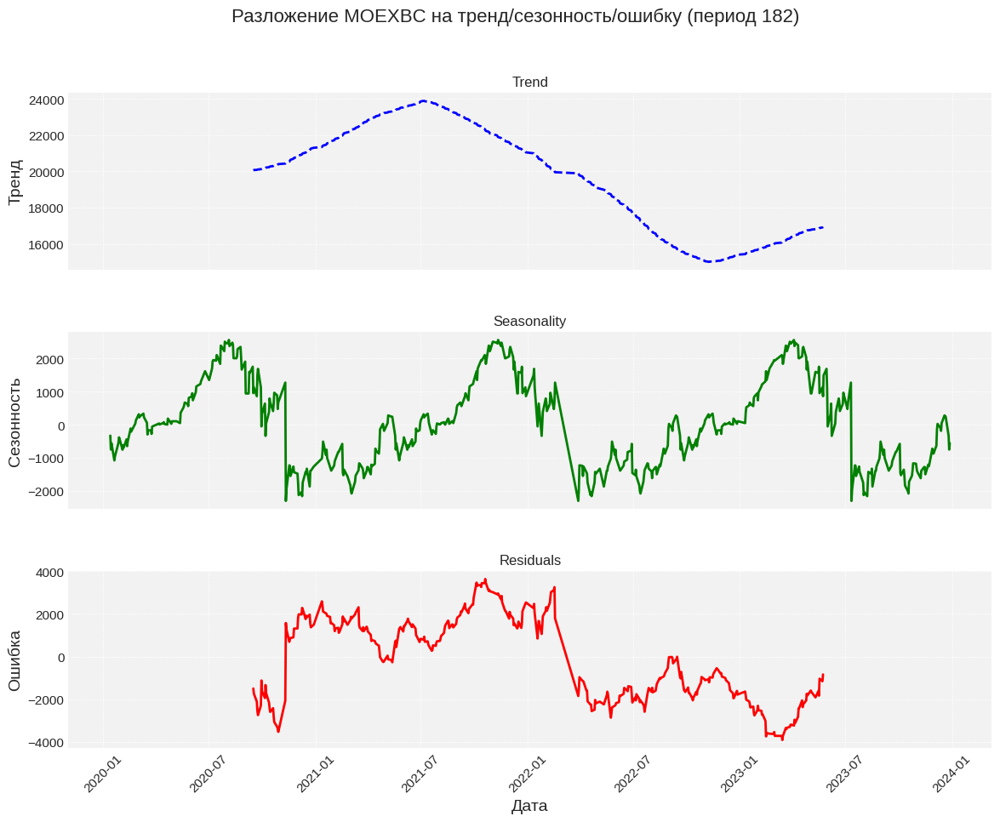

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


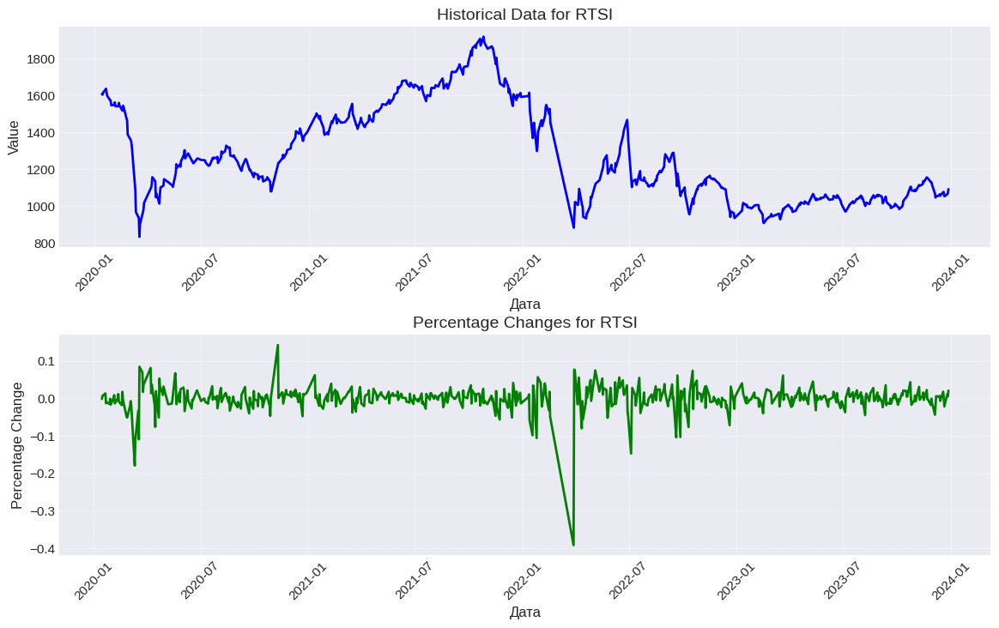

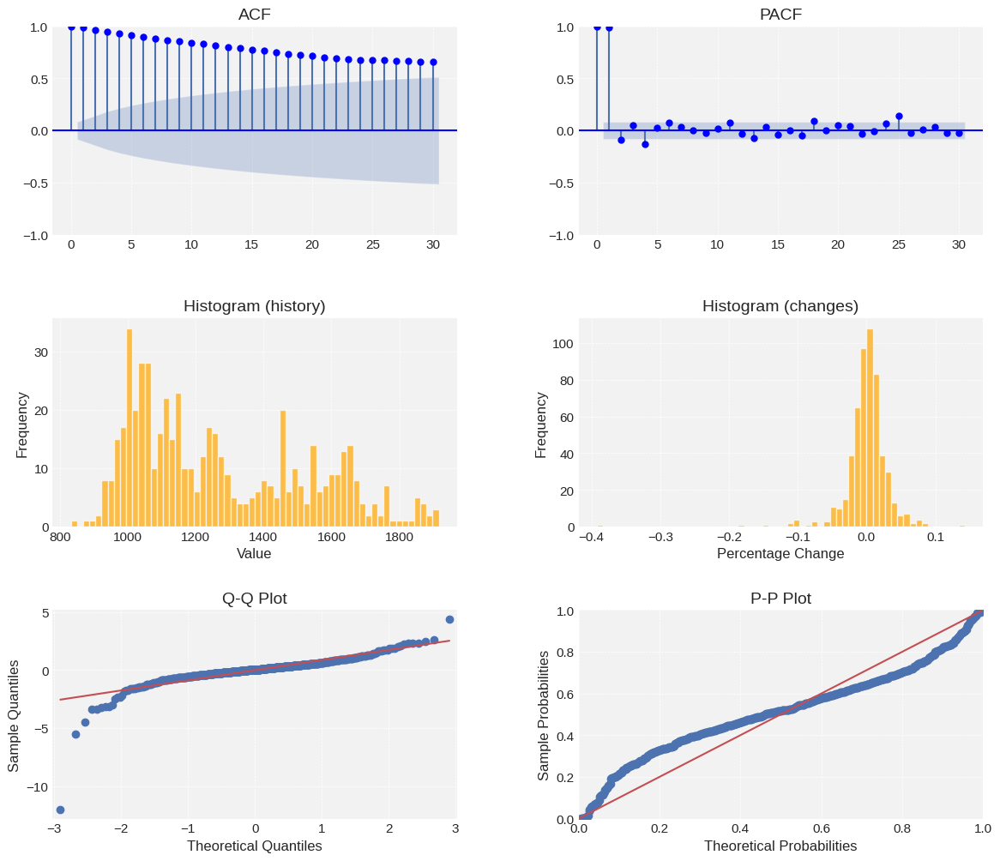

RTSI
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.148)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.297)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.266)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.313)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


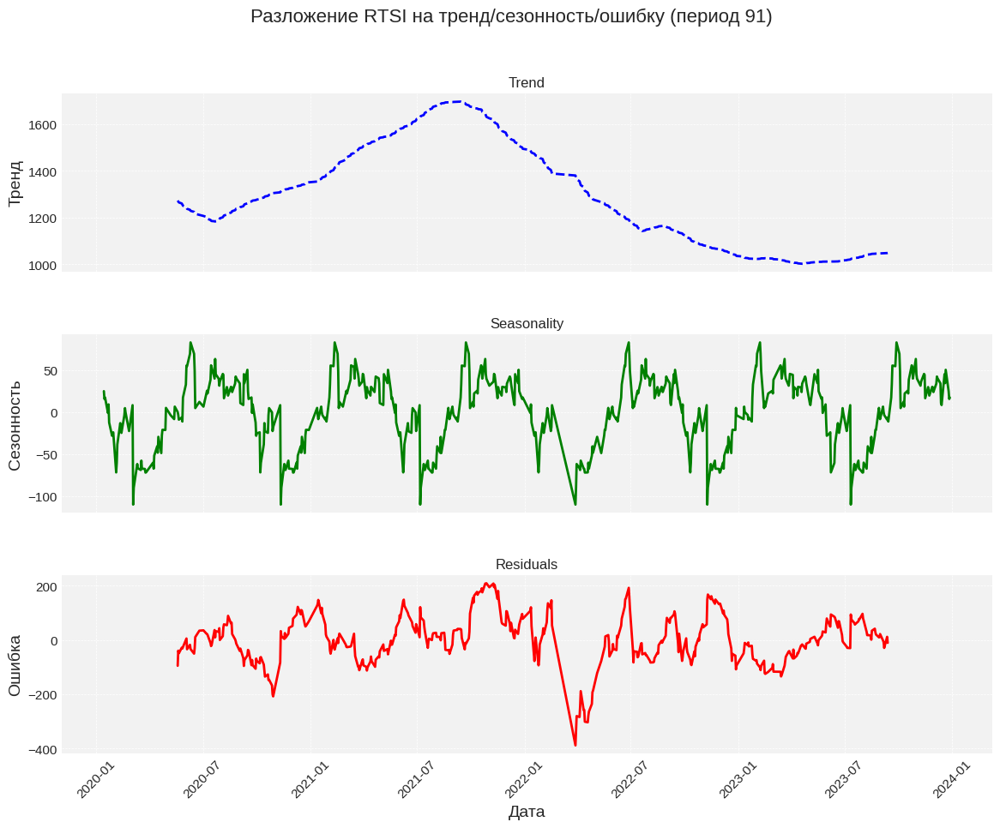

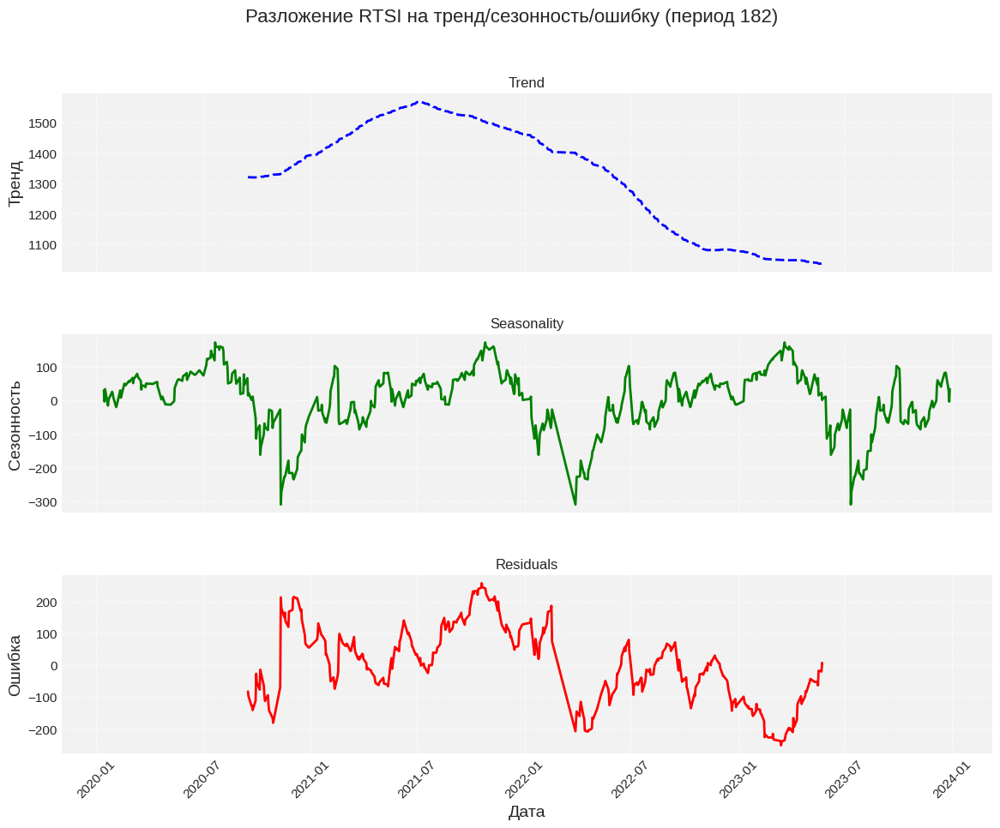

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


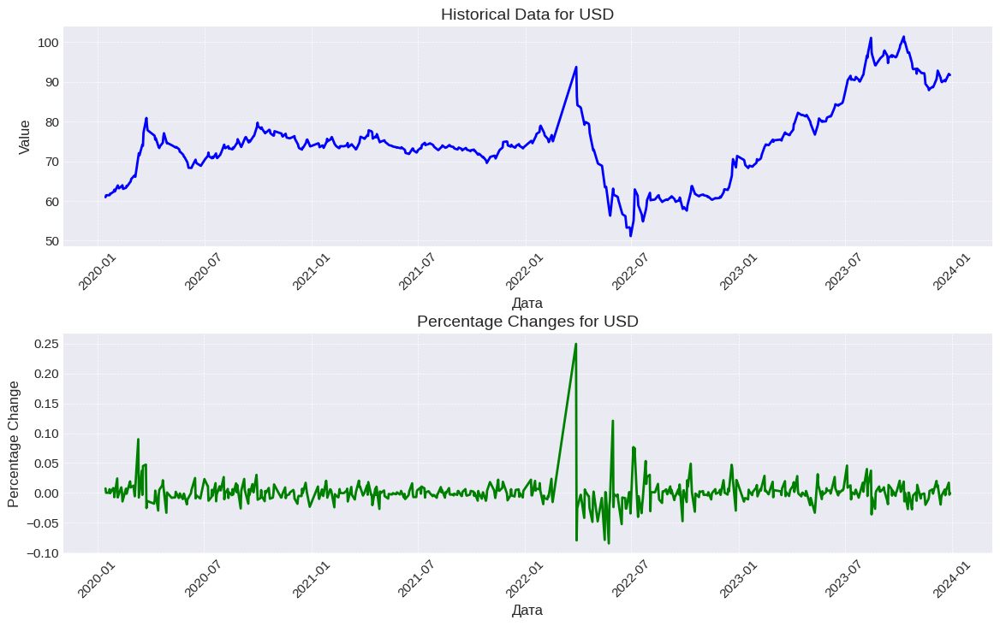

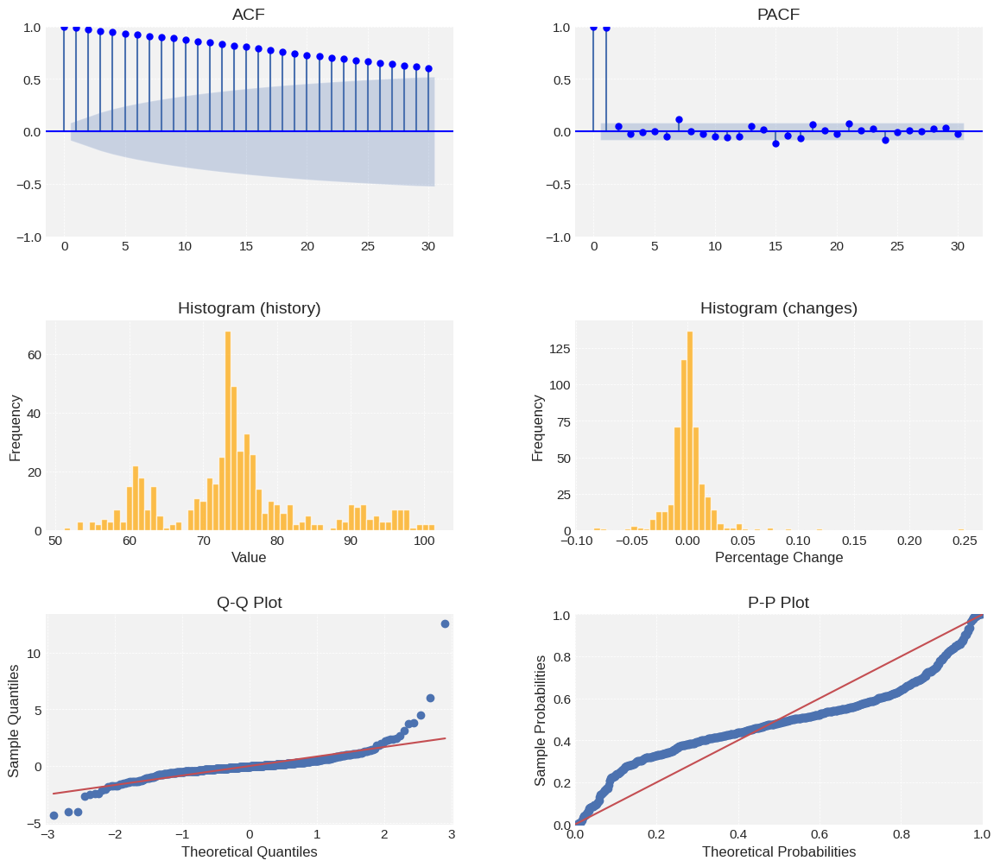

USD
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.428)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.634)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.274)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.826)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


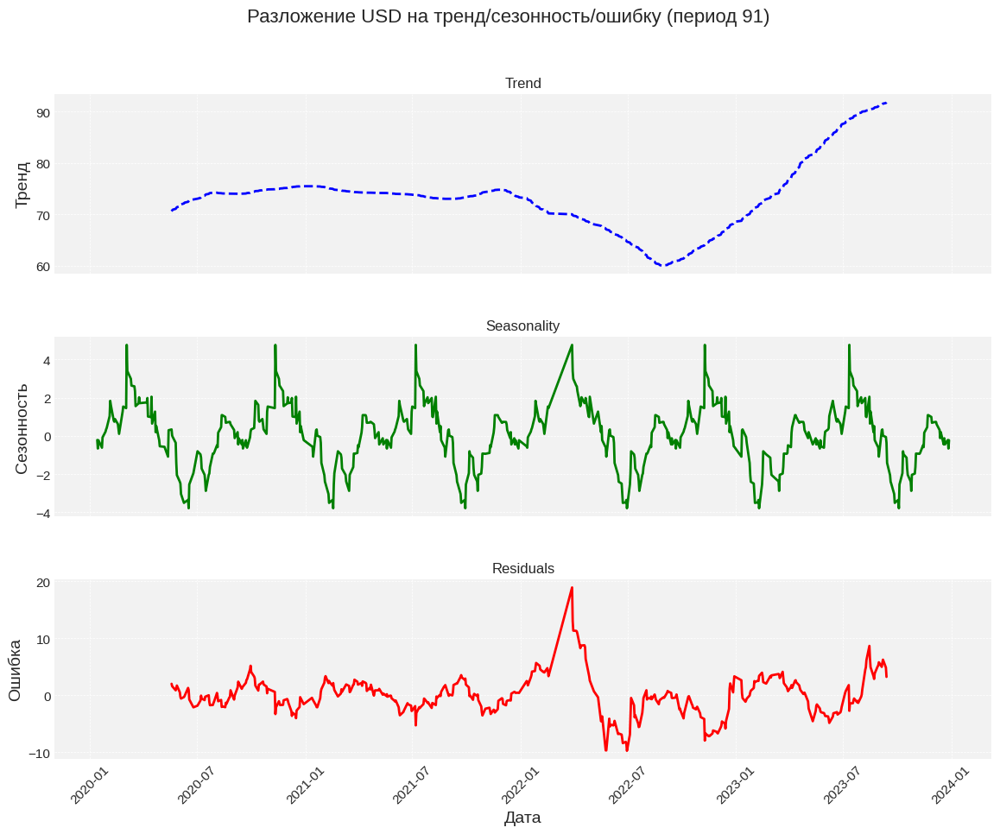

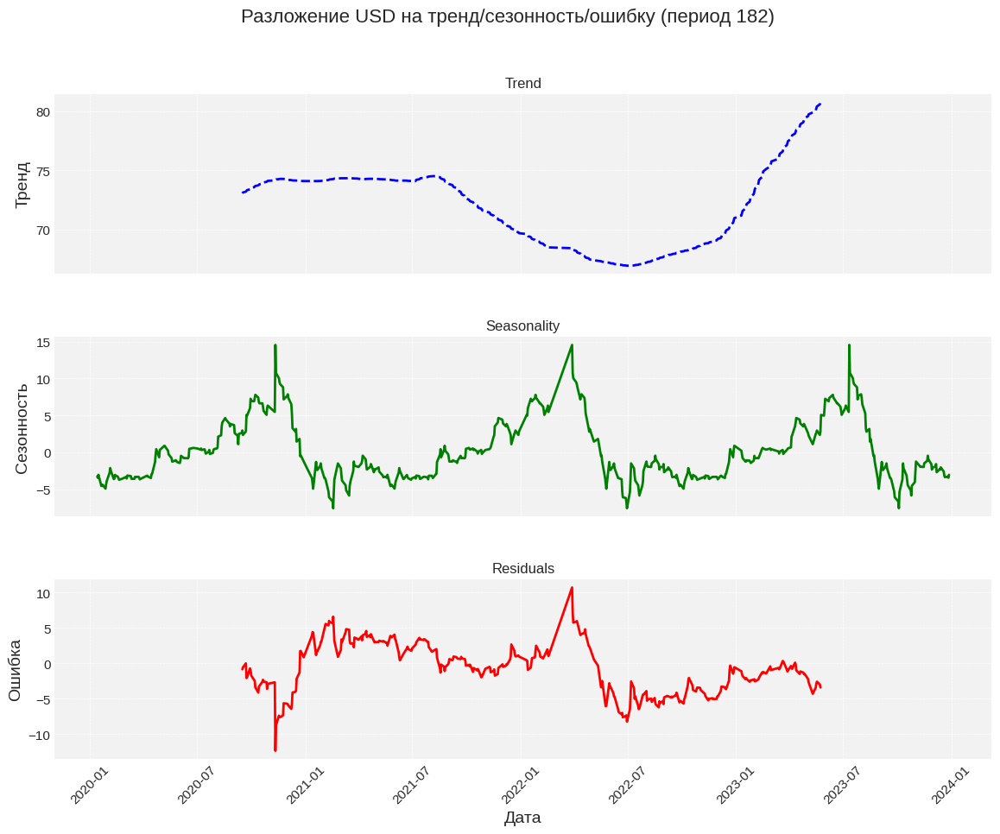

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


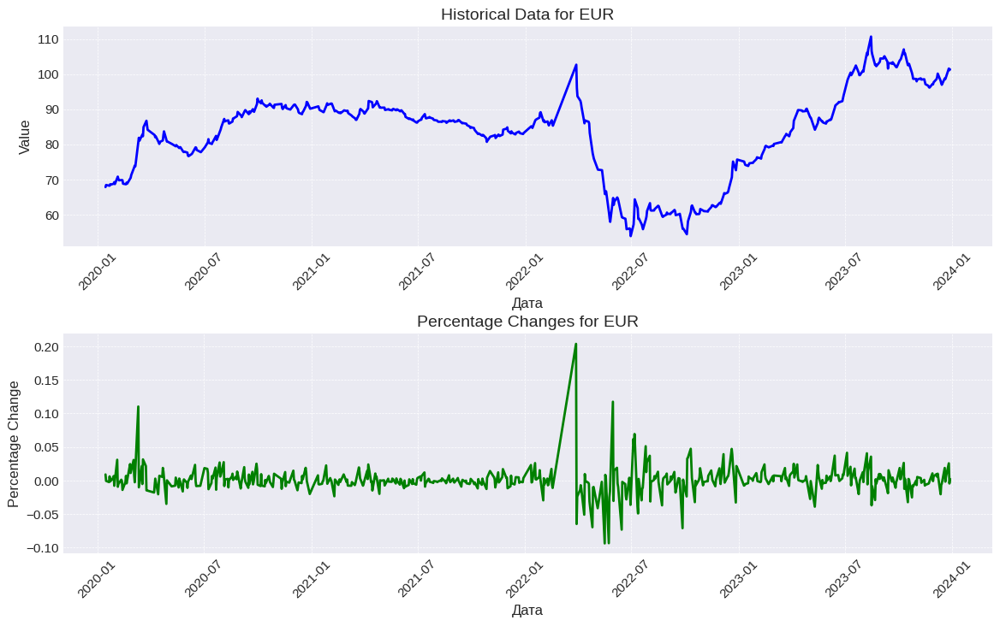

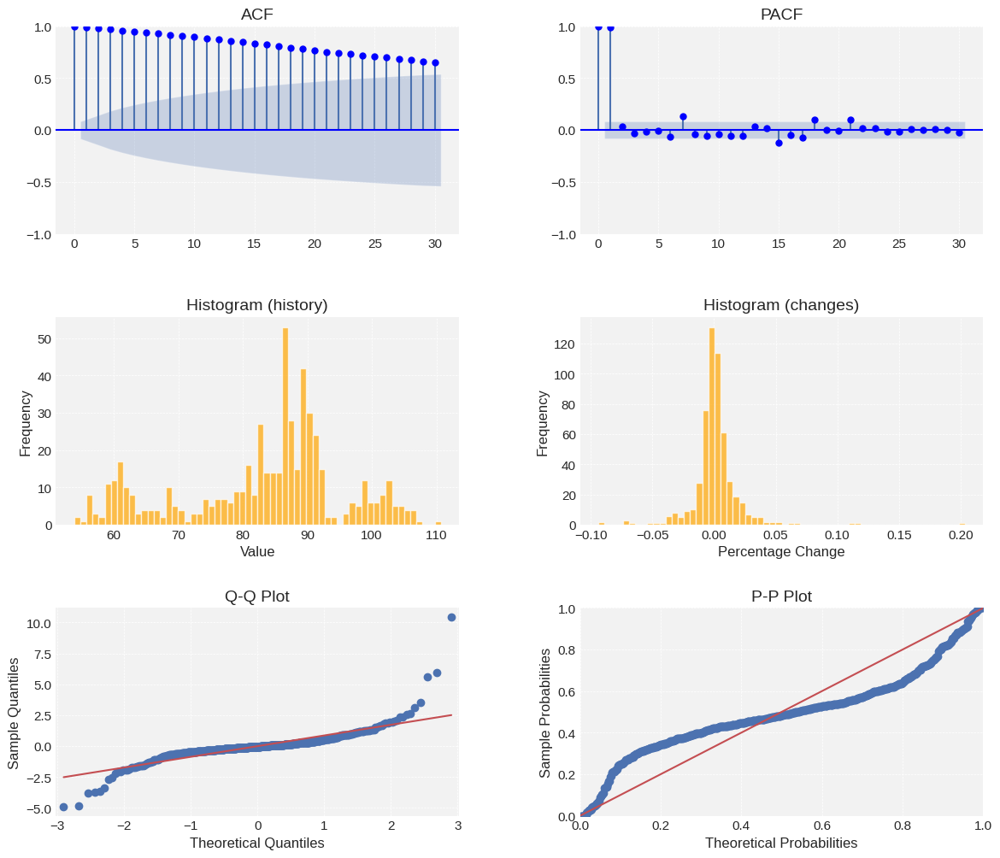

EUR
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.395)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.712)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.477)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.815)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


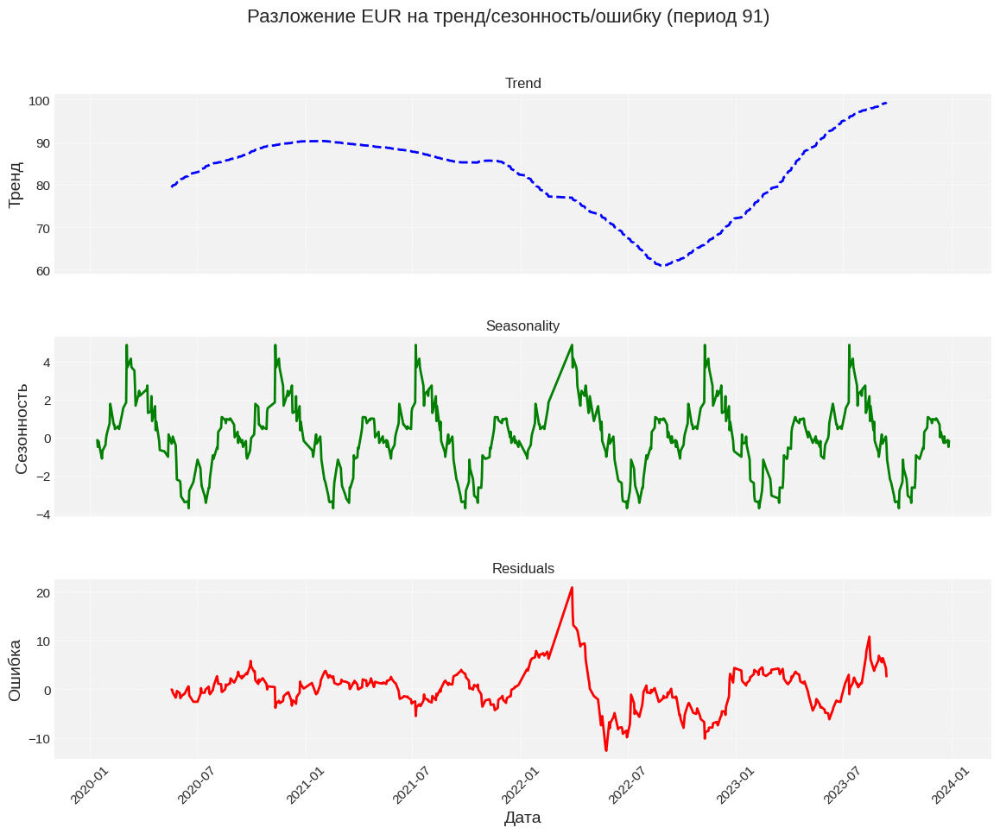

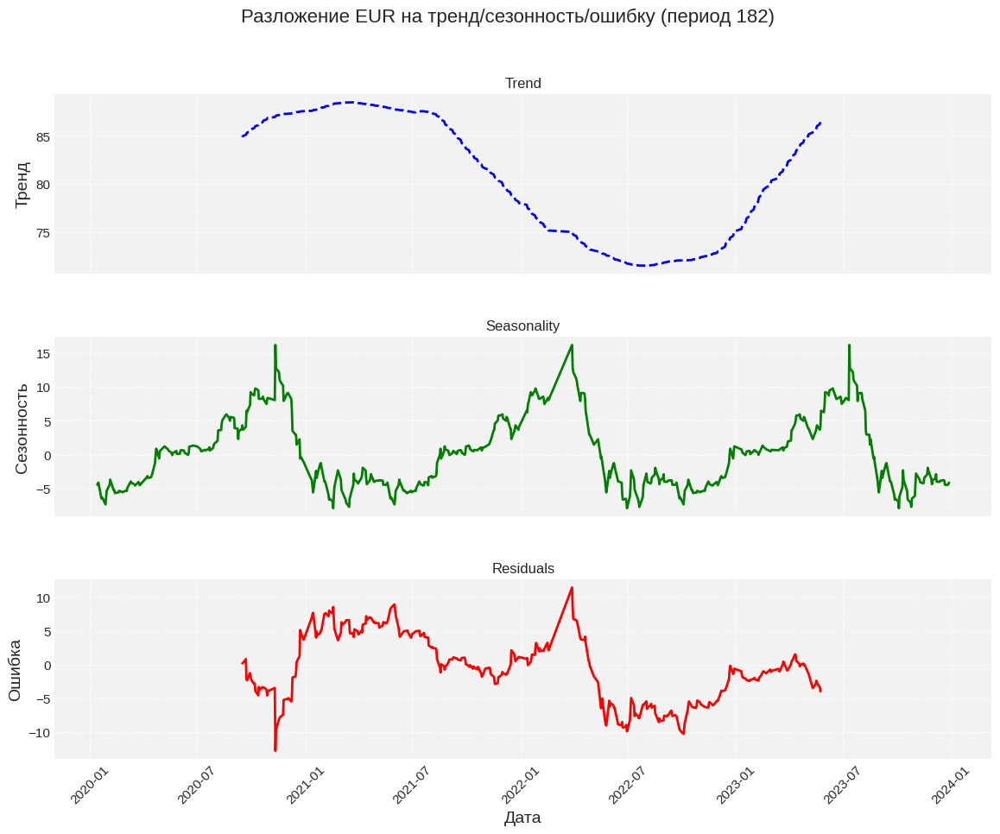

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


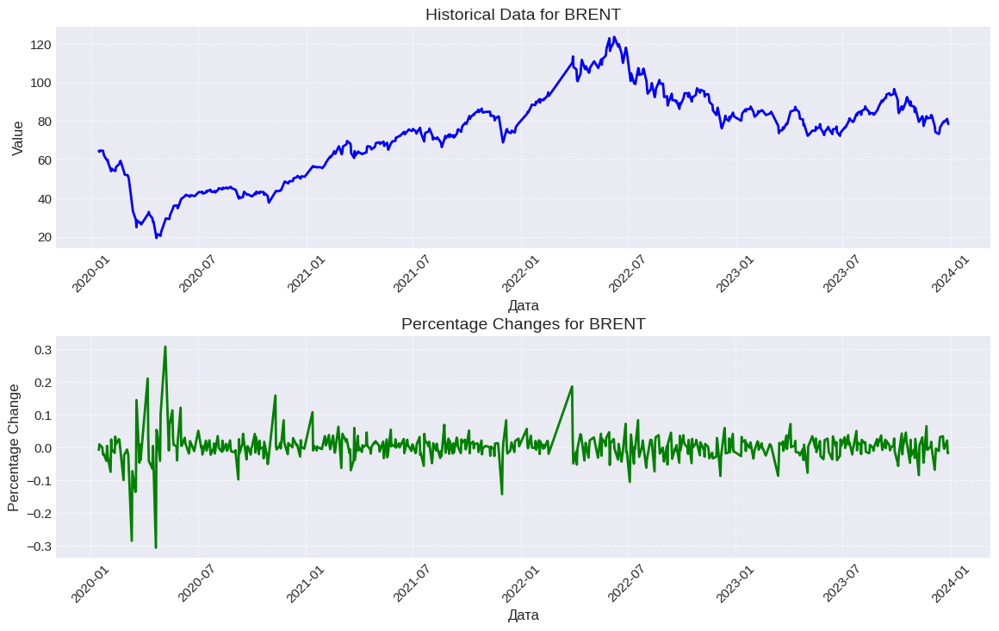

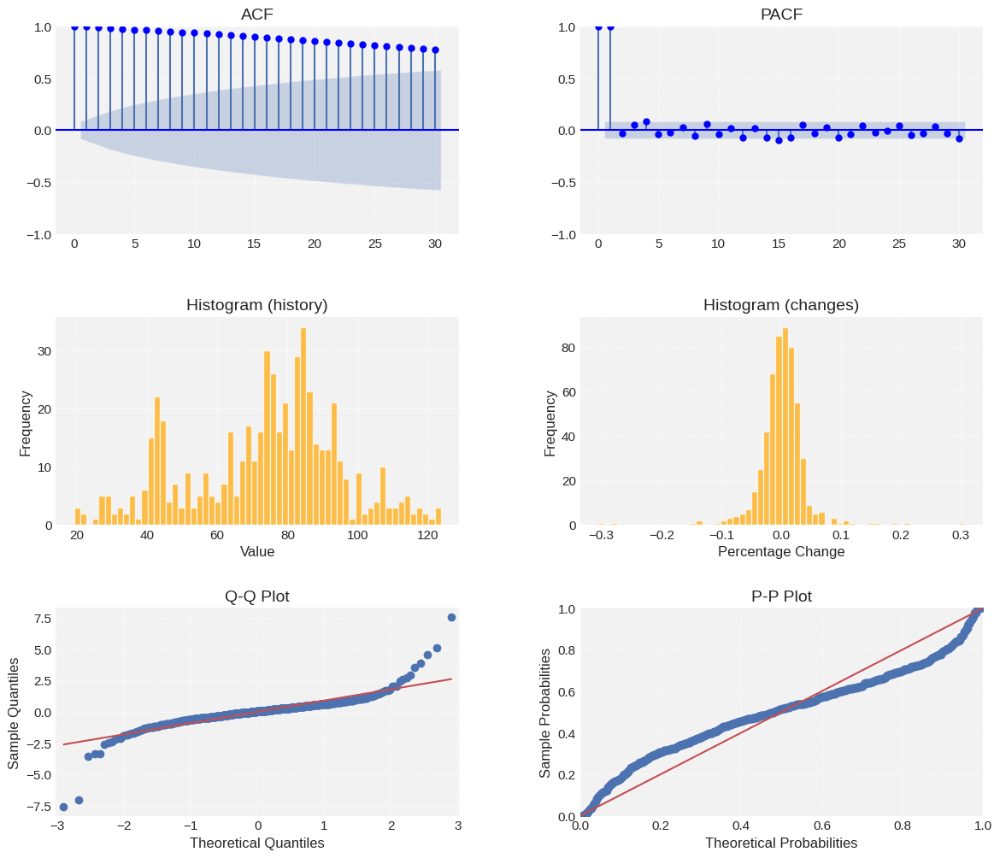

BRENT
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.585)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.666)
Тест с константой, линейным и квадратичным трендом: H0 отвергается, ряд стационарен (p-value 0.061)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.628)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


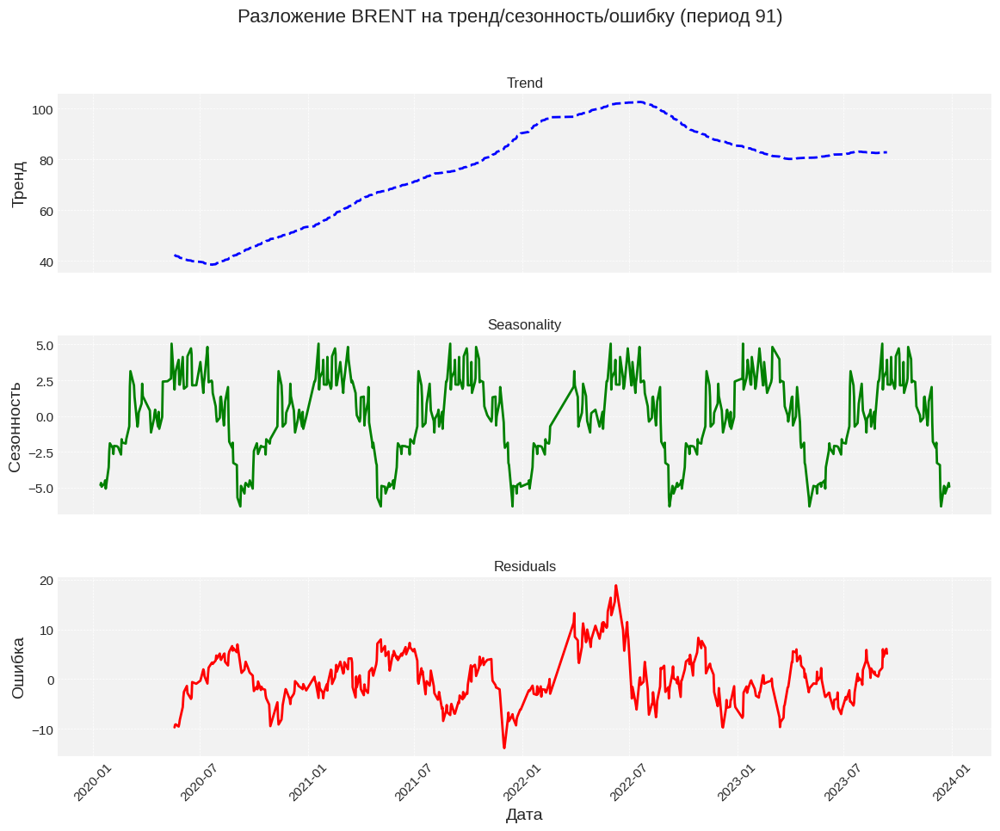

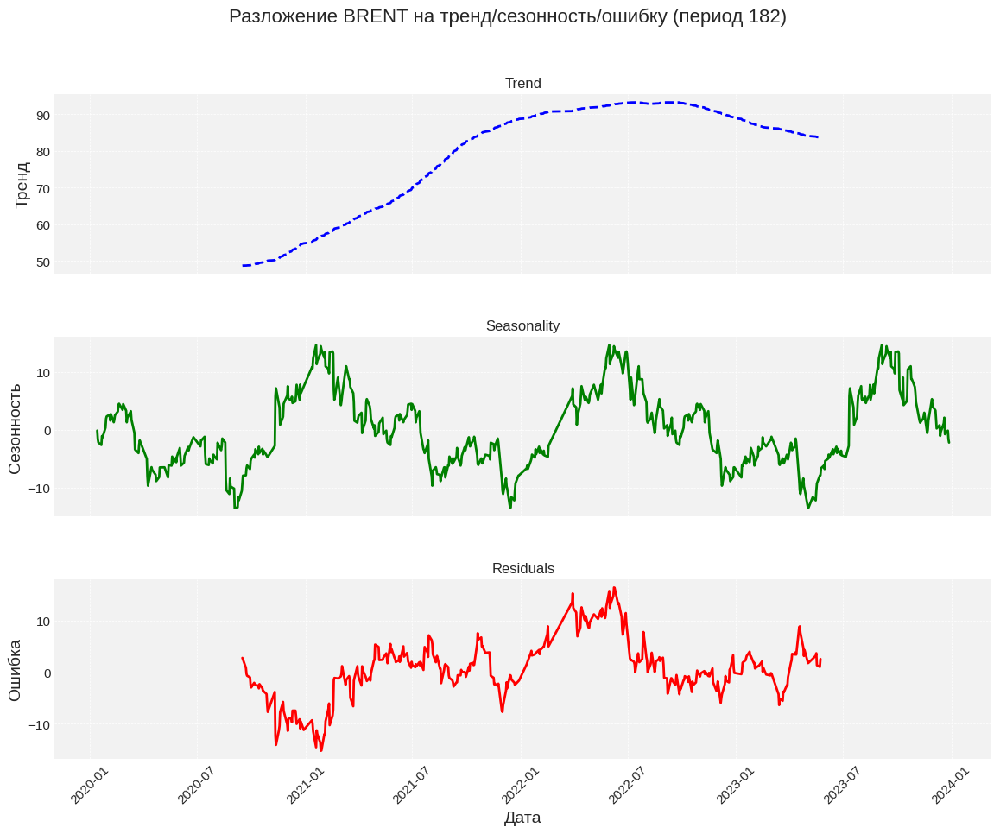

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


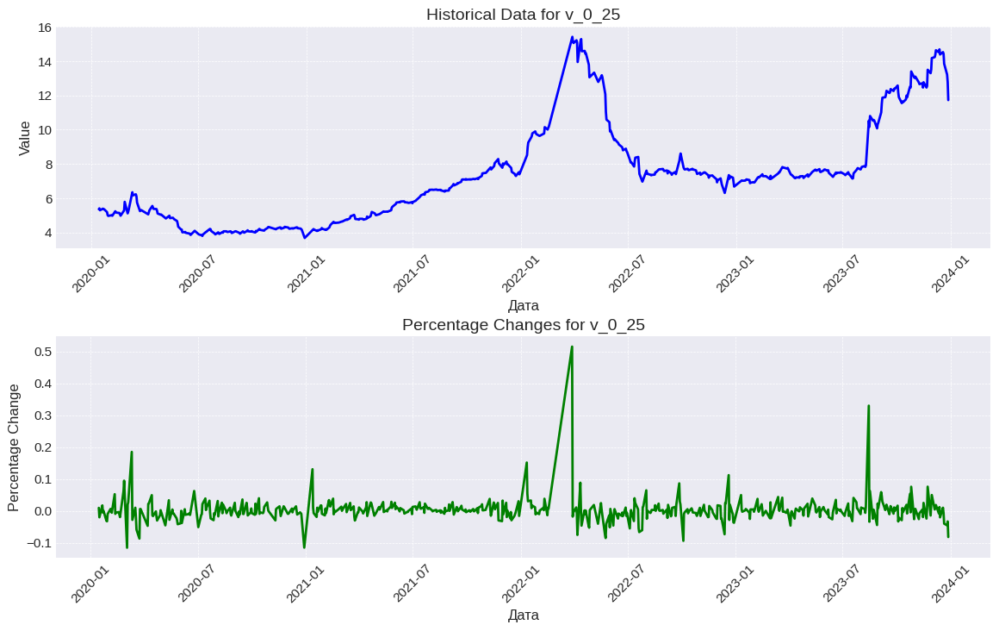

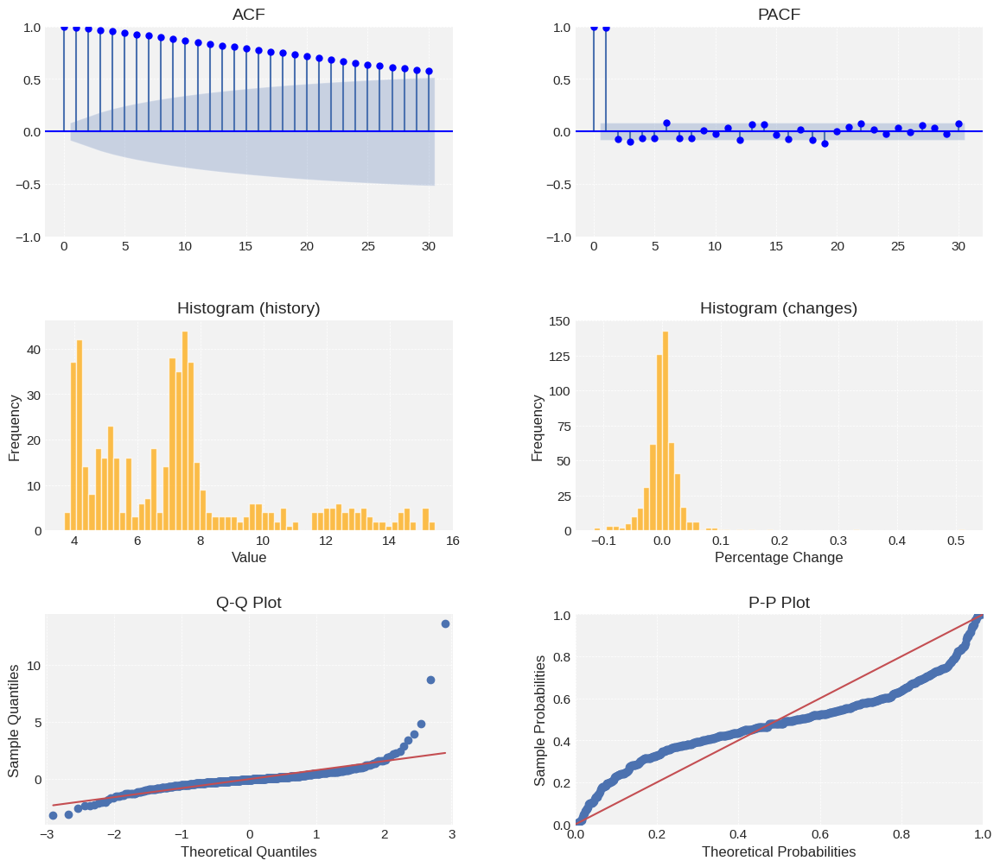

v_0_25
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.738)
Тест с константой и линейным трендом: H0 отвергается, ряд стационарен (p-value 0.063)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.165)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.796)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


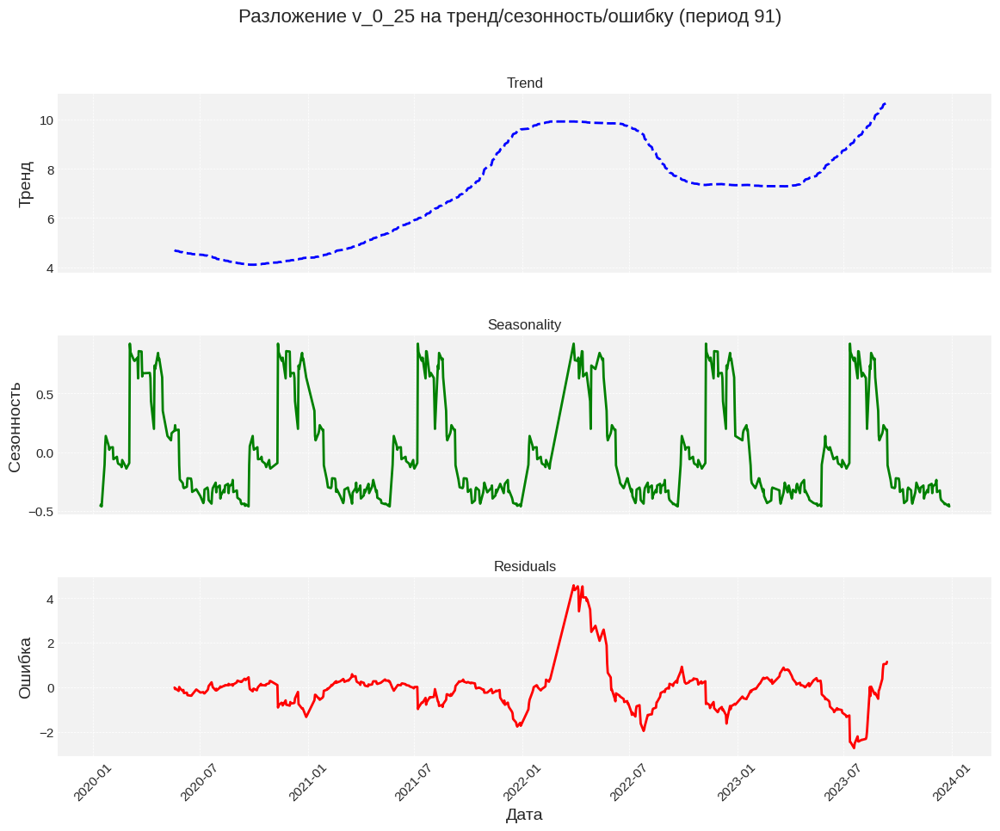

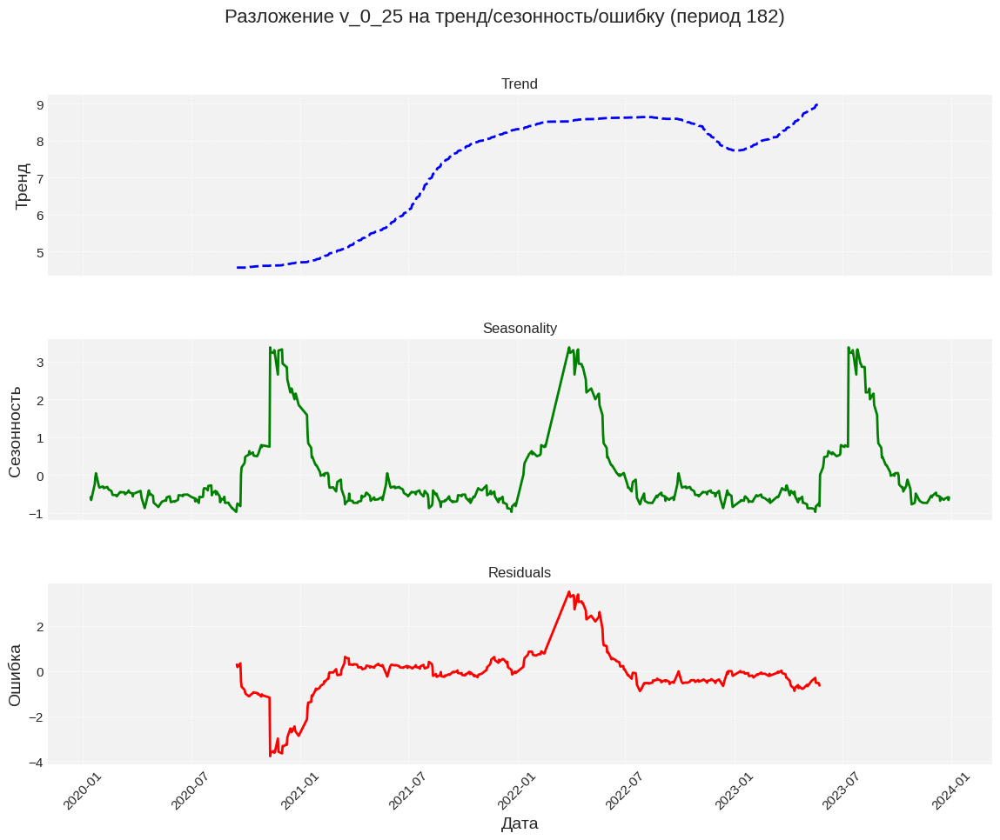

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


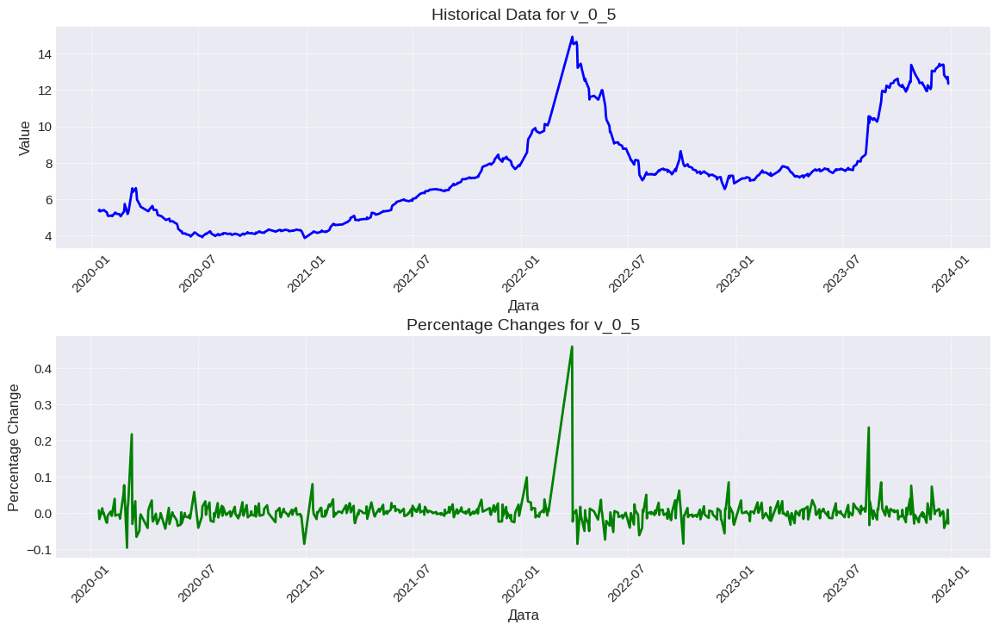

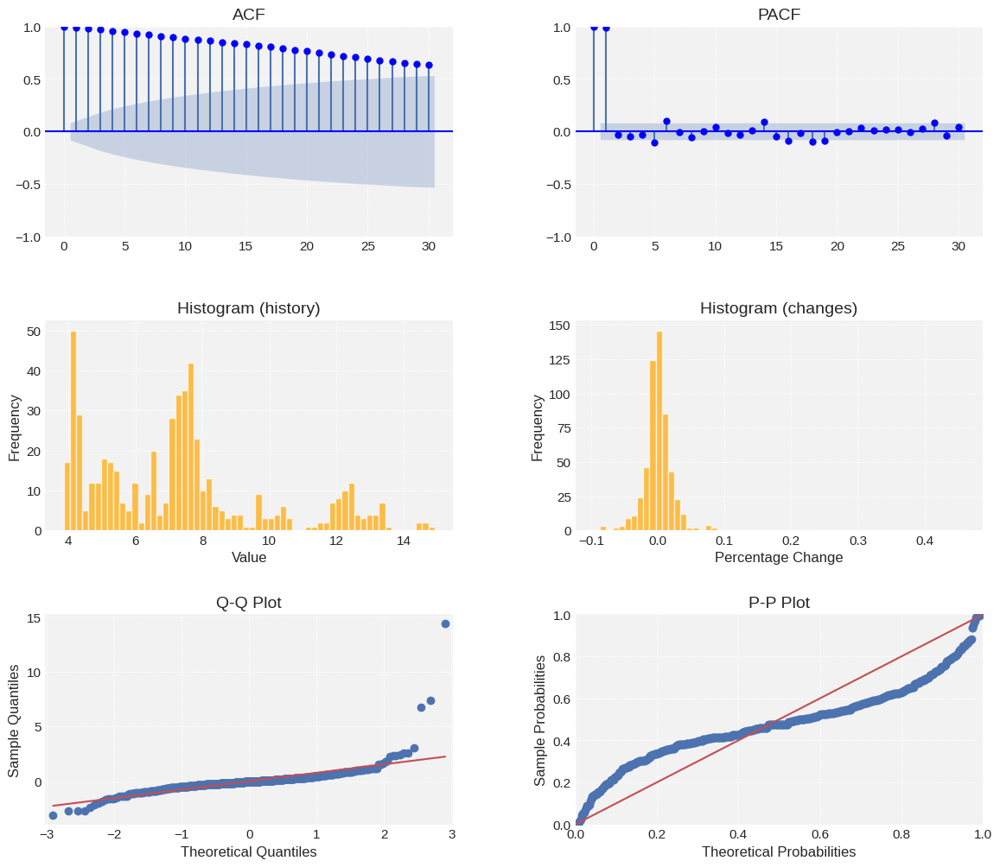

v_0_5
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.859)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.126)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.285)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.877)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


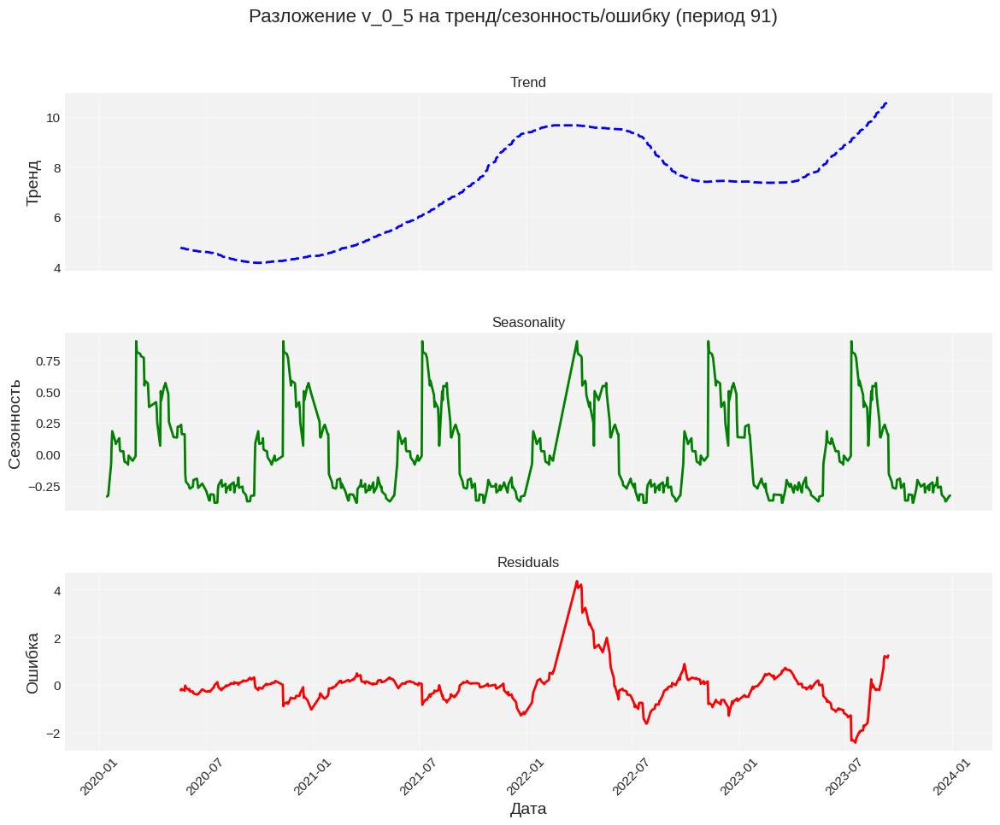

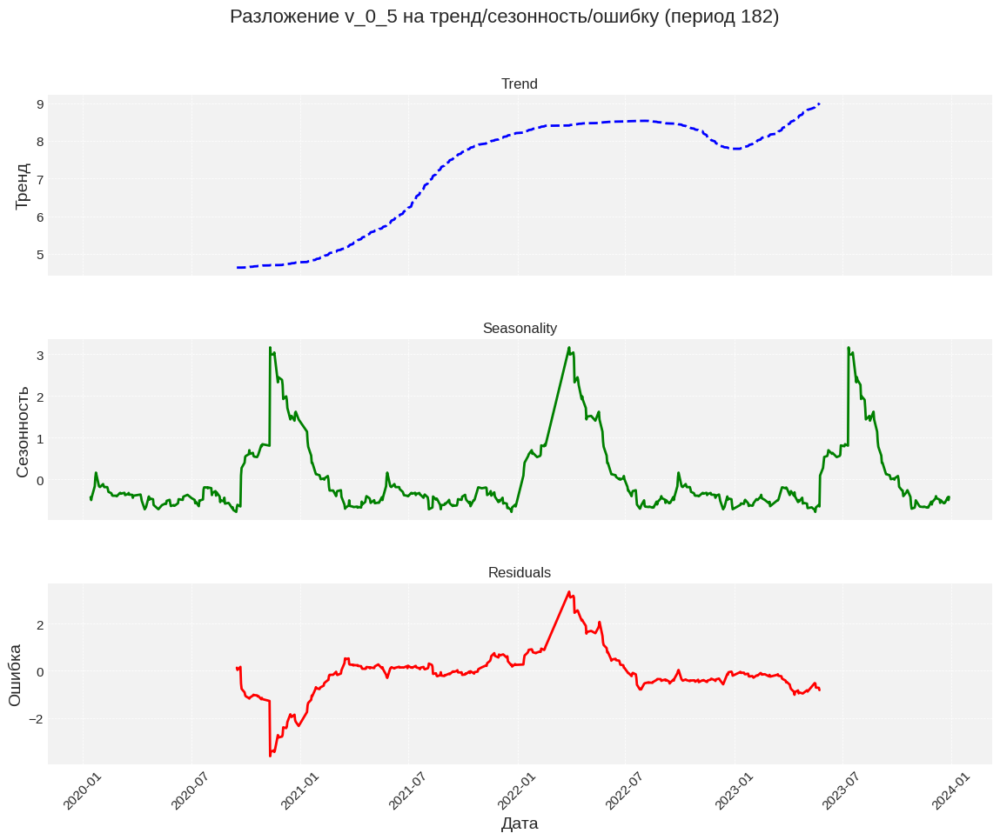

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


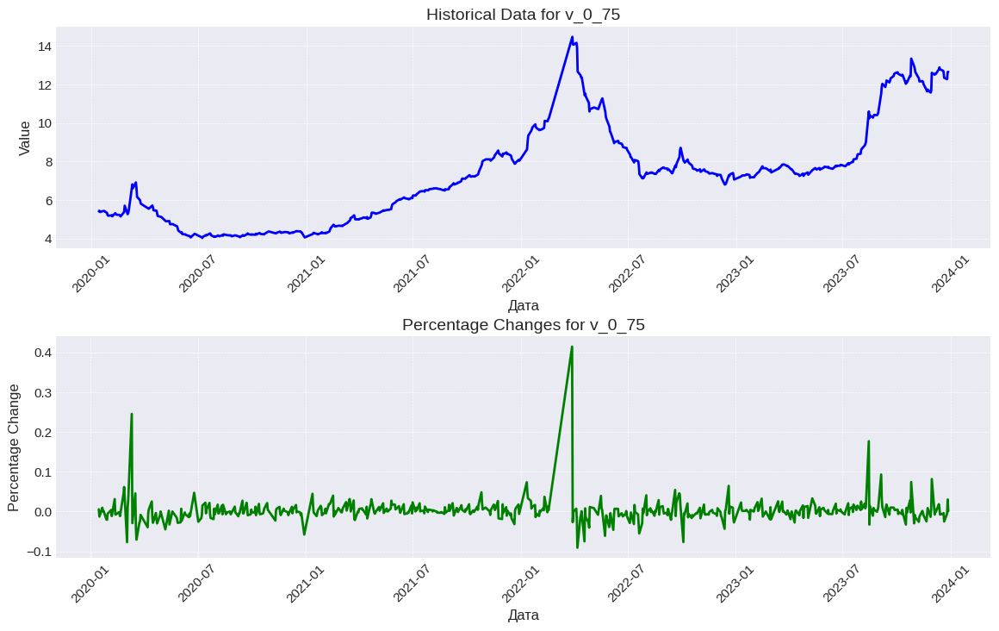

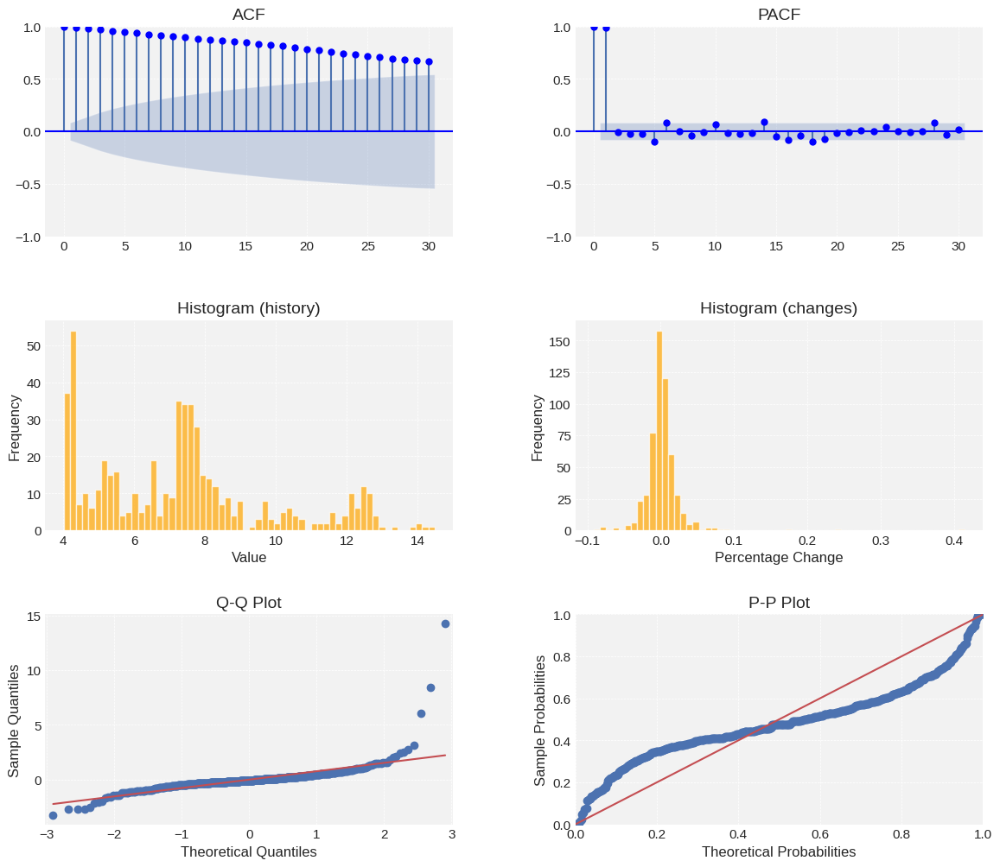

v_0_75
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.905)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.654)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.846)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.910)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


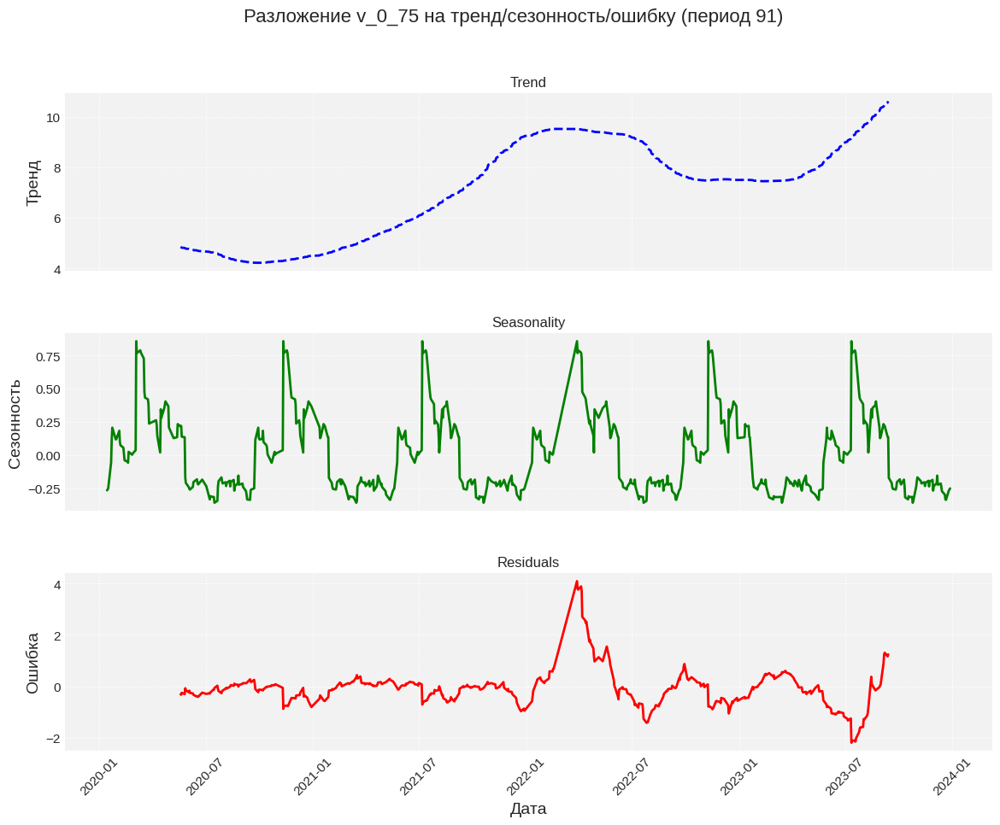

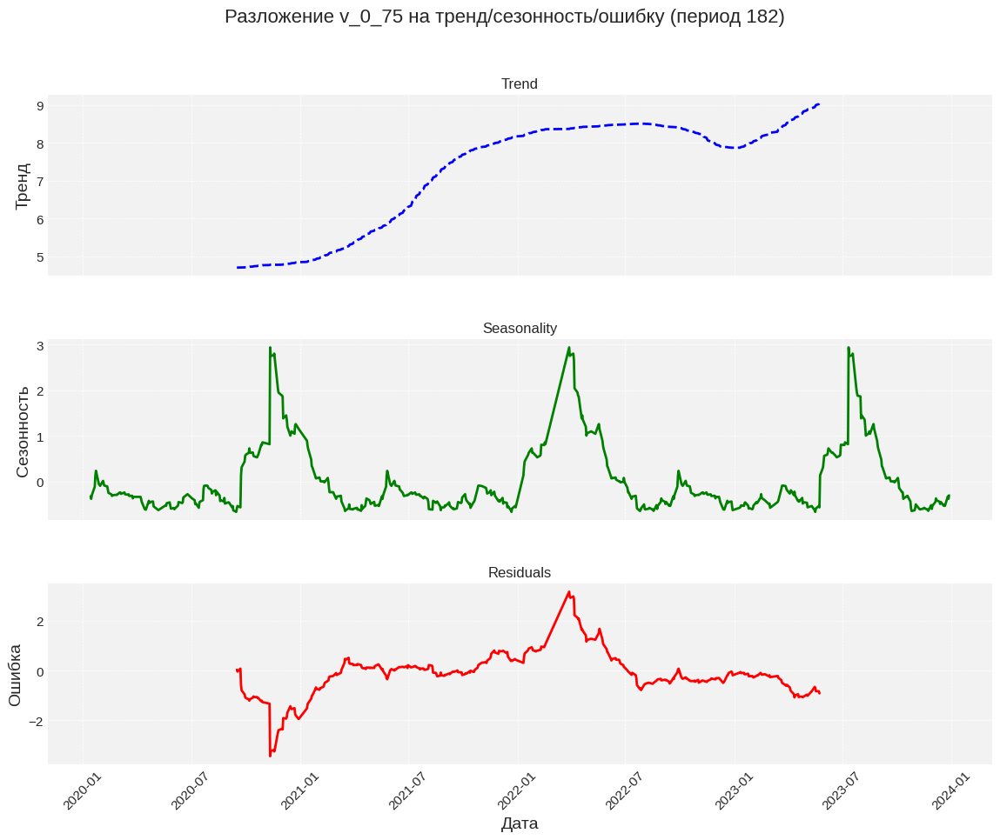

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


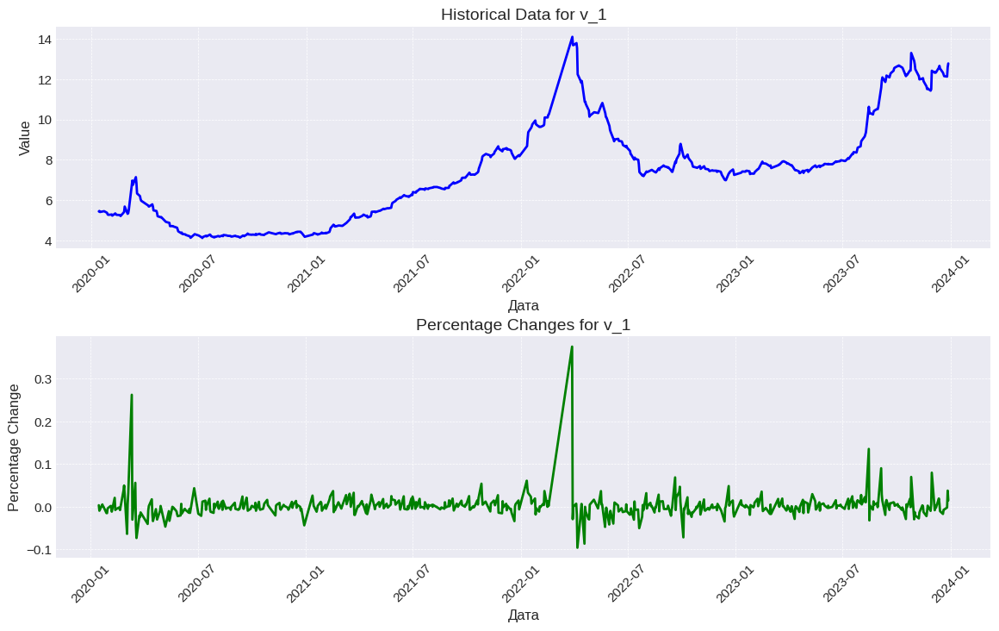

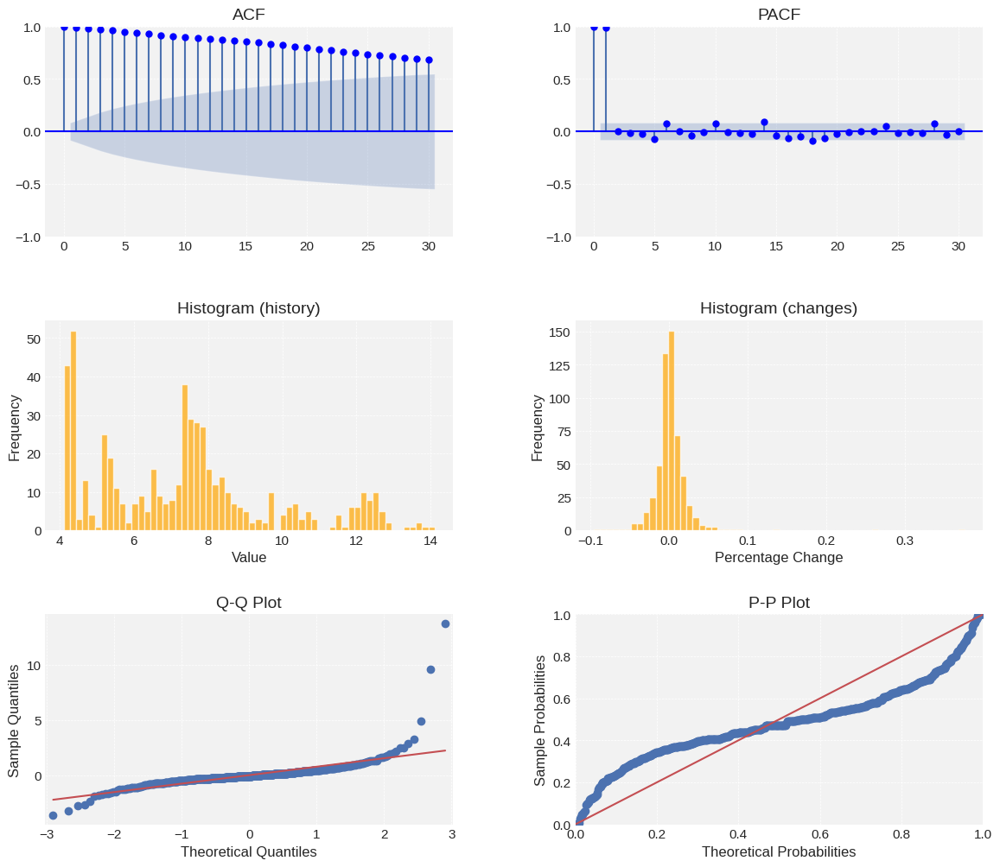

v_1
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.922)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.660)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.847)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.938)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


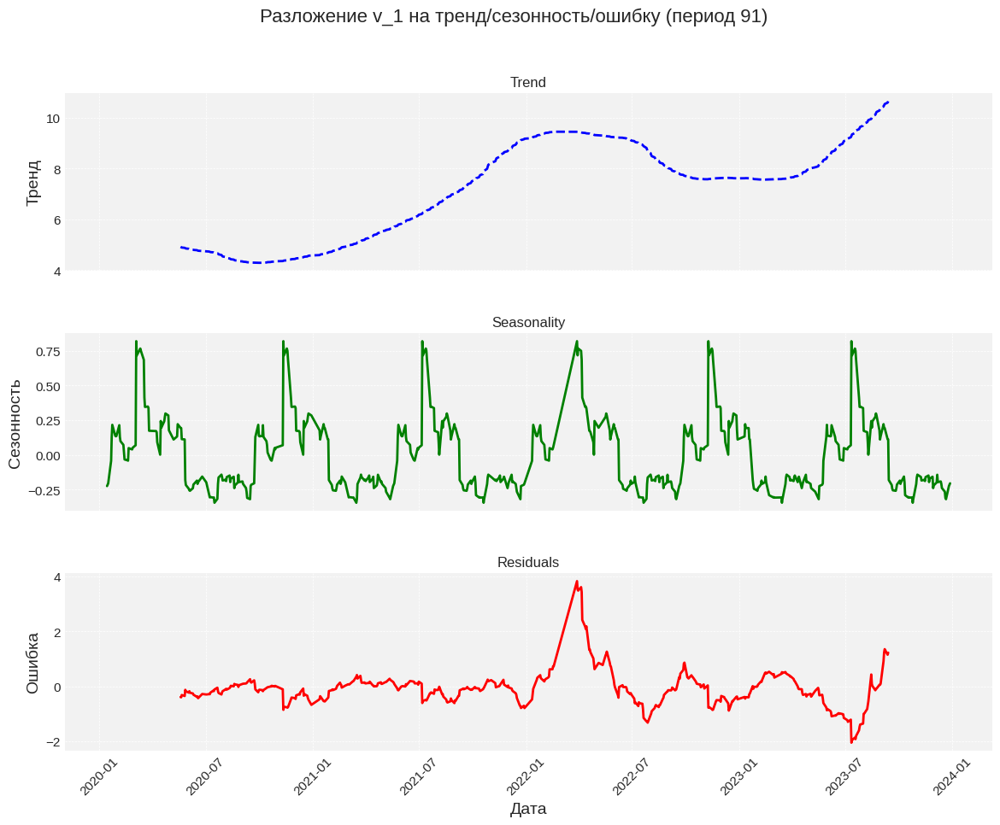

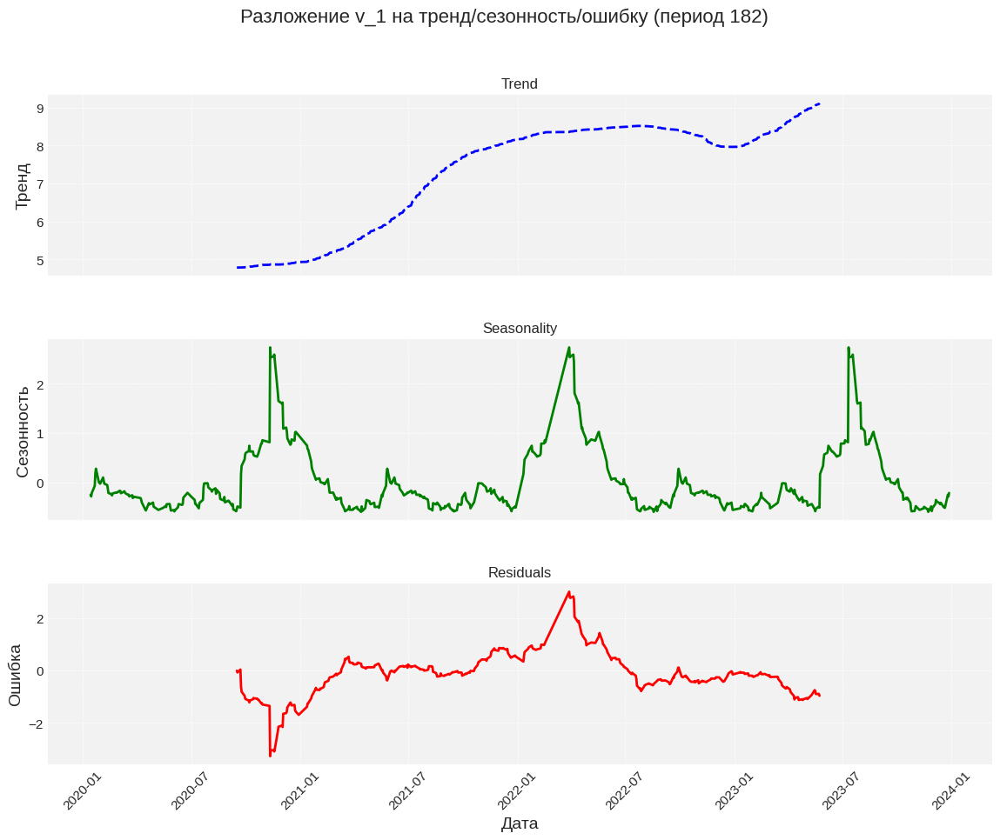

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


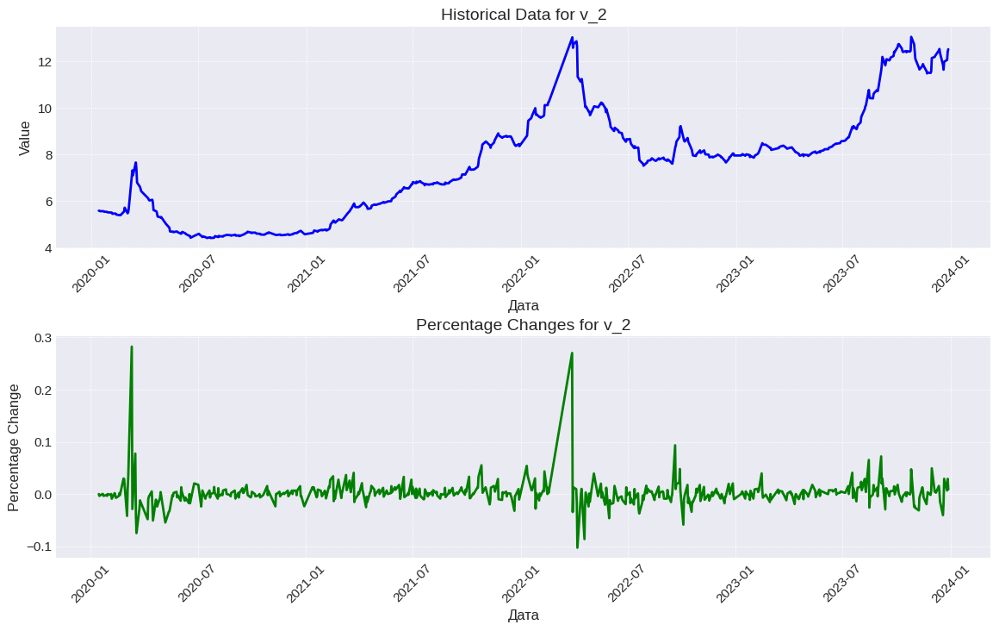

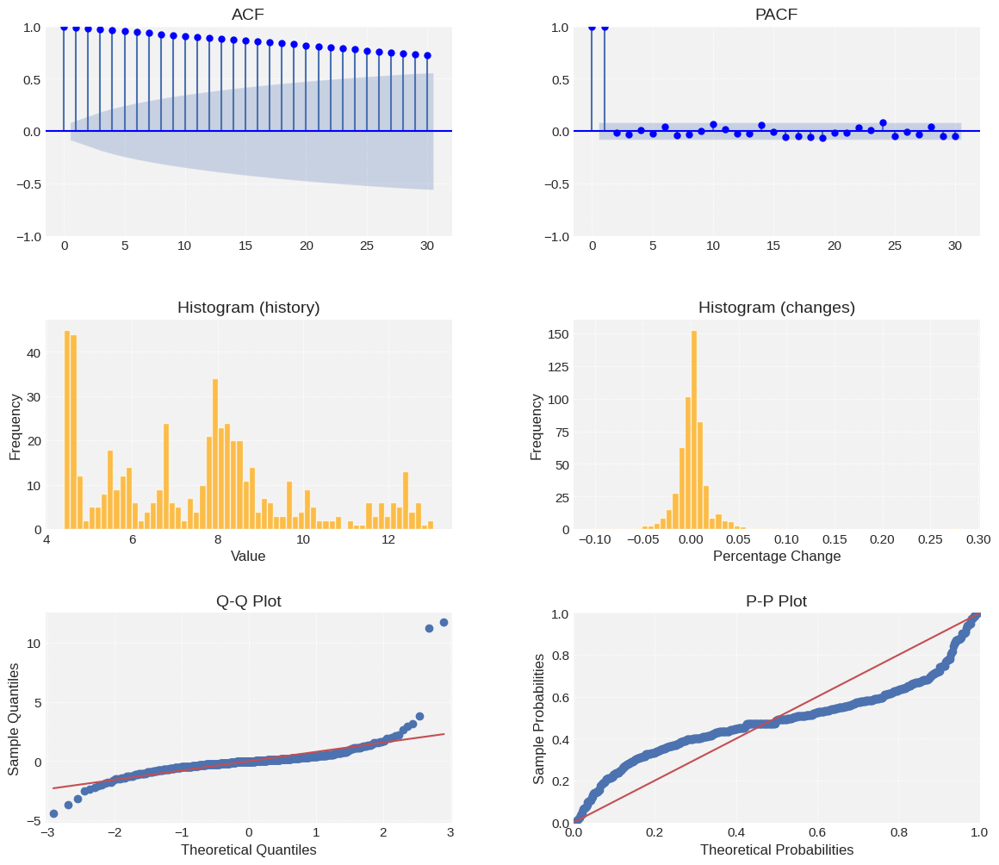

v_2
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.941)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.569)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.783)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.950)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


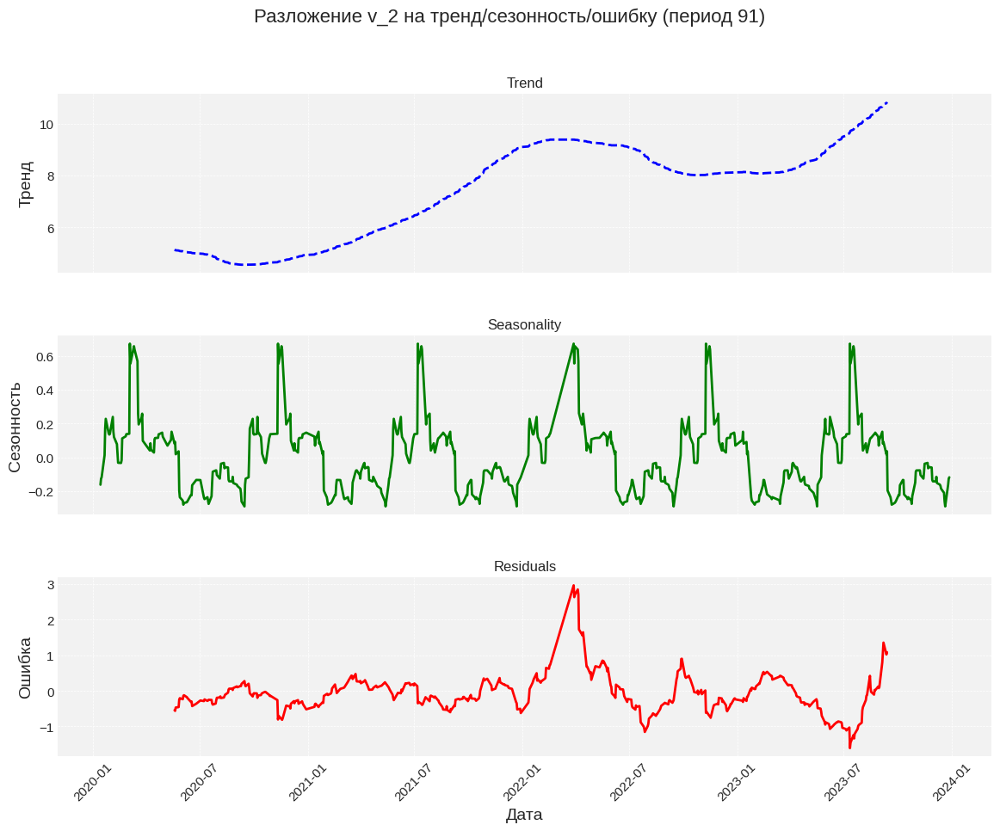

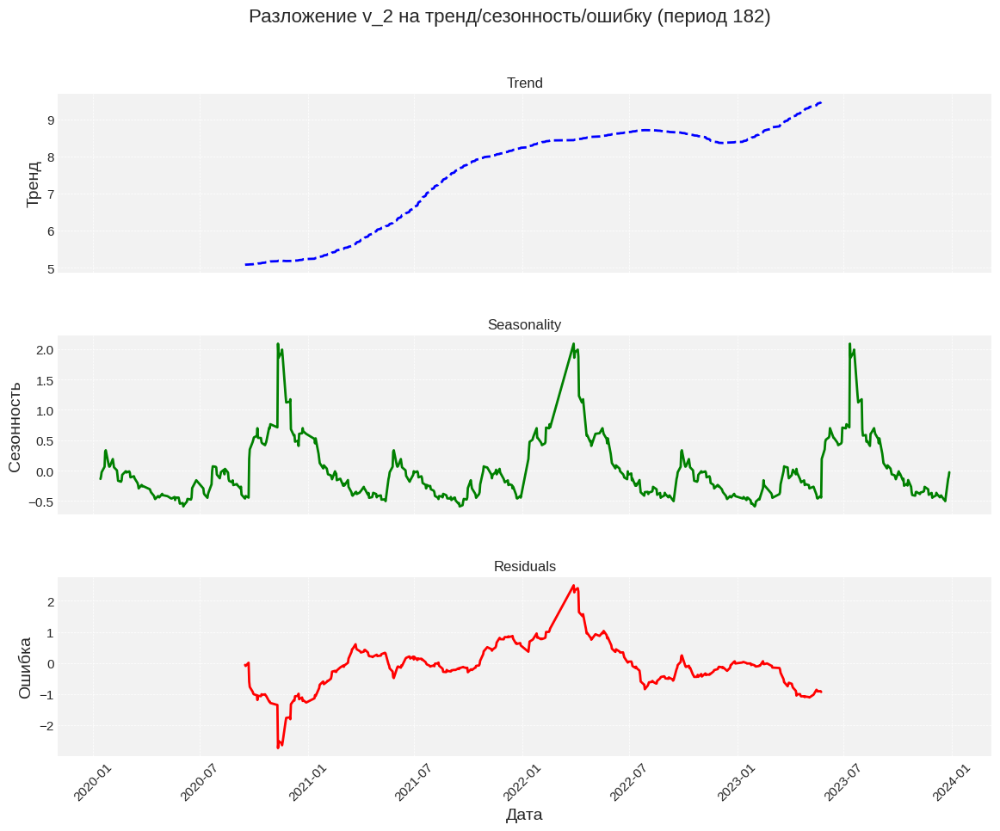

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


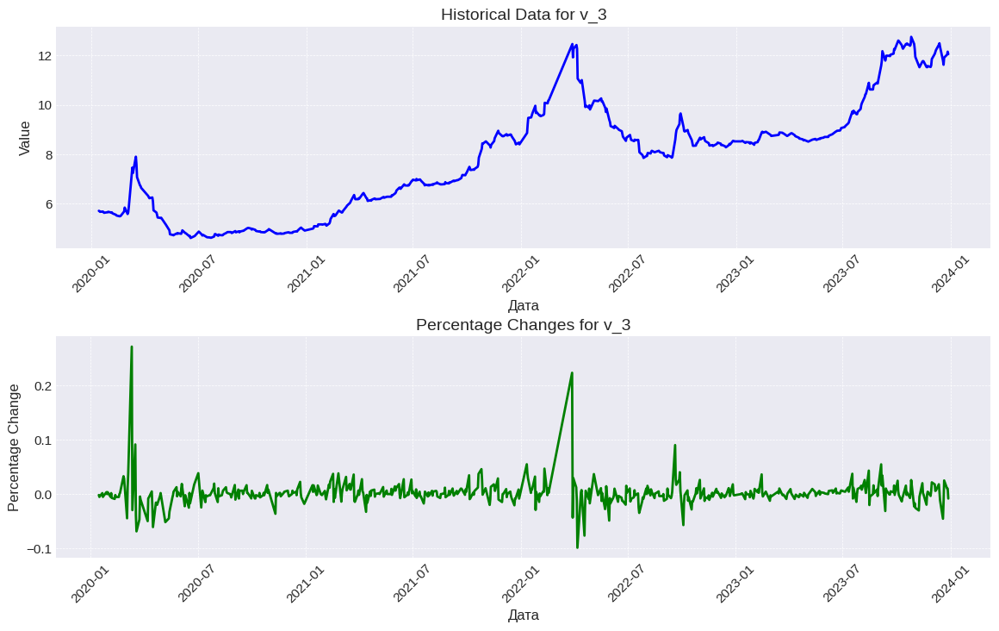

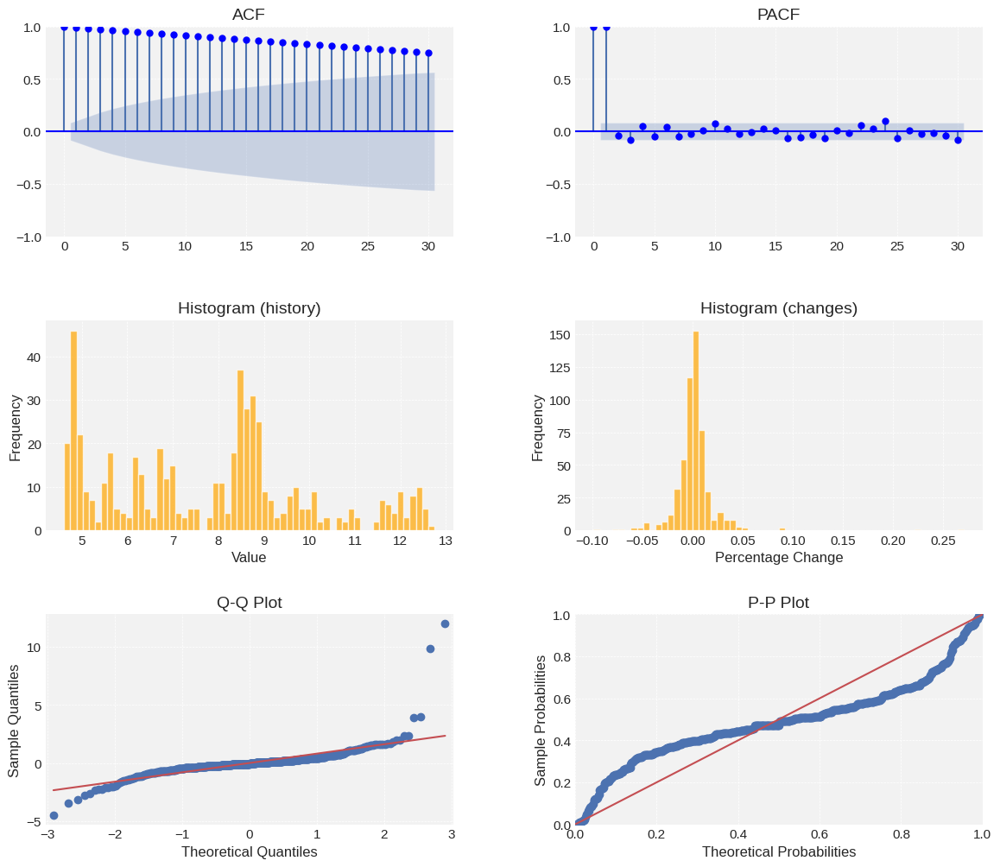

v_3
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.919)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.481)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.725)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.947)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


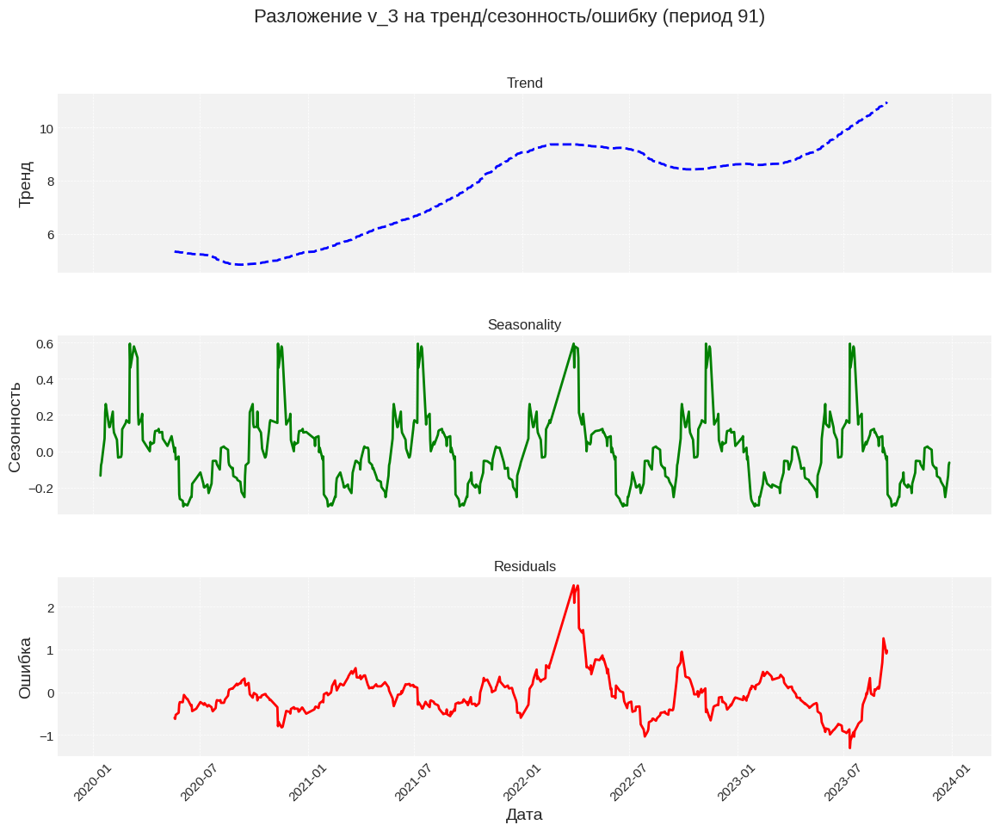

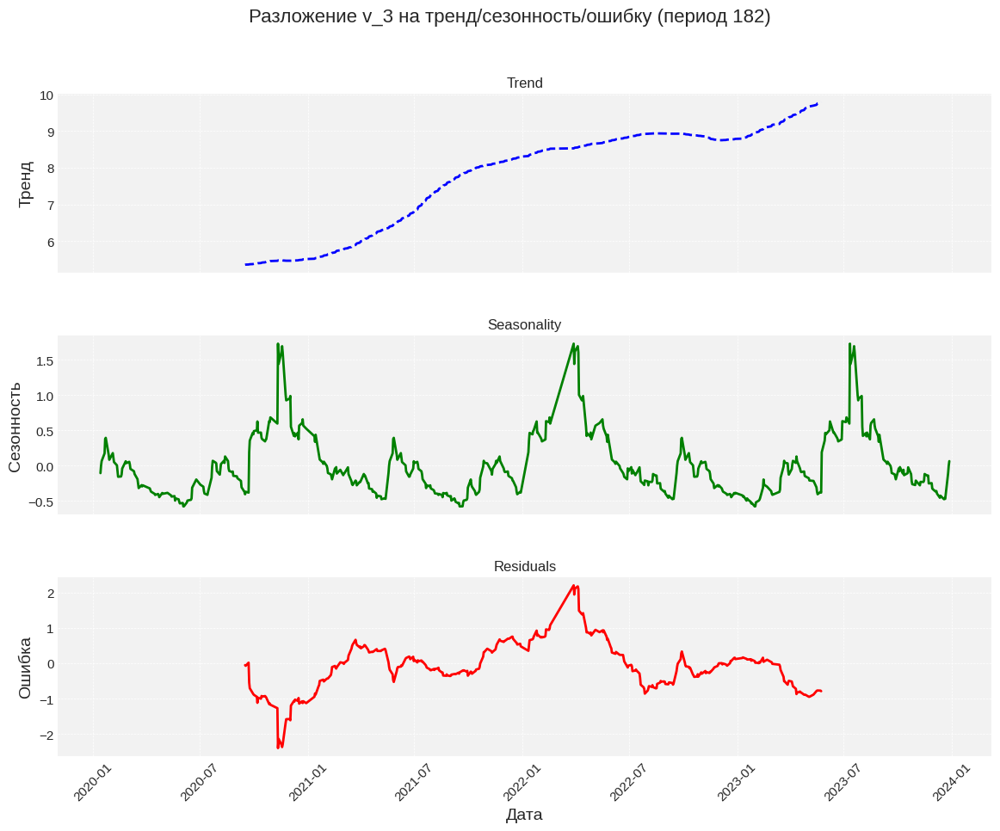

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


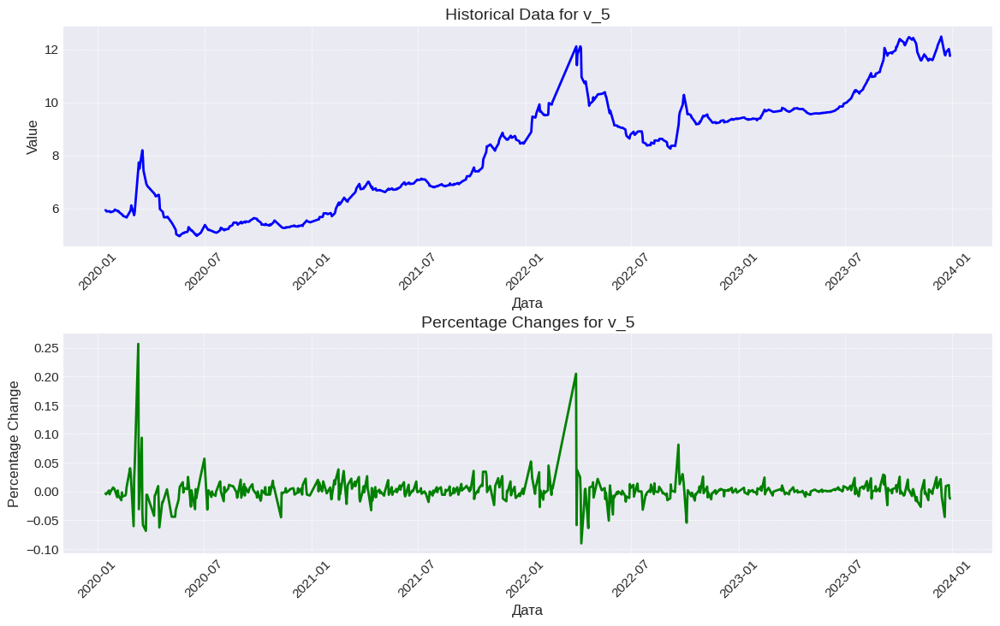

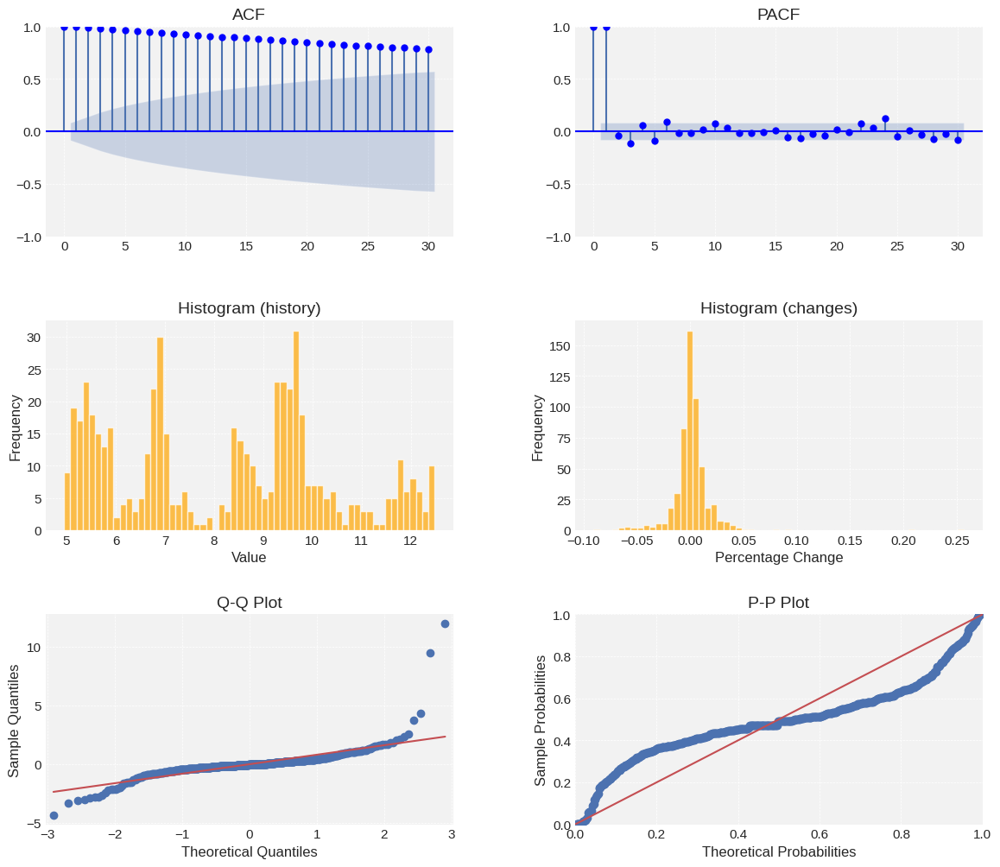

v_5
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.893)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.217)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.456)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.949)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


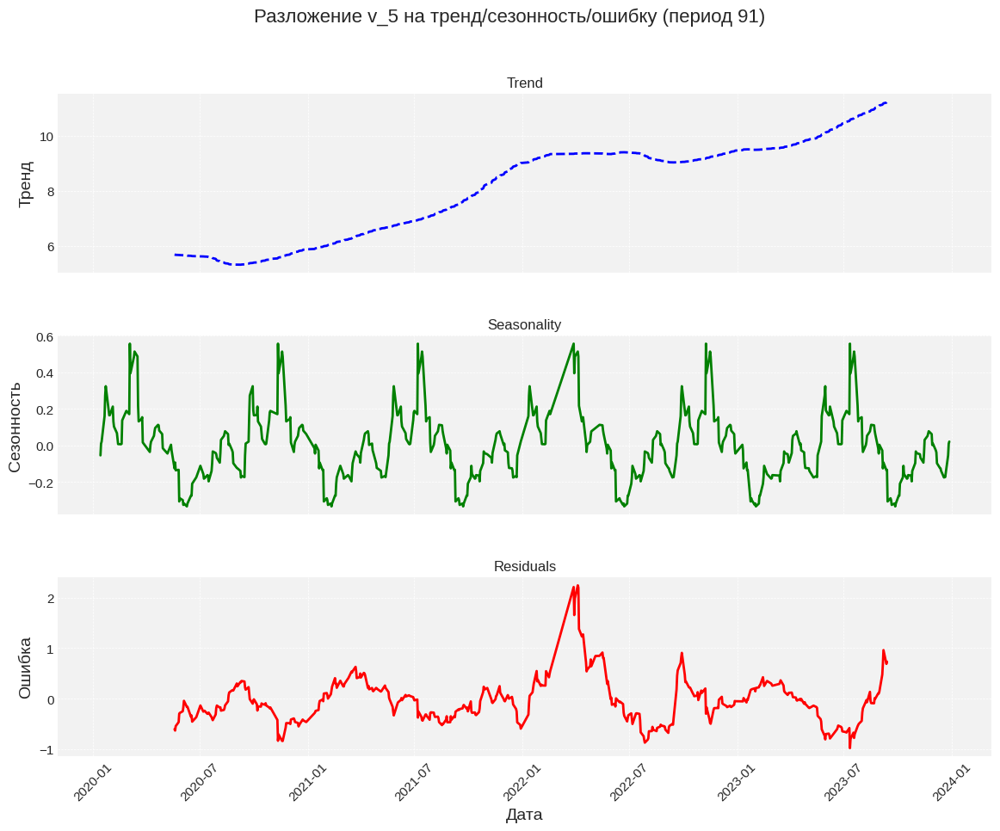

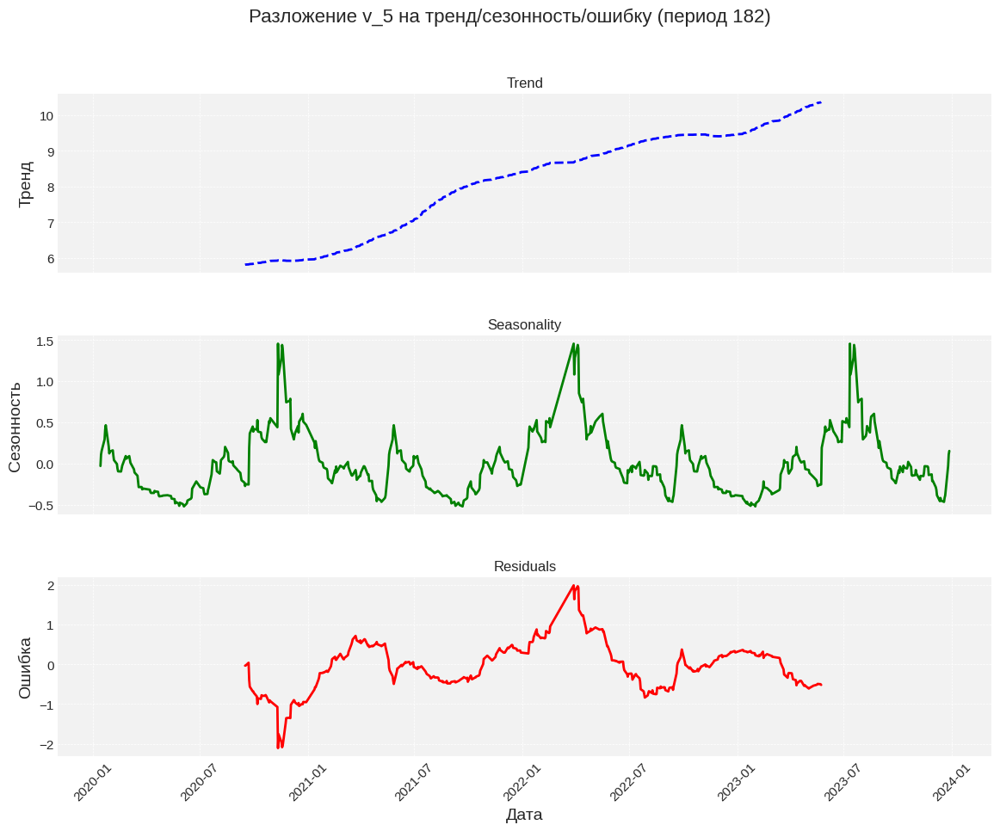

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


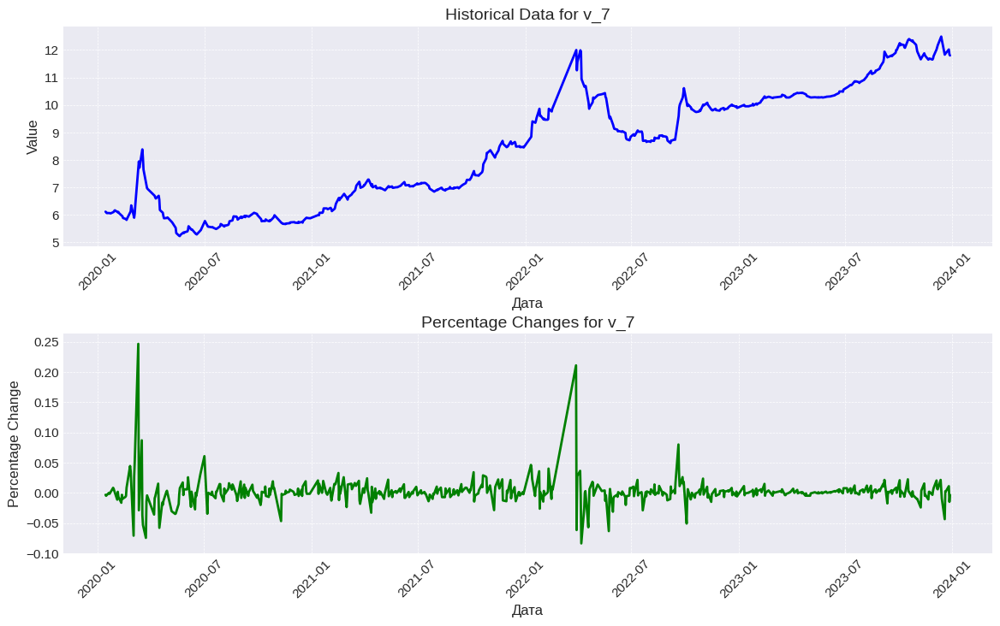

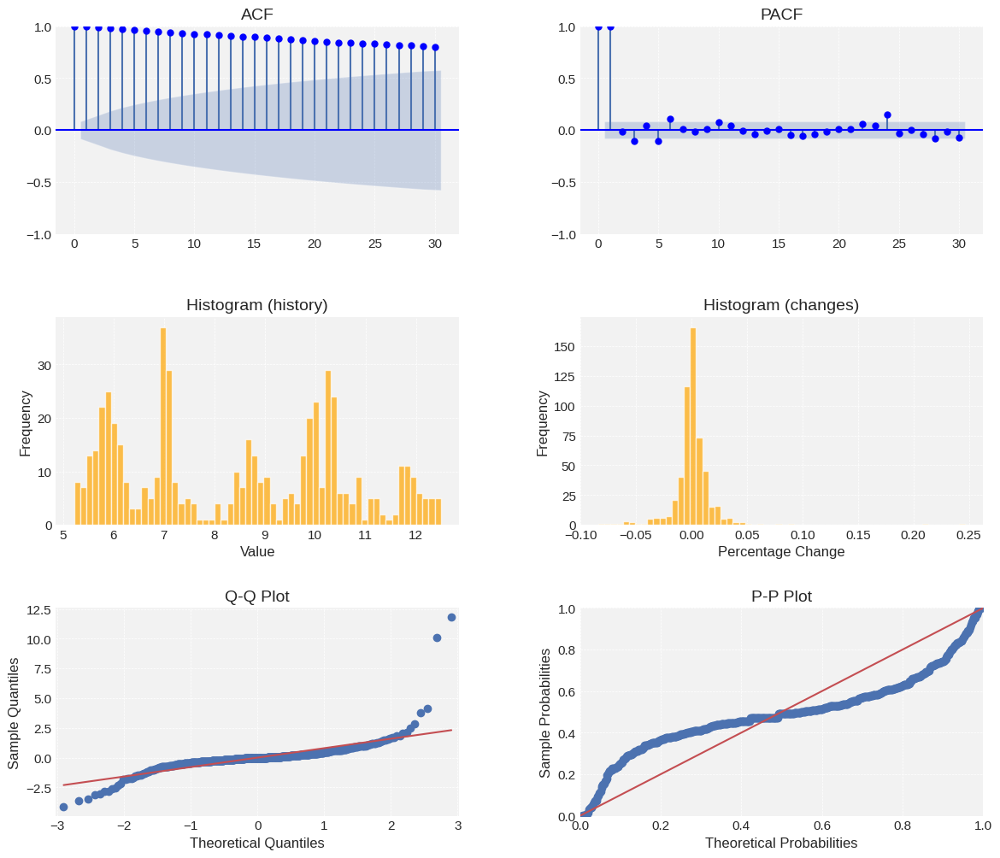

v_7
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.890)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.107)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.286)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.955)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


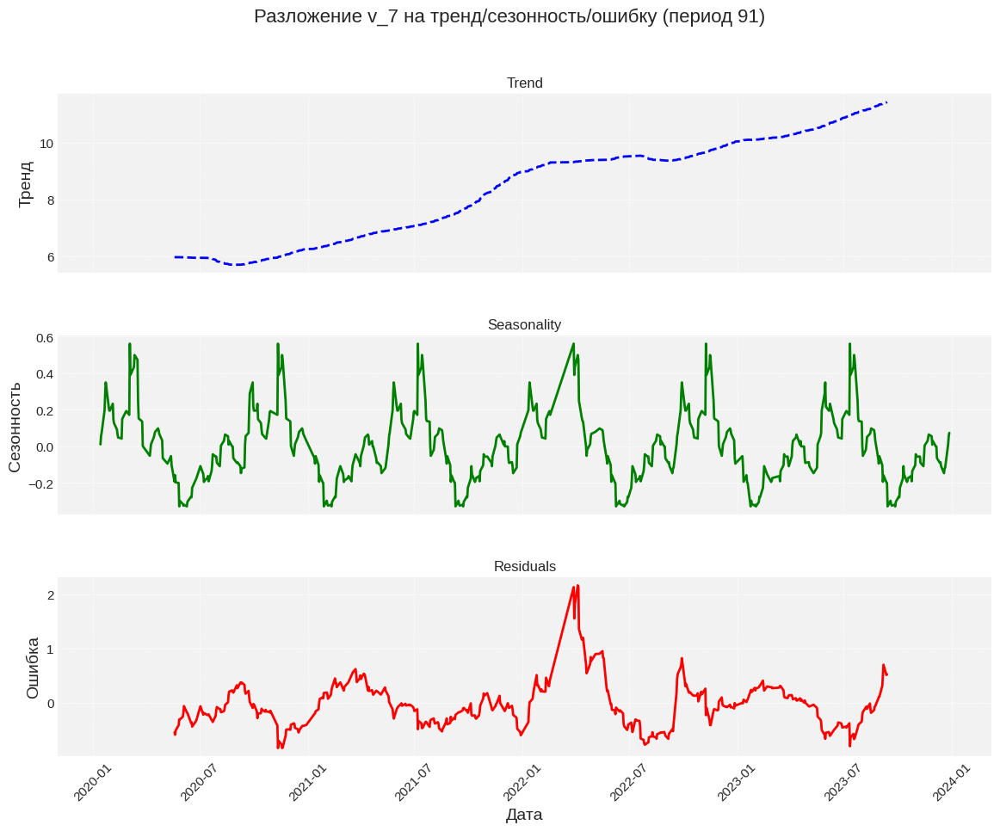

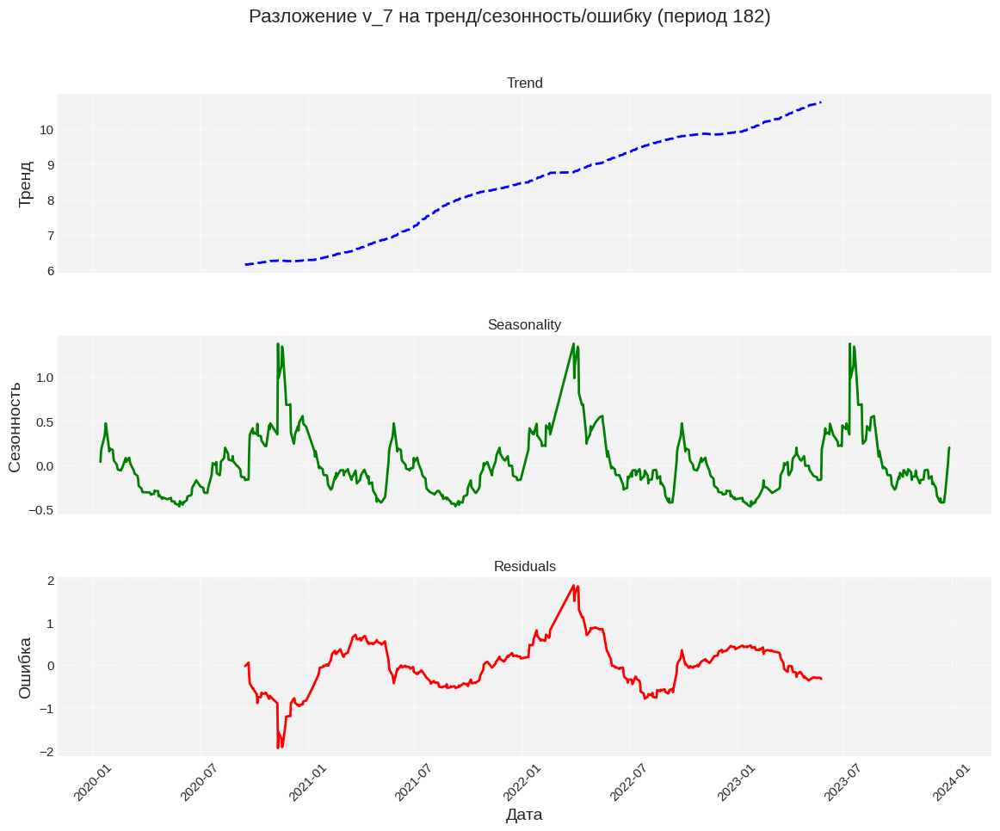

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


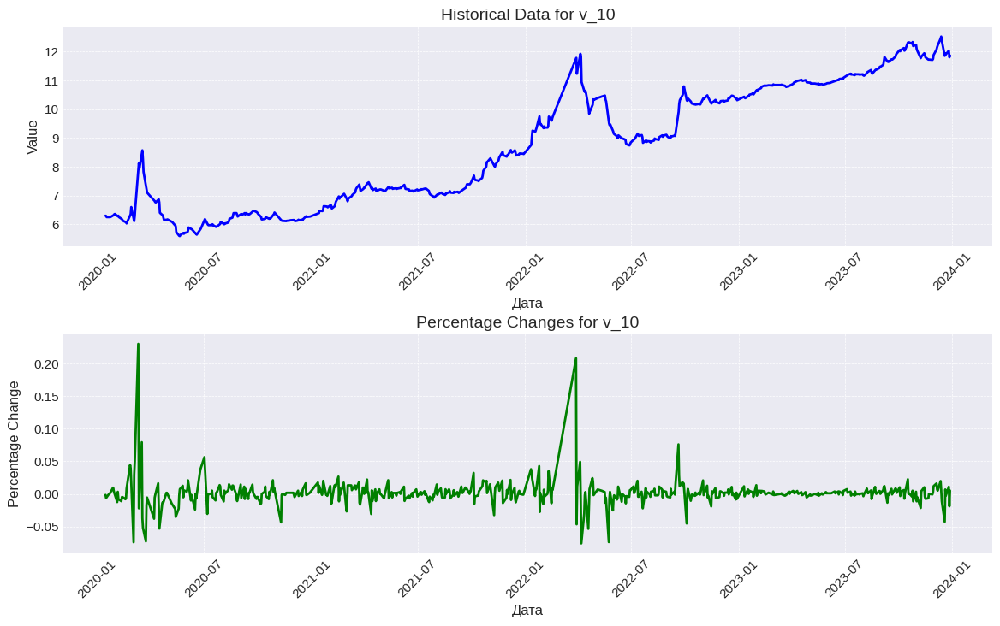

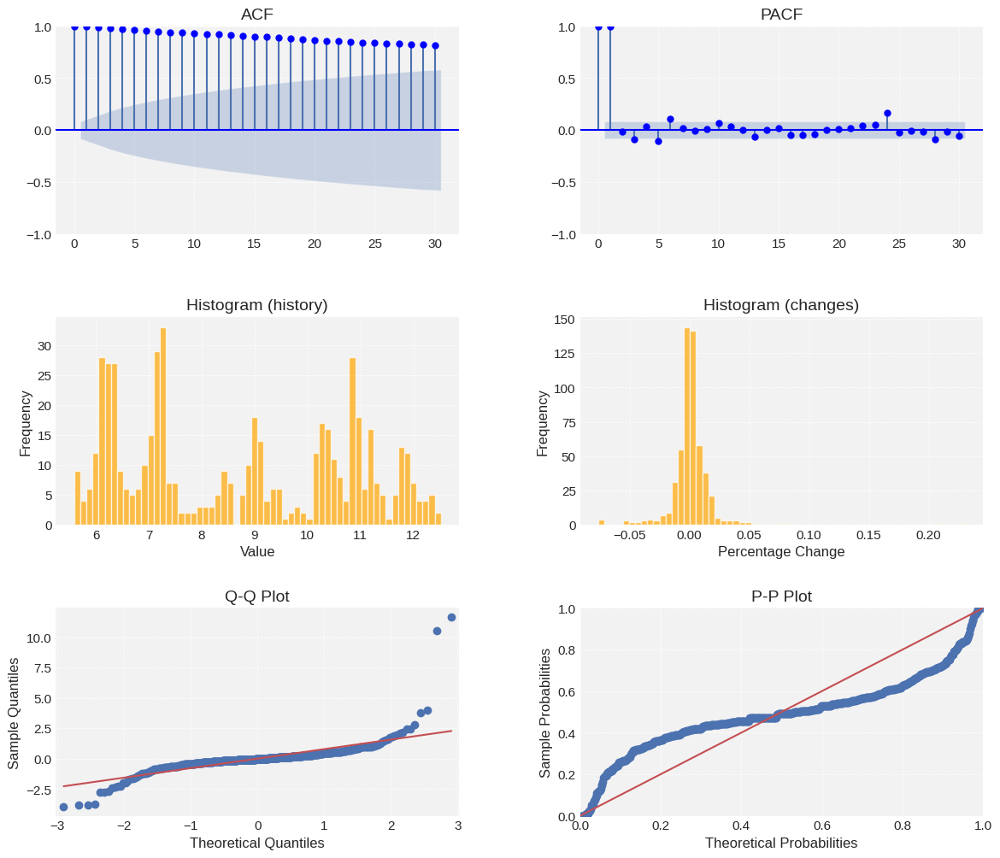

v_10
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.886)
Тест с константой и линейным трендом: H0 отвергается, ряд стационарен (p-value 0.075)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.220)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.959)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


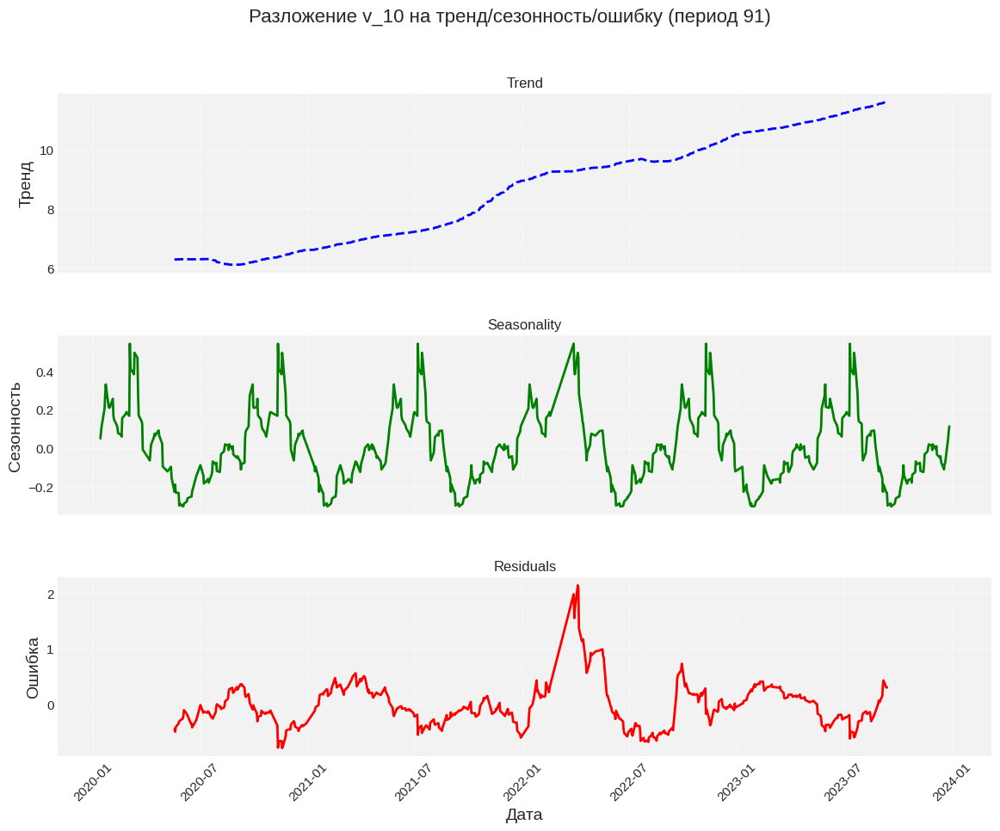

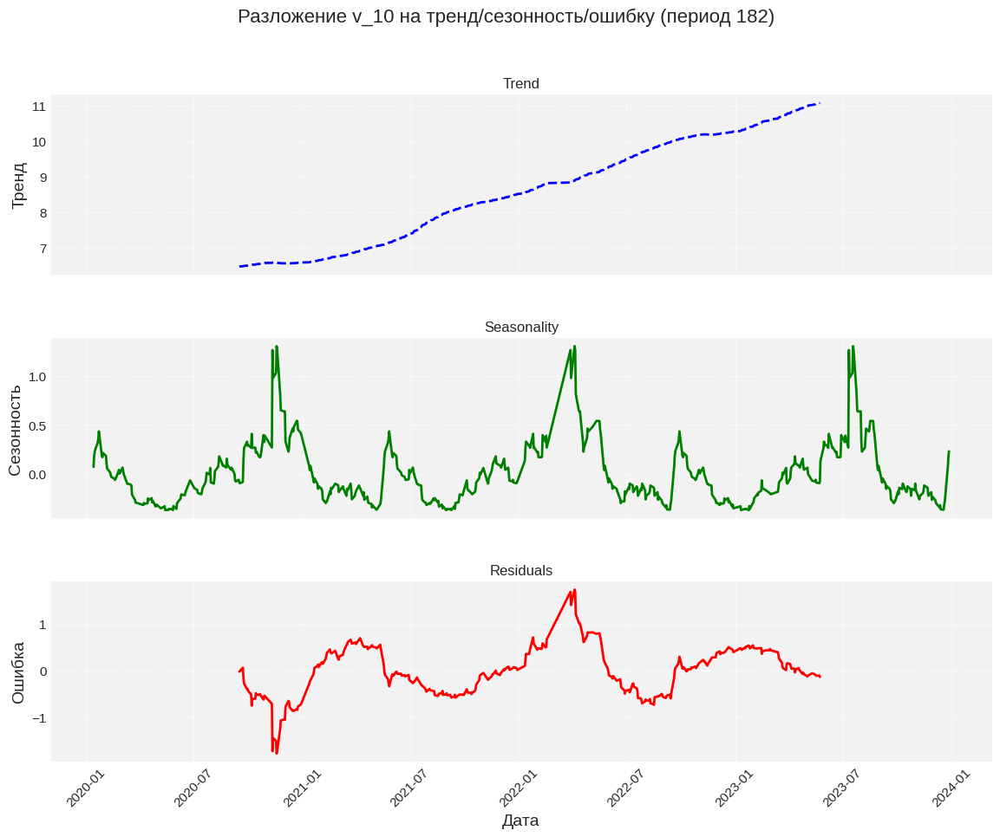

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


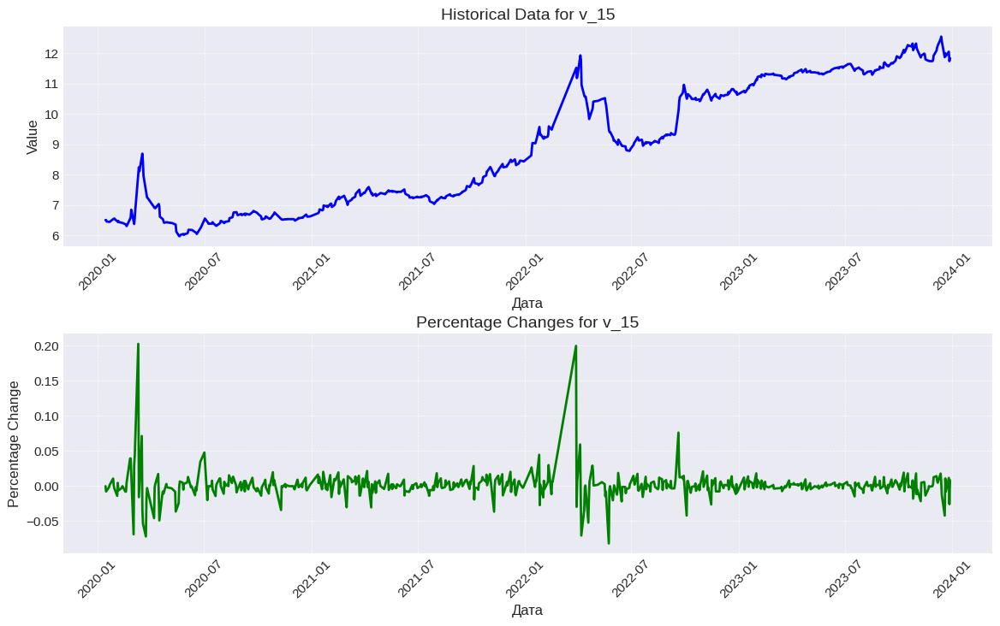

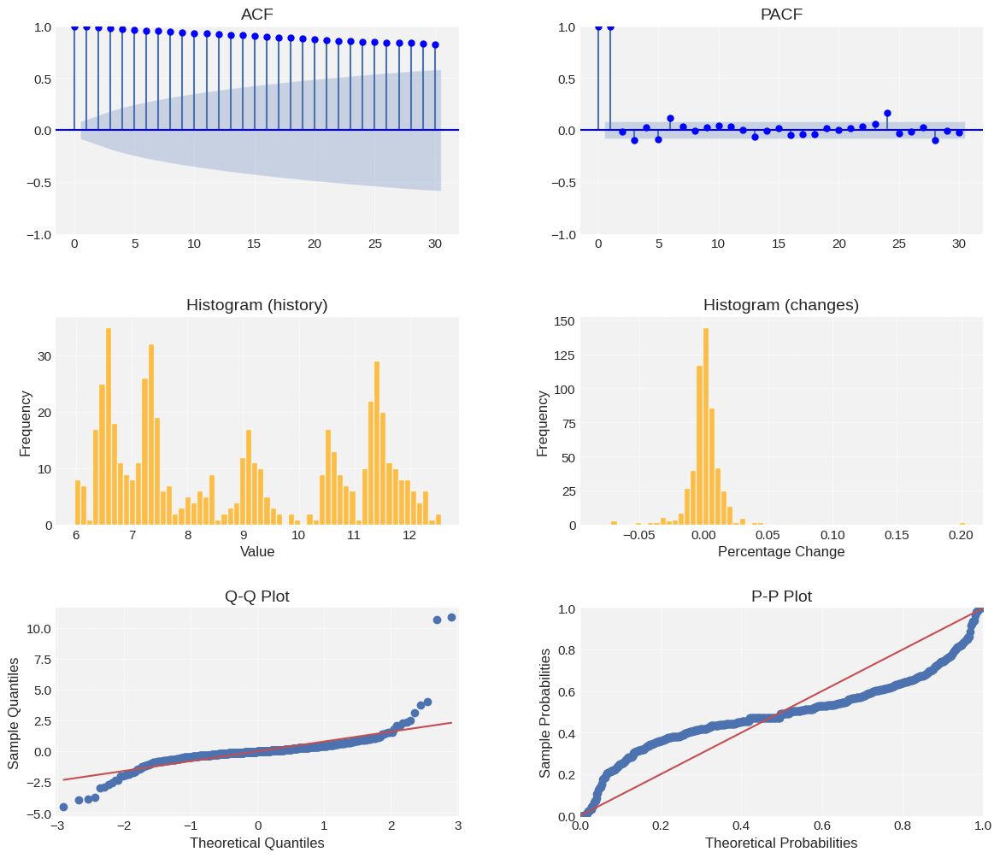

v_15
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.873)
Тест с константой и линейным трендом: H0 отвергается, ряд стационарен (p-value 0.091)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.263)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.958)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


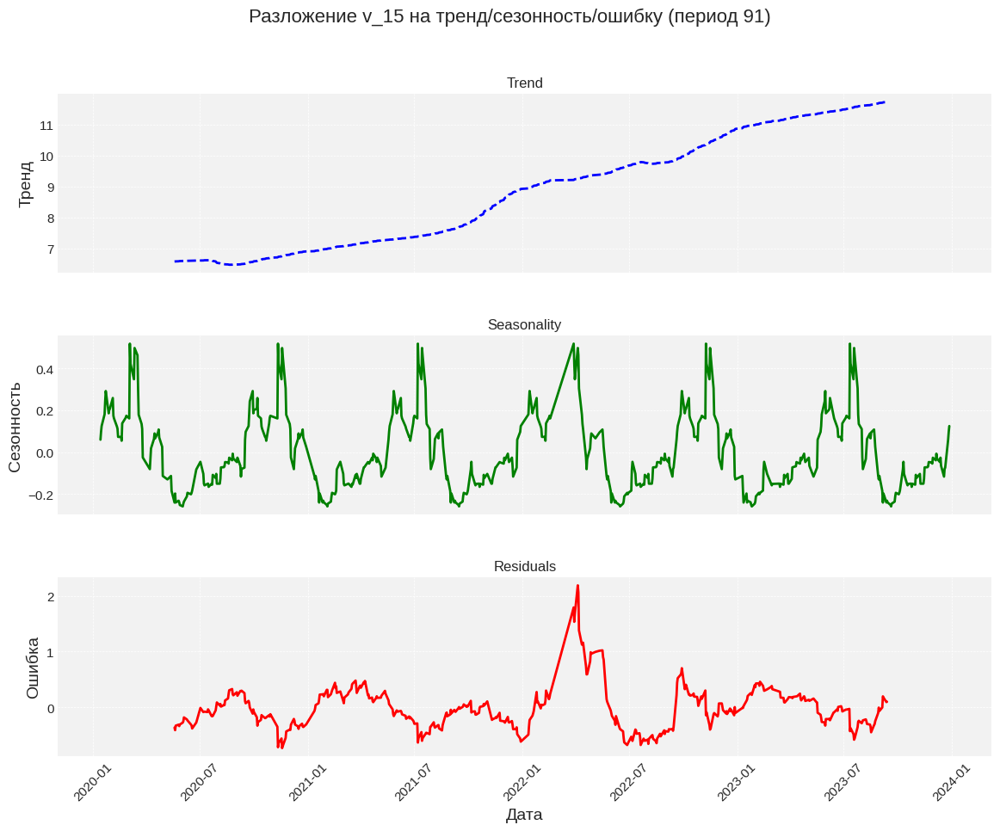

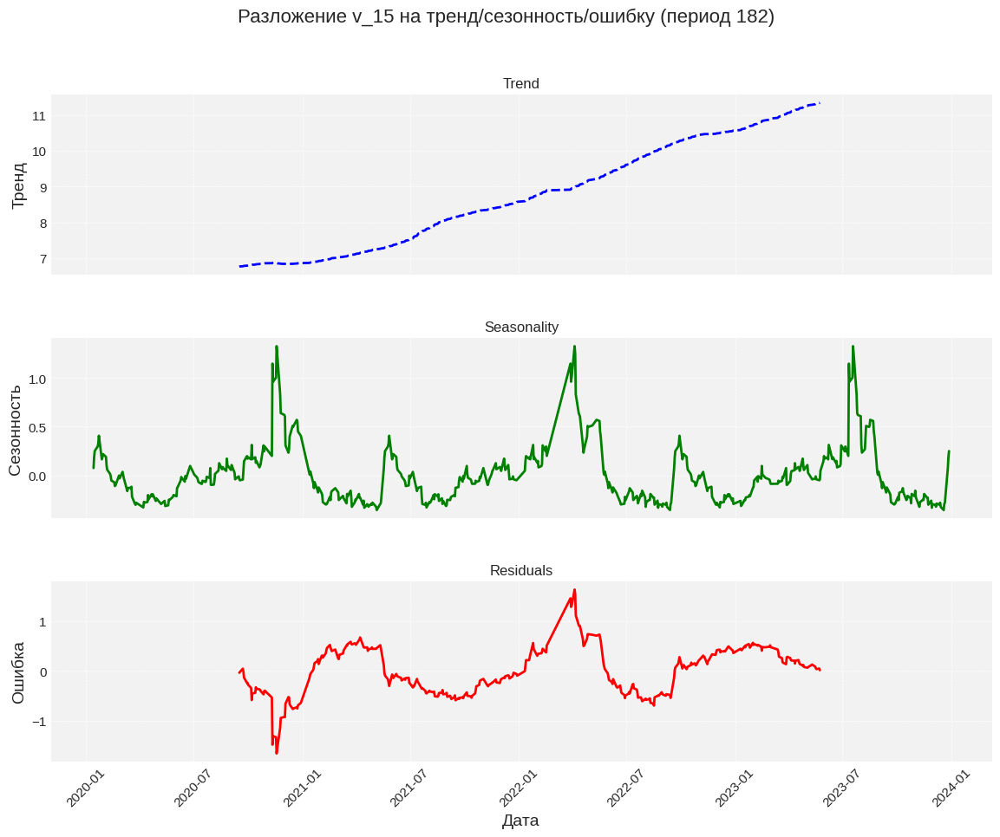

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


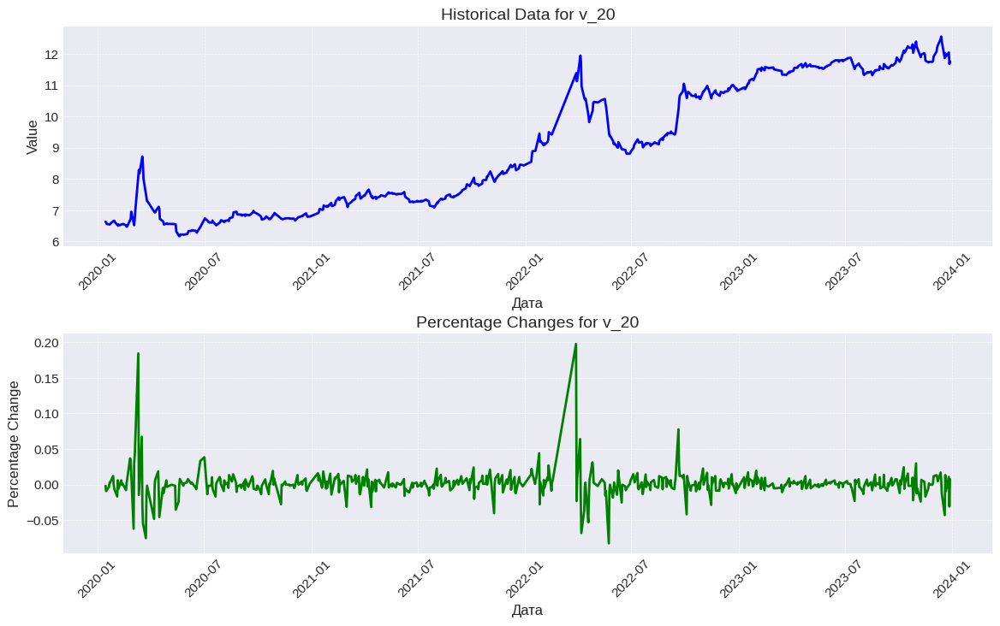

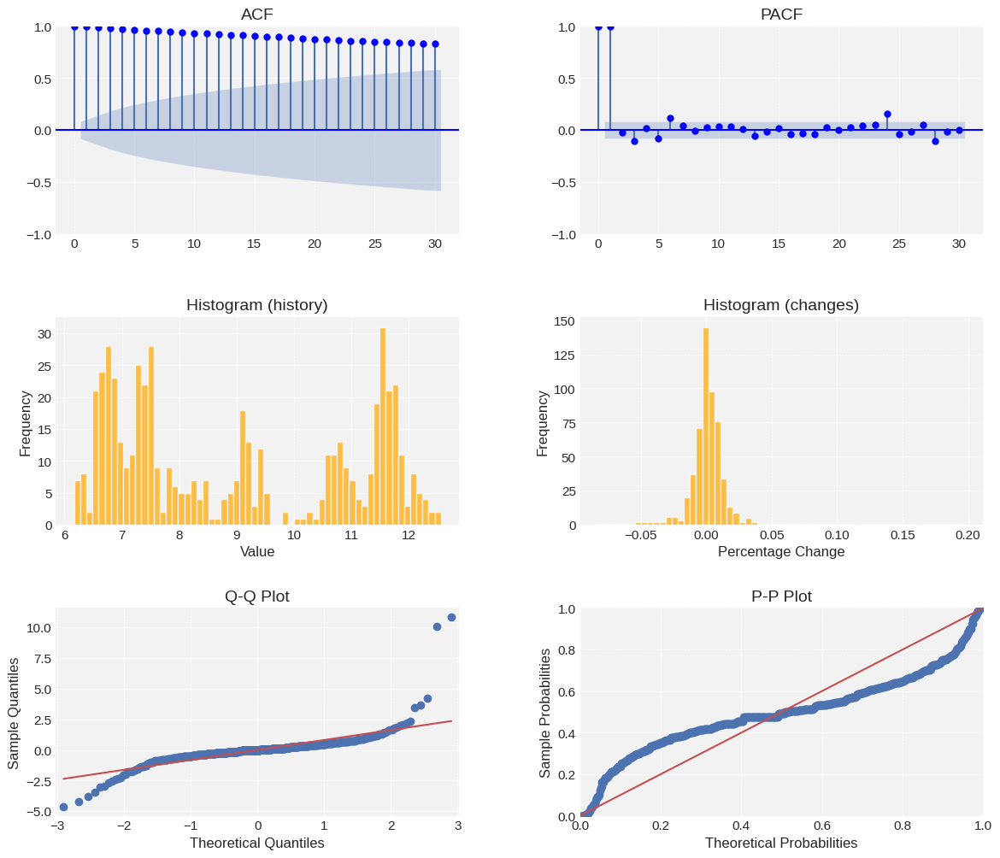

v_20
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.858)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.116)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.332)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.953)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


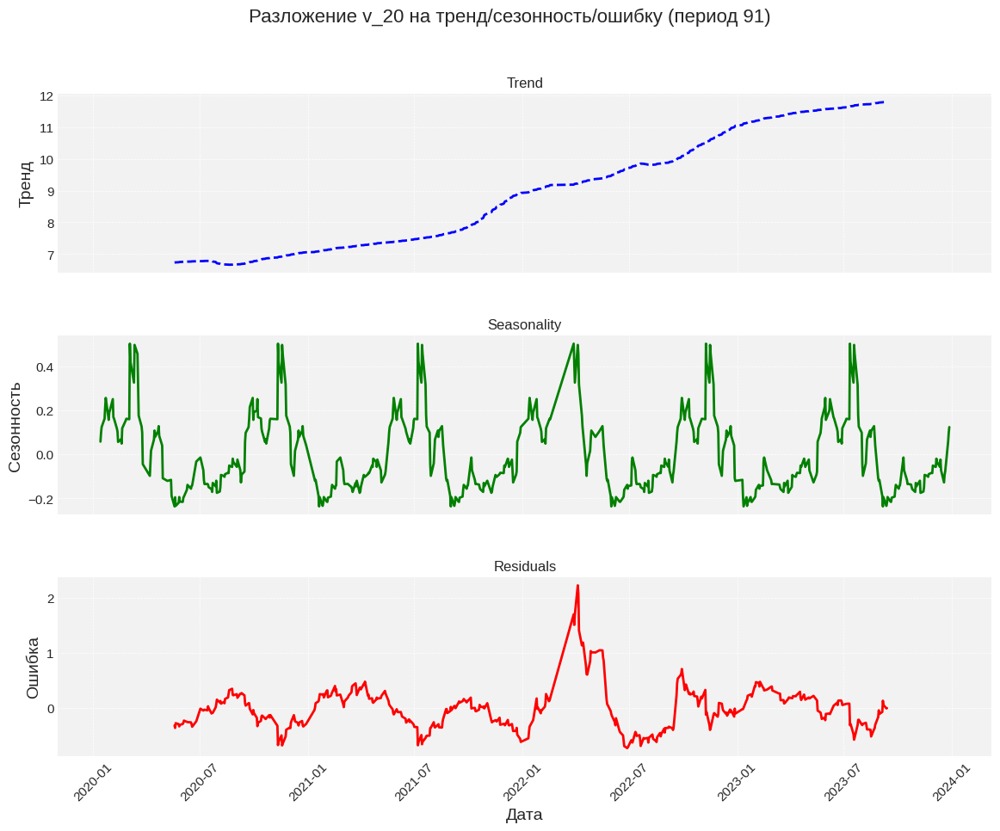

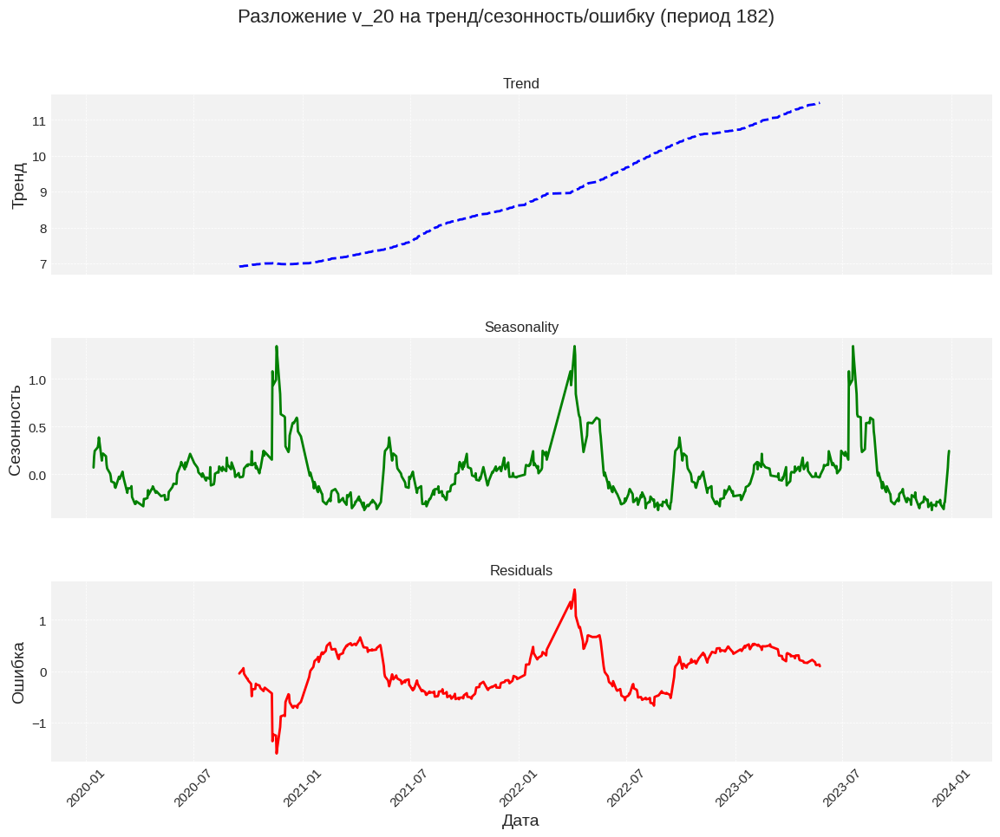

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


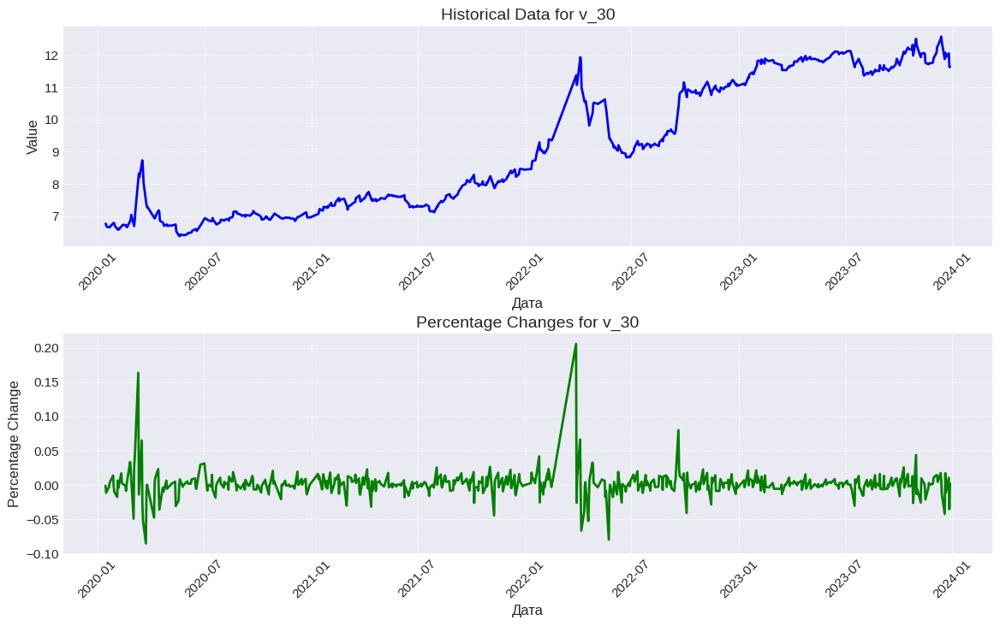

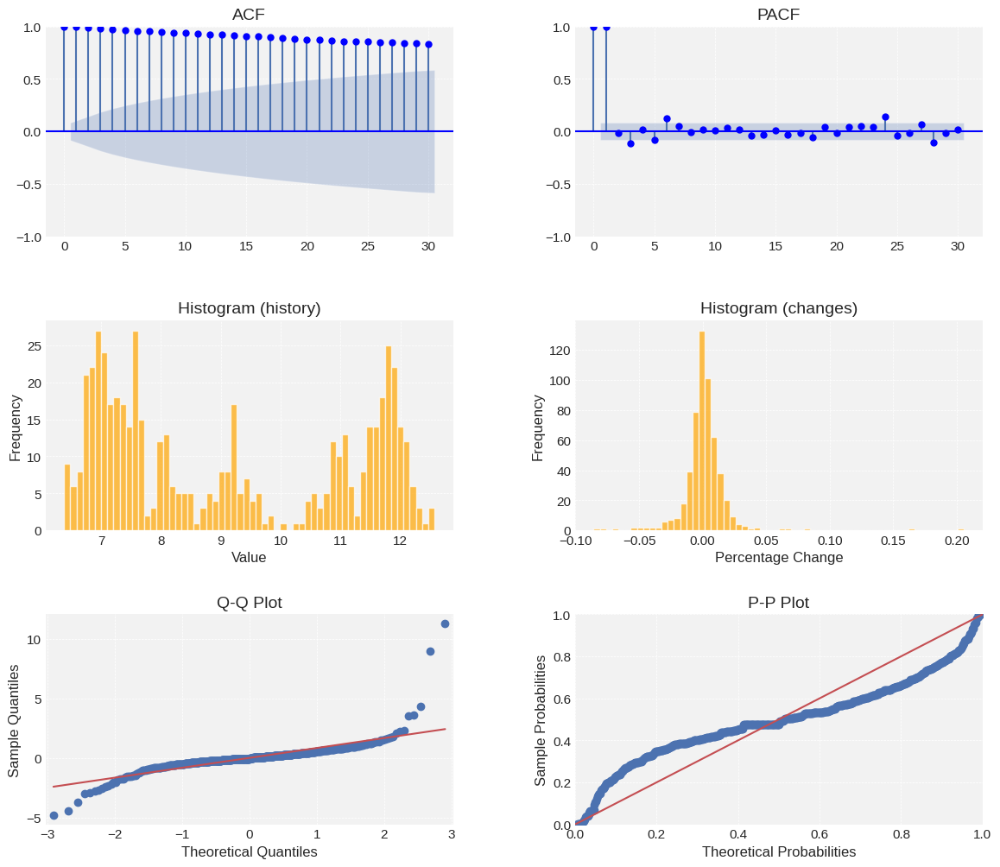

v_30
Расширенный тест Дики — Фуллера (ADF):
Тест с константой: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.829)
Тест с константой и линейным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.158)
Тест с константой, линейным и квадратичным трендом: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.449)
Тест без константы и тренда: нельзя отвергнуть H0, ряд может содержать единичные корни и быть нестационарным (p-value 0.953)
Тест с константой для процентных изменений: H0 отвергается, ряд стационарен (p-value 0.000)


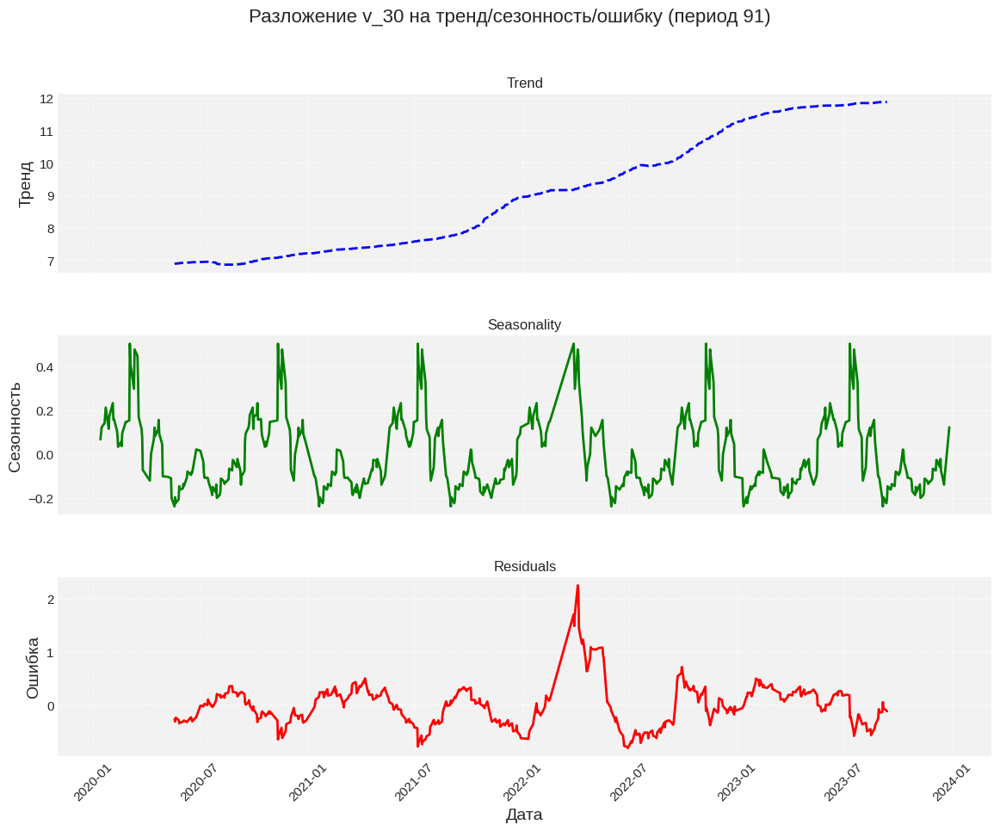

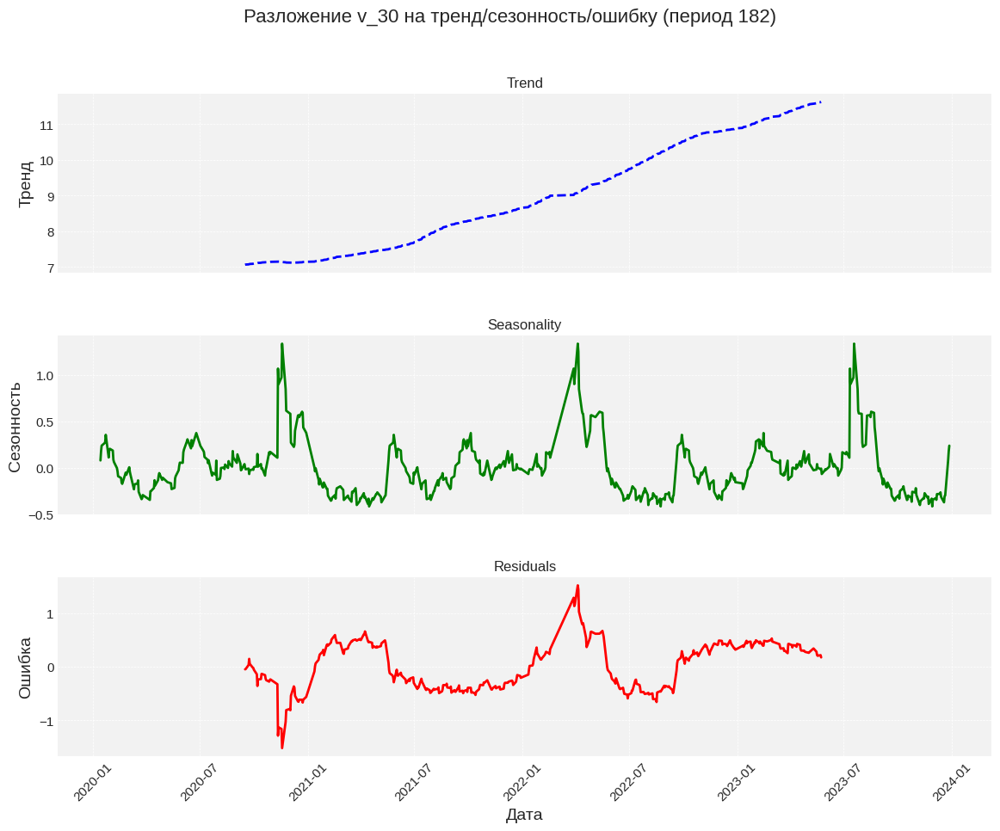

In [29]:
for column in df_risk.columns:
    if column != 'date':
        get_description(df_risk, column)

In [30]:
bond_quotes['TRADEDATE'] = pd.to_datetime(bond_quotes['TRADEDATE'])
shares_quotes['TRADEDATE'] = pd.to_datetime(shares_quotes['TRADEDATE'])
df_risk['date'] = pd.to_datetime(df_risk['date'])

# Создадим сводные таблицы из bond_quotes и shares_quotes
bond_pivot = bond_quotes.pivot(index='TRADEDATE', columns='SECID', values='CLOSE')
shares_pivot = shares_quotes.pivot(index='TRADEDATE', columns='SECID', values='CLOSE')

# Объединим сводные таблицы с основным датафреймом по дате
df_risk = df_risk.merge(bond_pivot, left_on='date', right_index=True, how='inner', suffixes=('', '_bond'))
df_risk = df_risk.merge(shares_pivot, left_on='date', right_index=True, how='inner', suffixes=('', '_share'))

df_risk

,date,MOEX,MOEXBC,RTSI,USD,EUR,BRENT,v_0_25,v_0_5,v_0_75,v_1,v_2,v_3,v_5,v_7,v_10,v_15,v_20,v_30,SU26207RMFS9,SU26212RMFS9,SU26224RMFS4,SU26225RMFS1,SU26228RMFS5,GAZP,GMKN,LKOH,MGNT,MTSS,NVTK,ROSN,SBER,TRNFP,YNDX
0,2020-01-14,3129.77,21295.55,1604.96,60.9474,67.8162,64.489998,5.36,5.38,5.41,5.44,5.58,5.71,5.93,6.11,6.30,6.50,6.63,6.76,112.645,106.694,106.293,109.699,111.900,250.00,20000.0,6520.5,3339.0,317.30,1259.0,475.50,259.05,177700.0,2685.0
1,2020-01-15,3132.63,21310.72,1602.29,61.4140,68.4213,64.000000,5.41,5.42,5.44,5.46,5.58,5.70,5.91,6.09,6.29,6.50,6.62,6.75,112.489,106.205,105.850,109.500,111.600,251.30,20396.0,6552.5,3440.0,318.65,1260.0,474.50,256.31,176850.0,2690.0
2,2020-01-16,3157.23,21500.64,1612.72,61.4328,68.3747,64.620003,5.30,5.33,5.37,5.41,5.56,5.67,5.88,6.06,6.25,6.45,6.56,6.67,112.456,106.535,106.105,109.530,111.600,254.26,20900.0,6590.0,3625.0,319.80,1264.0,480.95,257.51,178000.0,2719.8
3,2020-01-21,3209.22,21835.38,1634.32,61.4654,68.2082,64.589996,5.39,5.40,5.42,5.44,5.56,5.68,5.89,6.06,6.25,6.44,6.54,6.65,112.615,106.599,106.244,109.600,111.550,252.99,21450.0,6708.5,3840.0,328.70,1242.0,486.15,268.06,178400.0,2770.0
4,2020-01-22,3174.62,21589.08,1612.87,61.8552,68.6222,63.209999,5.36,5.39,5.42,5.45,5.56,5.65,5.86,6.05,6.25,6.45,6.56,6.67,112.610,106.649,106.224,109.620,111.748,248.10,21310.0,6655.5,3750.0,333.80,1196.8,478.15,266.54,178050.0,2790.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
544,2023-12-20,3104.66,19762.76,1075.11,90.0870,98.5764,79.699997,14.43,13.37,12.67,12.23,11.63,11.62,11.77,11.86,11.93,12.00,12.03,12.07,92.244,86.212,82.100,74.716,83.080,163.56,17114.0,6735.0,6692.5,250.00,1531.2,578.60,266.61,143550.0,2288.8
545,2023-12-21,3073.57,19576.20,1051.87,90.4056,99.0480,79.389999,13.85,12.82,12.35,12.15,11.97,11.91,11.88,11.89,11.90,11.91,11.92,11.93,92.060,86.215,82.402,74.780,83.170,161.57,17082.0,6702.0,6704.5,248.85,1478.2,577.10,265.19,143250.0,2267.2
546,2023-12-26,3094.72,19713.18,1063.05,91.9690,101.5781,81.070000,13.22,12.60,12.28,12.13,12.05,12.03,12.01,12.02,12.03,12.05,12.05,12.05,92.019,86.160,82.030,74.492,83.124,161.00,16360.0,6771.0,6920.5,248.85,1476.2,589.30,271.90,144350.0,2427.6
547,2023-12-27,3097.49,19735.52,1068.71,91.7069,101.1178,79.650002,12.78,12.72,12.65,12.59,12.40,12.15,11.90,11.84,11.80,11.74,11.68,11.62,91.905,86.203,81.822,74.200,83.050,159.86,16310.0,6768.0,6982.5,247.65,1450.6,594.55,271.08,144950.0,2550.0


## 2.a,б Обязательно использовать анализ главных компонент или факторный анализ для уменьшения количества факторов

### PCA

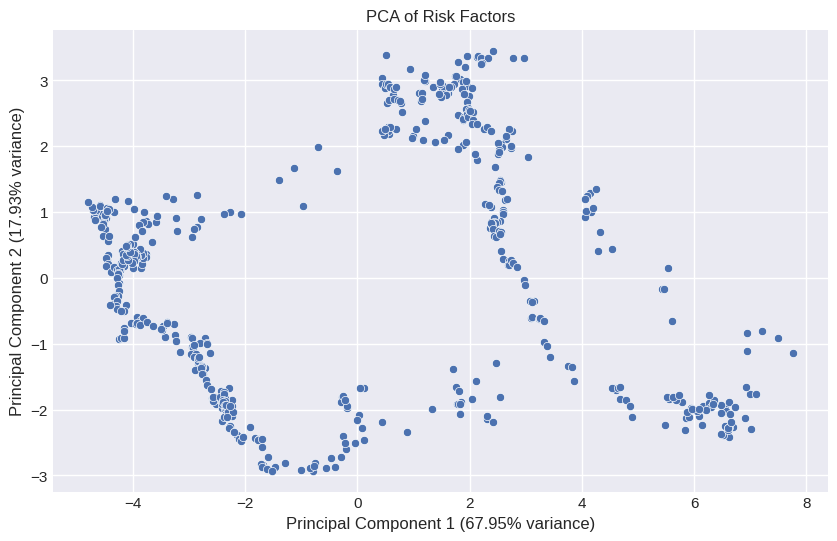

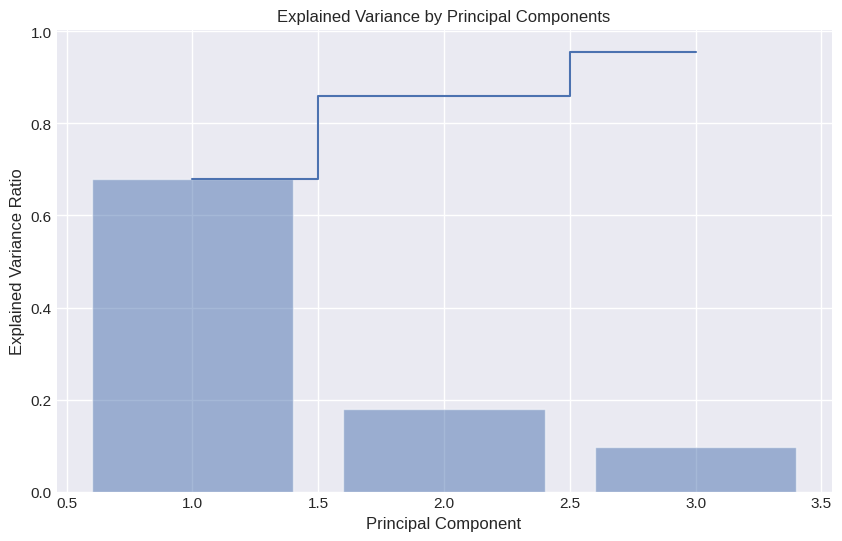

In [31]:
columns_to_use = [
    'MOEXBC', 'RTSI', 'BRENT', 'MOEX', 'USD', 'EUR',
    'v_0_25', 'v_0_5', 'v_0_75', 'v_1', 'v_2',
    'v_3', 'v_5', 'v_7', 'v_10', 'v_15', 'v_20', 'v_30'
]

scaler = StandardScaler()
df_risk_scaled = scaler.fit_transform(df_risk[columns_to_use])

pca = PCA(n_components=3)  # Оставим первые две главные компоненты для визуализации
principal_components = pca.fit_transform(df_risk_scaled)

df_pca = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3'])

# Визуализация двух главных компонентов
plt.figure(figsize=(10,6))
sns.scatterplot(x='PC1', y='PC2', data=df_pca)
plt.title('PCA of Risk Factors')
plt.xlabel(f'Principal Component 1 ({pca.explained_variance_ratio_[0]*100:.2f}% variance)')
plt.ylabel(f'Principal Component 2 ({pca.explained_variance_ratio_[1]*100:.2f}% variance)')
plt.grid(True)
plt.show()

# Визуализация объясненной дисперсии
plt.figure(figsize=(10,6))
plt.bar(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_, alpha=0.5, align='center')
plt.step(range(1, len(pca.explained_variance_ratio_)+1), np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance by Principal Components')
plt.grid(True)
plt.show()

In [32]:
df_risk.to_csv('df_risk.csv', index=False, header=True)

# БОНУС ОПЦИОН

### Условие задания

Дополнительный портфель 1:
- Состоит из двух выбранных опционов (1 Call и 1 Put) с различными ценами исполнения.
- Оба опциона должны быть "в деньгах". Это означает, что для Call опциона текущая цена базового актива должна быть выше цены исполнения, а для Put опциона - наоборот, текущая цена базового актива должна быть ниже цены исполнения.
- Базовый актив у обоих опционов должен иметь стоимость 1 млн руб.

Дополнительный портфель 2:
- Состоит из двух гипотетических облигаций со встроенными опционами.
- Одна облигация имеет опцион Put, встроенный 1 января 2024 г. со страйком 100%.
- Другая облигация имеет опцион Call, встроенный 1 января 2024 г. со страйком 100%.
- Эти облигации эквивалентны одной из выбранных государственных облигаций.

### Что мы хотим сделать
1. Выбрать модели оценки справедливой стоимости для каждого портфеля.
2. Используя реальные данные, оценить параметры модели.
3. Вычислить и сравнить расчетные цены активов в портфелях на одну выбранную дату.

### Шаг 1: Получение данных для выбранных опционов (Портфель 1)


### Выполнение задачи для Портфеля 1

1. Выбор моделей оценки справедливой стоимости:

Так как опционы в дополнительном портфеле 1 — опционы на фьючерсы на базовый актив, модель Black-Scholes для фьючерсов является подходящей.

2. Оценка параметров модели:

Необходимо использовать реальные данные для оценки параметров:
- Цена исполнения (K)
- Текущая цена фьючерса (F)
- Время до истечения опциона (T)
- Безрисковая ставка (r)
- Волатильность (σ)

3. Расчёт и сравнение цен.

In [33]:
options_api_url = "https://iss.moex.com/iss/engines/futures/markets/options/securities.json"
response = requests.get(options_api_url)
options_data = response.json()

# Преобразование данных в DataFrame
options_df = pd.DataFrame(
    options_data['securities']['data'], 
    columns=options_data['securities']['columns']
)

options_df.head()

,SECID,BOARDID,SHORTNAME,SECNAME,PREVSETTLEPRICE,DECIMALS,MINSTEP,LASTTRADEDATE,LASTDELDATE,LATNAME,ASSETCODE,PREVOPENPOSITION,PREVPRICE,OPTIONTYPE,STEPPRICE,IMNP,IMP,IMBUY,IMTIME,BUYSELLFEE,SCALPERFEE,NEGOTIATEDFEE,EXERCISEFEE,STRIKE,CENTRALSTRIKE,UNDERLYINGASSET,UNDERLYINGTYPE,UNDERLYINGSETTLEPRICE
0,AF10000BC5,ROPD,AFLT-3.25M190325CA10000,Марж. амер. Call 10000 с исп. 19 марта на фьюч...,1.0,0,1.0,2025-03-19,2025-03-19,AFLT-3.25M190325CA10000,AFLT,0.0,0.0,C,1.0,1944.20,3315.97,1.00,2024-06-20 18:59:28,0.02,0.01,0.02,0.66,10000.0,7250.0,AFH5,F,7197.0
1,AF10000BI4,ROPD,AFLT-9.24M180924CA10000,Марж. амер. Call 10000 с исп. 18 сент. на фьюч...,1.0,0,1.0,2024-09-18,2024-09-18,AFLT-9.24M180924CA10000,AFLT,0.0,0.0,C,1.0,1872.99,3261.53,1.00,2024-06-20 18:59:08,0.02,0.01,0.02,0.66,10000.0,6750.0,AFU4,F,6656.0
2,AF10000BL4,ROPD,AFLT-12.24M181224CA10000,Марж. амер. Call 10000 с исп. 18 дек. на фьюч....,1.0,0,1.0,2024-12-18,2024-12-18,AFLT-12.24M181224CA10000,AFLT,0.0,0.0,C,1.0,1904.73,3308.71,1.00,2024-06-20 18:59:14,0.02,0.01,0.02,0.66,10000.0,6750.0,AFZ4,F,6860.0
3,AF10000BO5,ROPD,AFLT-3.25M190325PA10000,Марж. амер. Put 10000 с исп. 19 марта на фьюч....,2900.0,0,1.0,2025-03-19,2025-03-19,AFLT-3.25M190325PA10000,AFLT,0.0,0.0,P,1.0,3316.97,1944.36,2882.48,2024-06-20 18:59:28,0.56,0.28,0.19,0.66,10000.0,7250.0,AFH5,F,7197.0
4,AF10000BU4,ROPD,AFLT-9.24M180924PA10000,Марж. амер. Put 10000 с исп. 18 сент. на фьюч....,3351.0,0,1.0,2024-09-18,2024-09-18,AFLT-9.24M180924PA10000,AFLT,0.0,0.0,P,1.0,3262.53,1873.15,3249.46,2024-06-20 18:59:08,0.52,0.26,0.18,0.66,10000.0,6750.0,AFU4,F,6656.0


In [34]:
# Фильтрация Call и Put опционов
call_options = options_df[options_df['OPTIONTYPE'] == 'C']
put_options = options_df[options_df['OPTIONTYPE'] == 'P']

# Рассчитываем приблизительную рыночную цену базового актива
# Используя среднее значение страйк-цены и цену закрытия (PREVSETTLEPRICE)
call_mean_price = call_options['PREVSETTLEPRICE'].mean()
put_mean_price = put_options['PREVSETTLEPRICE'].mean()

# Примерная оценка рыночной цены базового актива
F = (call_mean_price + put_mean_price) / 2

print(f"Оценка рыночной цены базового актива: {F}")

Оценка рыночной цены базового актива: 3391.6805923890315


In [35]:
call_in_the_money = call_options[call_options['STRIKE'] < F]
put_in_the_money = put_options[put_options['STRIKE'] > F]

# Убедимся, что наборы данных не пусты
if call_in_the_money.empty or put_in_the_money.empty:
    raise ValueError("Невозможно найти подходящие опционы 'в деньгах'.")

# Выбор опционов с самыми близкими страйками к текущей цене базового актива
nearest_call_option = call_in_the_money.iloc[(call_in_the_money['STRIKE'] - F).abs().argsort()][:1]
nearest_put_option = put_in_the_money.iloc[(put_in_the_money['STRIKE'] - F).abs().argsort()][:1]

strike_price_call = nearest_call_option['STRIKE'].values[0]
strike_price_put = nearest_put_option['STRIKE'].values[0]

print(f"В деньгах страйк цена Call опциона: {strike_price_call}")
print(f"В деньгах страйк цена Put опциона: {strike_price_put}")

В деньгах страйк цена Call опциона: 3390.0
В деньгах страйк цена Put опциона: 3400.0


In [47]:
from scipy.stats import norm

r = df_risk.loc[df_risk['date'] == pd.to_datetime("2023-02-15"), 'v_0_25'].values[0] / 100
current_date = "2023-02-15"

maturity_date = "2024-01-01"
T = (datetime.strptime(maturity_date, "%Y-%m-%d") - datetime.strptime(current_date, "%Y-%m-%d")).days / 365
sigma = 0.2  # Волатильность, примерное значение

def black_scholes_option(F, K, T, r, sigma, option_type="call"):
    d1 = (np.log(F/K) + 0.5 * sigma**2 * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    
    if option_type == "call":
        option_price = np.exp(-r * T) * (F * norm.cdf(d1) - K * norm.cdf(d2))
    elif option_type == "put":
        option_price = np.exp(-r * T) * (K * norm.cdf(-d2) - F * norm.cdf(-d1))
    else:
        raise ValueError(f"Invalid option type: {option_type}")
    
    return option_price

# Расчет цены опционов
price_call = black_scholes_option(F, strike_price_call, T, r, sigma, option_type="call")
price_put = black_scholes_option(F, strike_price_put, T, r, sigma, option_type="put")

print(f"Цена Call опциона: {price_call}")
print(f"Цена Put опциона: {price_put}")

Цена Call опциона: 237.8526301643015
Цена Put опциона: 241.33251731104372


### Выполнение задачи для Портфеля 2

1. Выбор моделей оценки справедливой стоимости:

Для облигаций со встроенными опционами можно использовать подход бинарного опциона или модель оценки с учётом опционов.

2. Расчет справедливой стоимости активов.


In [63]:
face_value = 100  # номинал облигации
coupon_rate = 0.03  # купонная ставка
current_date = "2023-02-15"
maturity_date_bond = "2025-01-01"  # дата истечения облигации
offer_date = "2024-01-01"  # дата оферты
r = df_risk.loc[df_risk['date'] == pd.to_datetime("2023-02-15"), 'v_0_25'].values[0] / 100  # безрисковая ставка
volatility = 0.1  # волатильность процентной ставки
n_periods_per_year = 2  # периодичность купонных выплат (полугодие)

# Расчет времени до соответственных дат
T_maturity_bond = (datetime.strptime(maturity_date_bond, "%Y-%m-%d") - datetime.strptime(current_date, "%Y-%m-%d")).days / 365
T_offer = (datetime.strptime(offer_date, "%Y-%m-%d") - datetime.strptime(current_date, "%Y-%m-%d")).days / 365

# Определение параметров биномиального дерева
n = int(T_maturity_bond * n_periods_per_year)
dt = T_maturity_bond / n
u = np.exp(volatility * np.sqrt(dt))
d = 1 / u
p = (np.exp(r * dt) - d) / (u - d)

# Функция для расчета цены облигации без встроенных опционов
def bond_price(face_value, coupon_rate, T, r):
    coupon_payment = face_value * coupon_rate / n_periods_per_year
    n = int(T * n_periods_per_year)
    discounted_coupons = sum([coupon_payment / ((1 + r / n_periods_per_year)**i) for i in range(1, n + 1)])
    discounted_face_value = face_value / ((1 + r / n_periods_per_year) ** n)
    return discounted_coupons + discounted_face_value

# Функция для построения биномиального дерева для ценообразования облигаций с опционом
def build_binomial_tree_with_options(face_value, coupon_rate, n, dt, u, d, r, p, option_type=None, T_offer=None):
    tree = np.zeros((n + 1, n + 1))
    
    # Заполнение дерева конечными ценами облигаций (учет купонной выплаты)
    for j in range(n + 1):
        tree[n, j] = face_value + face_value * coupon_rate / n_periods_per_year

    # Обратная индукция для расчета цен облигаций
    for i in range(n - 1, -1, -1):
        for j in range(i + 1):
            future_value = (p * tree[i + 1, j + 1] + (1 - p) * tree[i + 1, j]) * np.exp(-r * dt)
            coupon_payment = face_value * coupon_rate / n_periods_per_year
            option_price = future_value + coupon_payment
            
            # Проверка на применение опциона
            if option_type == "call" and T_offer is not None and ((i + 1) * dt >= T_offer > i * dt):
                tree[i, j] = min(face_value, option_price)
            elif option_type == "put" and T_offer is not None and ((i + 1) * dt >= T_offer > i * dt):
                tree[i, j] = max(face_value, option_price)
            else:
                tree[i, j] = option_price

    return tree

# Редактируем вывод для корректности данных и проверки обработки
price_bond_no_options_initial = bond_price(face_value, coupon_rate, T_maturity_bond, r)

# Расчет цен облигаций с опционом с использованием биномиального дерева

tree_with_call = build_binomial_tree_with_options(face_value, coupon_rate, n, dt, u, d, r, p, option_type="call", T_offer=T_offer)
price_bond_with_call = tree_with_call[0, 0]

tree_with_put = build_binomial_tree_with_options(face_value, coupon_rate, n, dt, u, d, r, p, option_type="put", T_offer=T_offer)
price_bond_with_put = tree_with_put[0, 0]

print(f"Цена облигации без встроенных опционов (инициализирующая): {price_bond_no_options_initial:.2f}")
print(f"Цена облигации со встроенным опционом Call: {price_bond_with_call:.2f}")
print(f"Цена облигации со встроенным опционом Put: {price_bond_with_put:.2f}")


Цена облигации без встроенных опционов (инициализирующая): 93.86
Цена облигации со встроенным опционом Call: 92.62
Цена облигации со встроенным опционом Put: 96.97
